# Initialize

In [9]:
import numpy as np
import matplotlib.pyplot as plt

from datamanagement import SlabFile
import os
import datetime
from time import *
#from slab import *
from handy import prev_data
import sys 
project_path = os.path.abspath(os.path.join(os.getcwd(), '..', '..'))
print(project_path)
sys.path.append(project_path)
#new_path = r'/Users/sph/Library/CloudStorage/GoogleDrive-circuitqed@gmail.com/My Drive/Projects/Materials/materials-software/'
new_path = r'G:/My Drive/Projects/Materials/materials-software/'

sys.path.append(new_path)
%load_ext autoreload
%autoreload 2
import vna_measurement
from ZNB import ZNB20
VNA = ZNB20(address='10.108.30.65') # Stanford
#VNA = ZNB20(address='192.168.137.84') # SLAC

## Daily measurement settings
warm_att = 0 #dB
cold_att = 60

spar = 's11'

base_path = r'G:/My Drive/Projects/Materials/Data/250327-Cavity'
if not os.path.exists(base_path):
    os.makedirs(base_path)

c:\_Lib
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [10]:
VNA.reset()

# Single power scans

## Single scan

Calculated line delay: -1.6046277032338624e-09


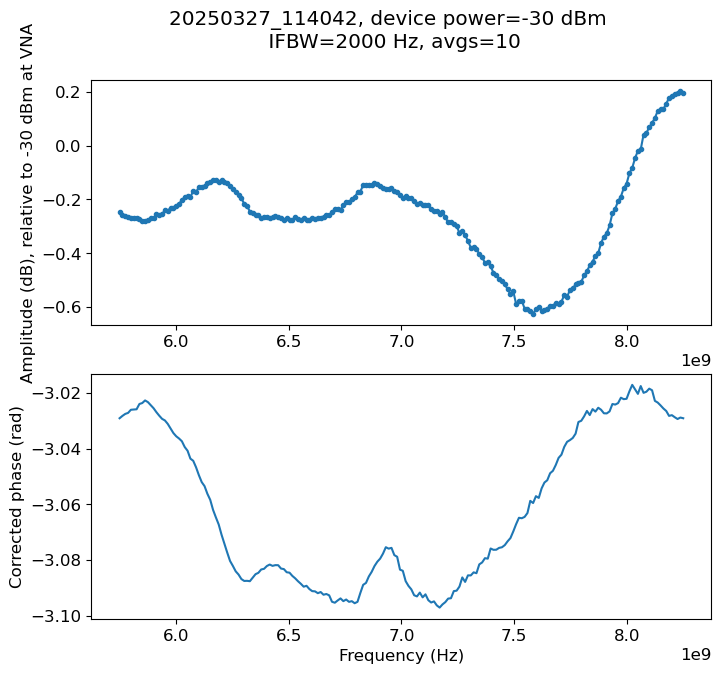

{'series': '20250327_114042',
 'amps': array([-0.2455, -0.2567, -0.262 , -0.2657, -0.2702, -0.2689, -0.2674,
        -0.2743, -0.2793, -0.2809, -0.2755, -0.2705, -0.2693, -0.2553,
        -0.2587, -0.2543, -0.2398, -0.2439, -0.2303, -0.2316, -0.2247,
        -0.2155, -0.203 , -0.1902, -0.1872, -0.1897, -0.1701, -0.1732,
        -0.1537, -0.1542, -0.1504, -0.1403, -0.1353, -0.1287, -0.1273,
        -0.1351, -0.1279, -0.1361, -0.1396, -0.1517, -0.1606, -0.1737,
        -0.1834, -0.1957, -0.2159, -0.2247, -0.2448, -0.2499, -0.2584,
        -0.2561, -0.2679, -0.2668, -0.2634, -0.2679, -0.265 , -0.2618,
        -0.265 , -0.27  , -0.2781, -0.2699, -0.277 , -0.2775, -0.2649,
        -0.2718, -0.2756, -0.2699, -0.2747, -0.2763, -0.2694, -0.2715,
        -0.2674, -0.2692, -0.2636, -0.2572, -0.2591, -0.2471, -0.235 ,
        -0.2342, -0.2388, -0.2198, -0.2111, -0.2112, -0.1974, -0.1915,
        -0.1741, -0.1705, -0.1469, -0.1461, -0.1468, -0.1456, -0.1378,
        -0.1437, -0.1483, -0.1567, -0.1

In [11]:
#%matplotlib widget
expt_path = base_path
span=2.5e9
power = -30
avgs = 10
#freq_center=7.4e9
freq_center = 7e9
bandwidth=2000


scan_def = {'freq_center':freq_center, 'span':span,  'bandwidth':bandwidth, 'power':power, 'npoints':200, 'averages':avgs}
#file_name = 'res_' + str(freq_center)[:7] + '_' + str(power)[1:] + 'dbm'
file_name = 'wide_scan'
vna_measurement.do_vna_scan(VNA, file_name, expt_path, scan_def, 's11')
#5.5167 5.828 6.0917 6.3365 6.377 6.6924 7.0564 7.38292
# 100 / 20 / 2 = 40
# 100 / 40 / 2 = 17.5
# 100 / 100 / 2 = 9.4
# 100 / 100 / 1 = 5.0
# 100 / 200 / 1 = 3

# 5.986213520, 6.264641450, 6.418856885, 6.570072000, 6.8067, 7.085925, 7.1553305, 7.3837534, 7.589974, 7.754795

# Segmented scan

In [ ]:
scan_def['npoints1']=10
scan_def['power']=-20
scan_def['npoints2']=50
scan_def['freq_center'] = 6016564070.351758
scan_def['span']=100000

vna_measurement.do_vna_scan_segments(VNA, file_name, expt_path, scan_def, warm_att=0, cold_att=50)

In [ ]:
scan_def['nb_points'] = 1000
vna_measurement.do_vna_scan(VNA, file_name, expt_path, scan_def, 's21')

## Broad frequency scan looking for resonances 

Calculated line delay: -3.9686398272682633e-07


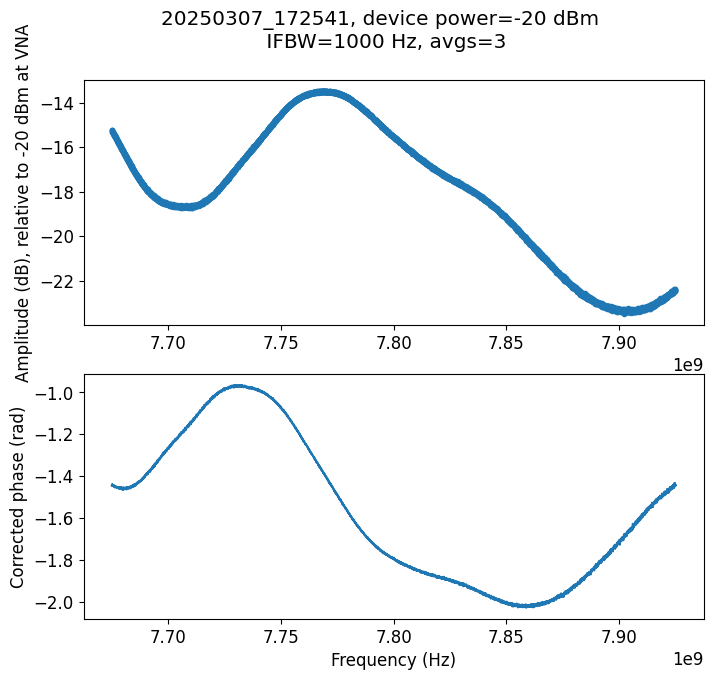

Calculated line delay: -4.0270721793786866e-07


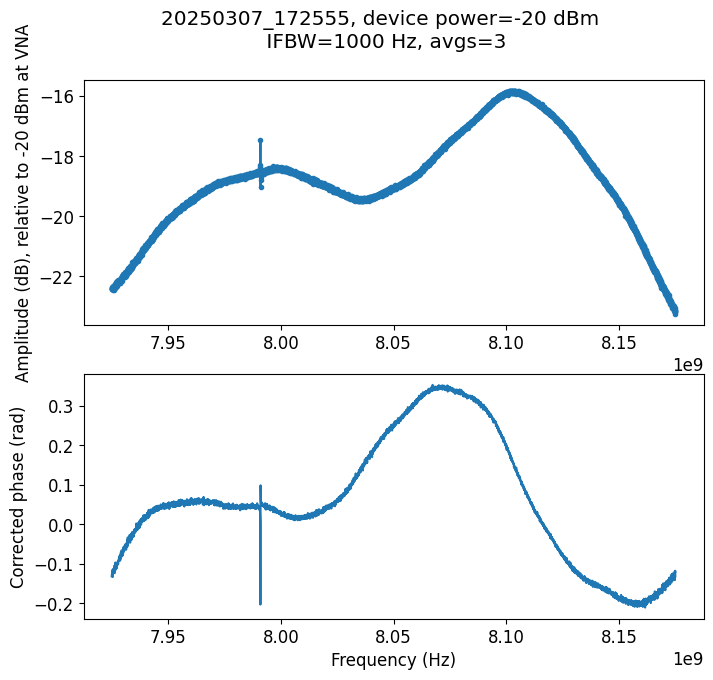

Calculated line delay: -3.94965089318605e-07


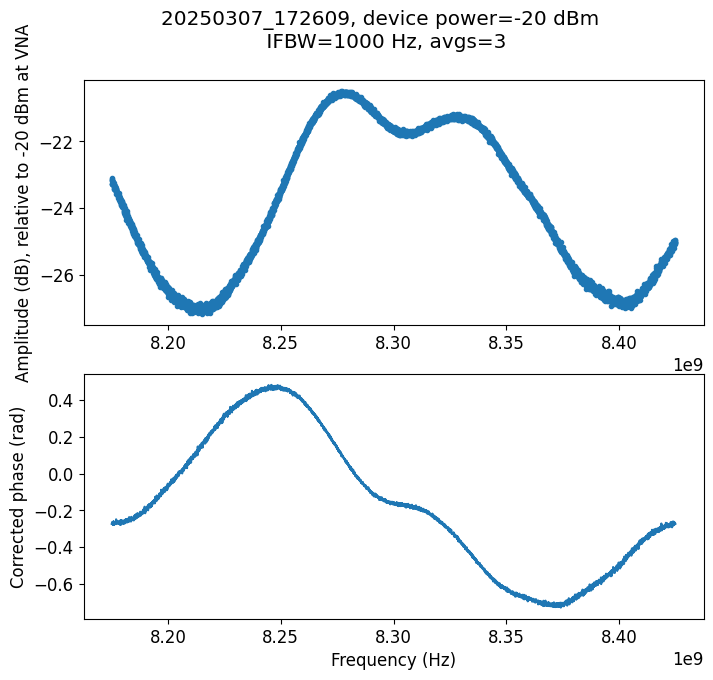

KeyboardInterrupt: 

In [10]:
expt_path = base_path
span=250e6
power = -20
avgs = 3
bandwidth=1000
freq_min=7.8e9
for i in range(9):
    freq_center = freq_min + i*span
    scan_def = {'freq_center':freq_center, 'span':span,  'bandwidth':bandwidth, 'power':power, 'npoints':5000, 'averages':avgs}
    file_name = 'res_' + str(freq_center)[:7] + '_' + str(power)[1:] + 'dbm'
    vna_measurement.do_vna_scan(VNA, file_name, expt_path, scan_def, 's21')

# Check resonators at one power 

In [ ]:
%matplotlib inline
expt_path = base_path
nb_points = 600
span=2e6
power = -90

freqs = np.array([5.9863])*1e9#, 6.2648, 6.4188, 6.5702, 6.8067, 7.085925, 7.1545, 7.3837534, 7.5901, 7.75485])*1e9
bandwidth=50
freq_min=6.4e9
avgs=1
for power in np.linspace(0, -80, 5):
    for freq_center in freqs:    
        
        scan_def = {'freq_center':freq_center, 'span':span,  'bandwidth':bandwidth, 'power':power, 'nb_points':int(nb_points), 'averages':avgs}
        file_name = 'res_' + str(freq_center)[:7] + '_' + str(power)[1:] + 'dbm'
        do_vna_scan(file_name, expt_path, scan_def)
        avgs = avgs*2



## Medium width scan checking each resonance 
Saves the minimum value of transmission to res_freqs for narrower scan next. 

Calculated line delay: -3.9807910842519224e-07


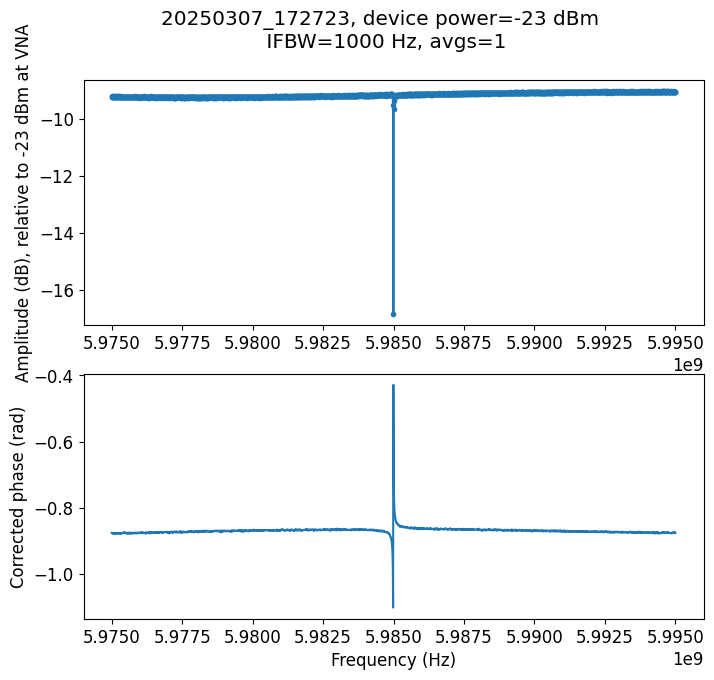

Calculated line delay: -3.992436636141387e-07


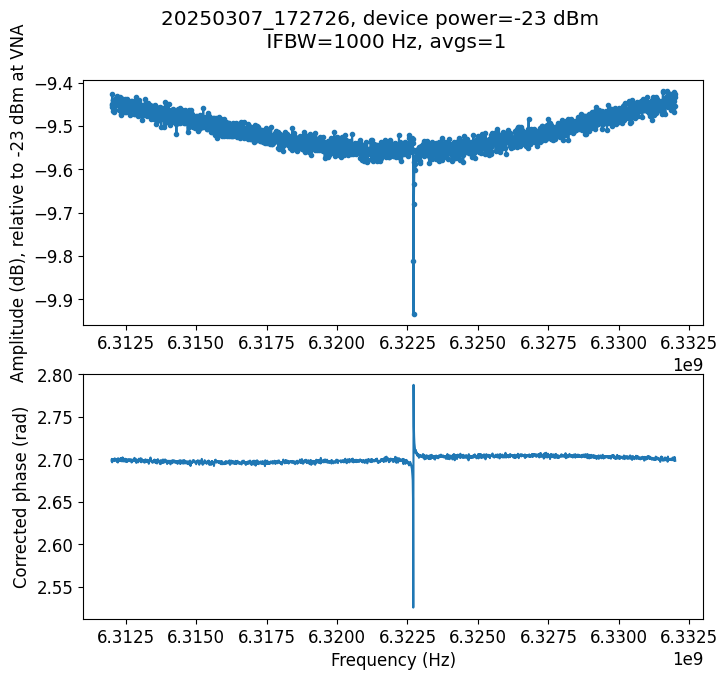

Calculated line delay: -4.036931878337834e-07


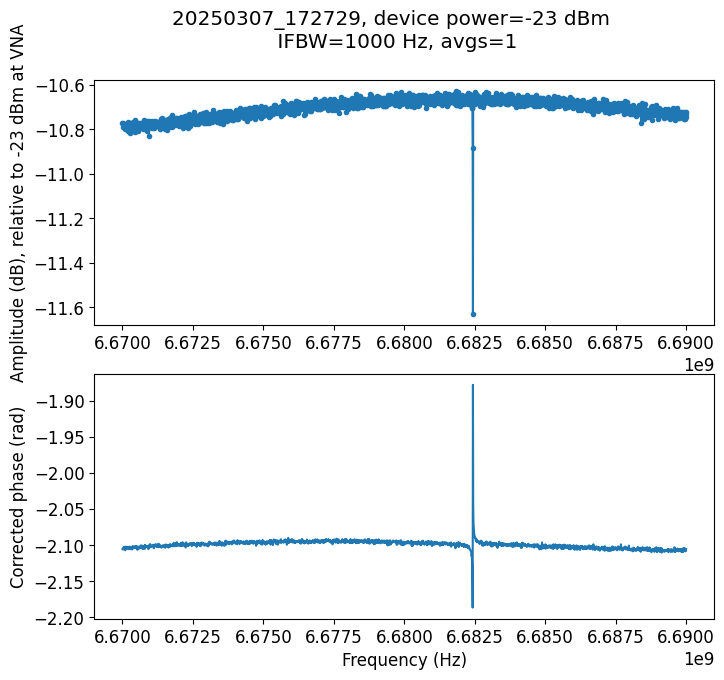

Calculated line delay: -4.028126297752218e-07


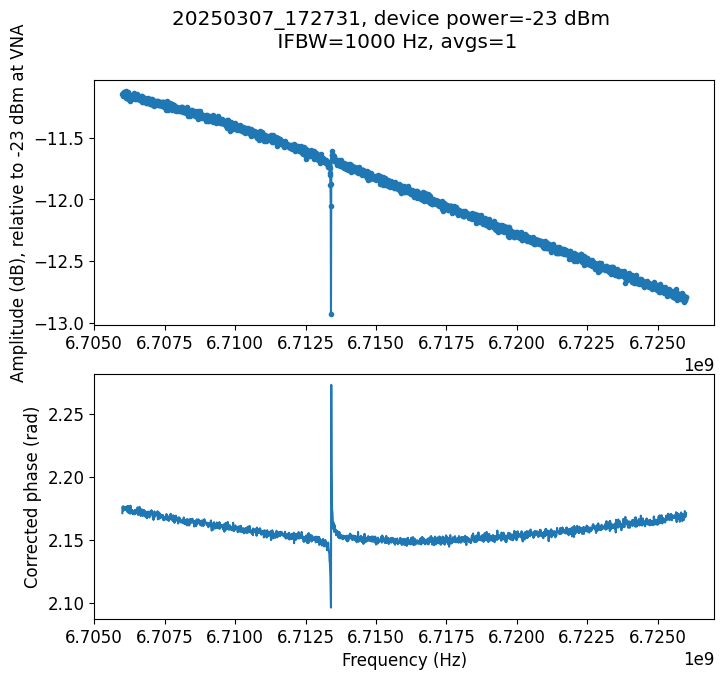

Calculated line delay: -3.9641822953235066e-07


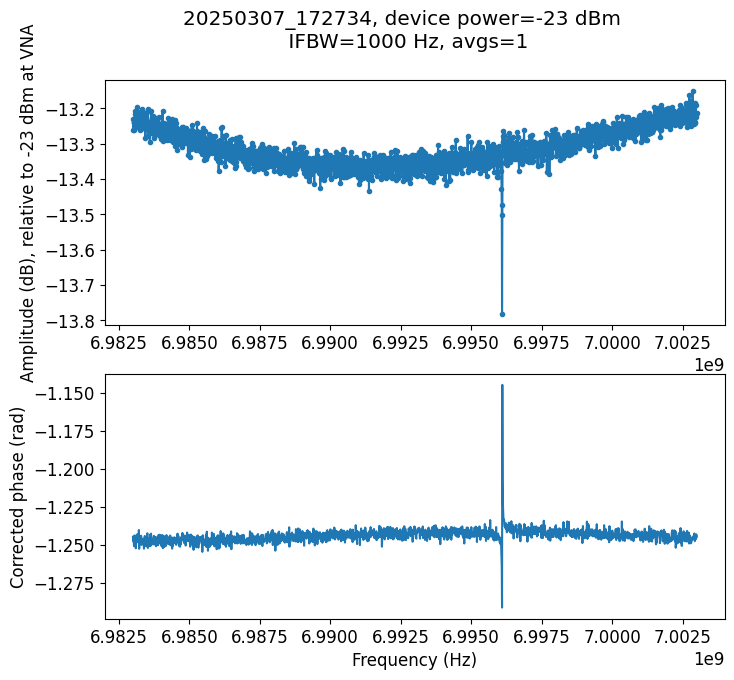

Calculated line delay: -3.925366401420557e-07


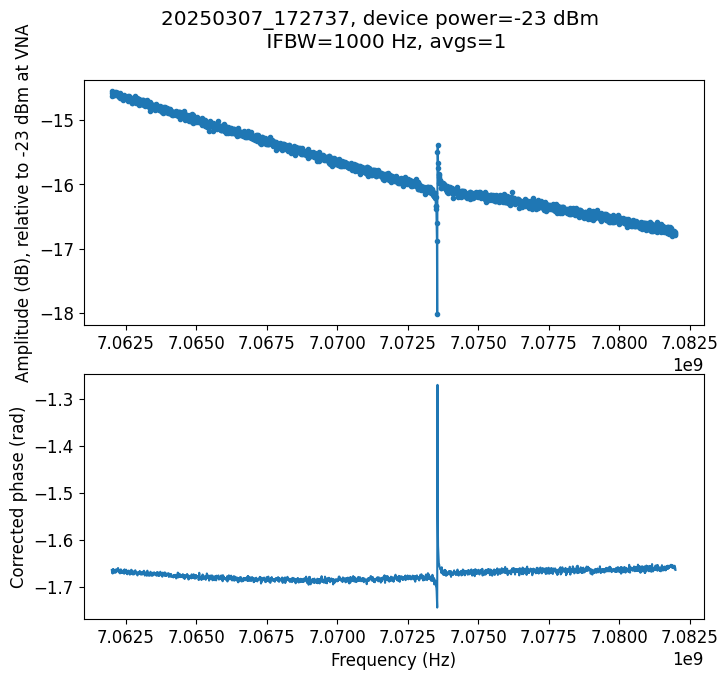

Calculated line delay: -3.996774733109128e-07


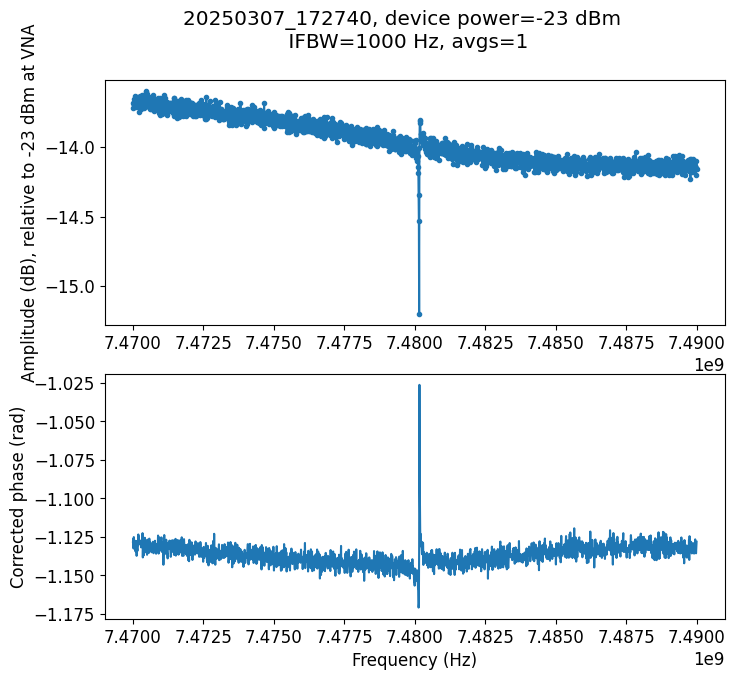

Calculated line delay: -4.038201106933643e-07


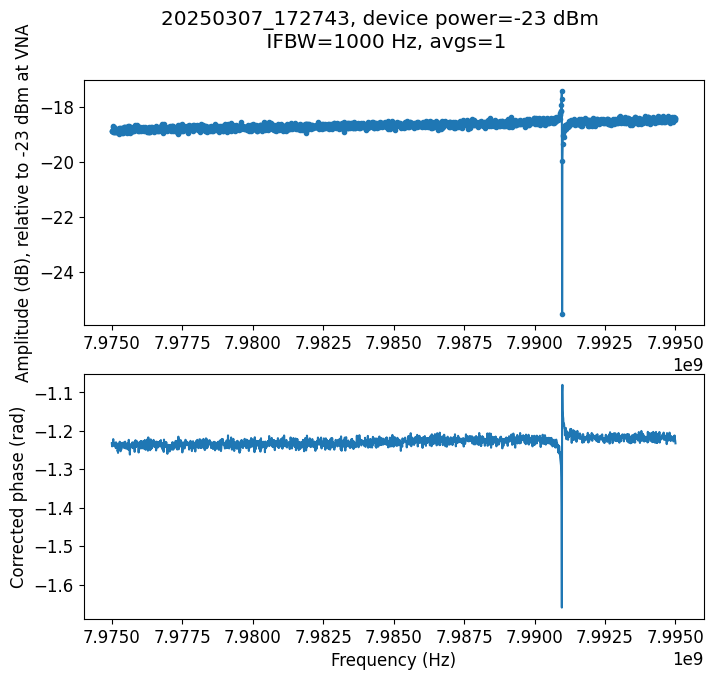

In [11]:
freq_centers = np.array([5.985,6.322,6.68,6.716,6.993, 7.072,7.48,7.985])*1e9

expt_path = base_path
span=20e6
res_freqs =[]
for freq_center in freq_centers:
    scan_def = {'freq_center':freq_center, 'span':span,  'bandwidth':1000, 'power':-23, 'npoints':2000, 'averages':1}
    file_name = 'res_' + str(freq_center)[:7] + '_' + str(power)[1:] + 'dbm'
    data=vna_measurement.do_vna_scan(VNA, file_name, expt_path, scan_def, 's21')
    res_freqs.append(data['freqs'][np.argmin(data['amps'])])

## Narrower scan before power sweep

Calculated line delay: 4.84916945035072e-07


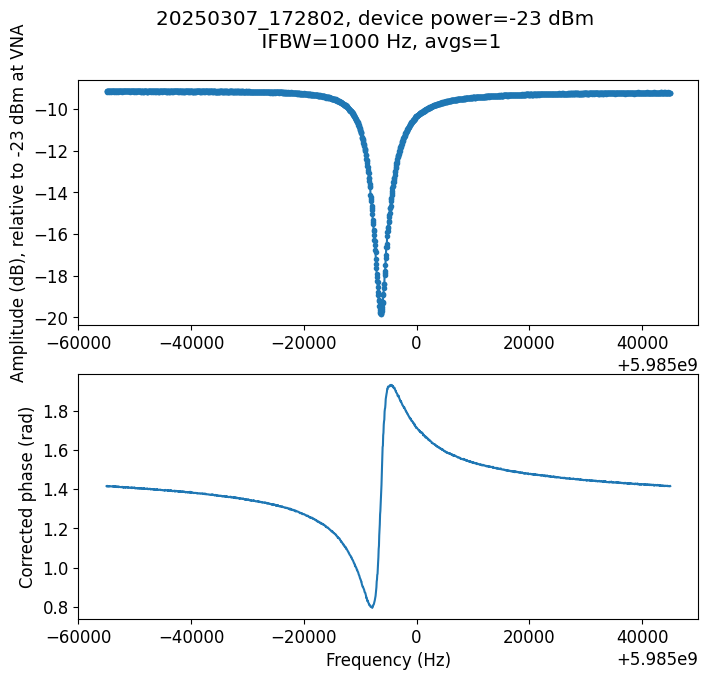

Calculated line delay: -1.1410184957248549e-07


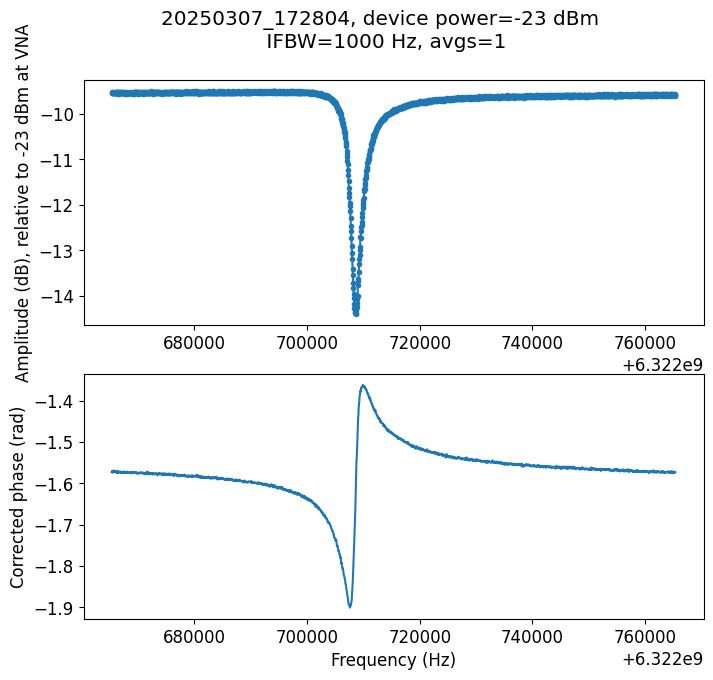

Calculated line delay: -8.529625367683648e-08


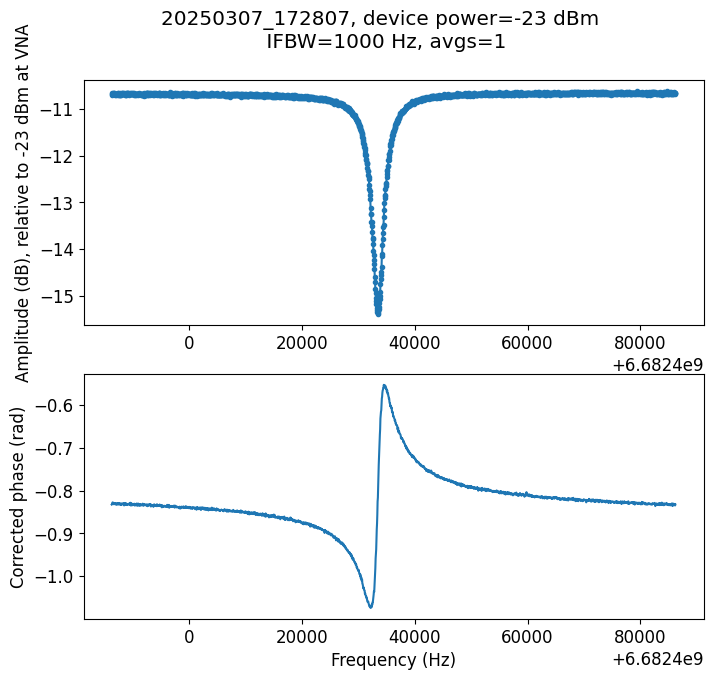

Calculated line delay: -3.19965995857563e-08


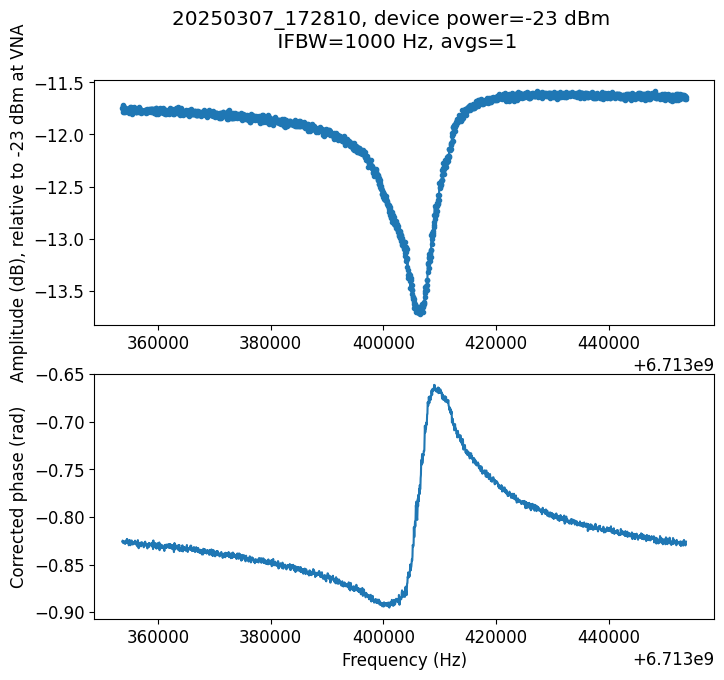

Calculated line delay: -2.4609892106482186e-07


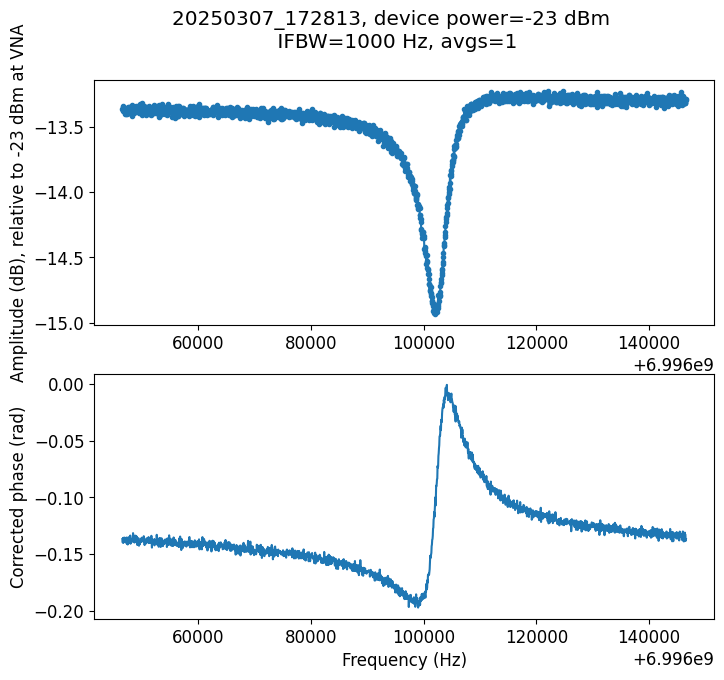

Calculated line delay: 1.0091283403347153e-07


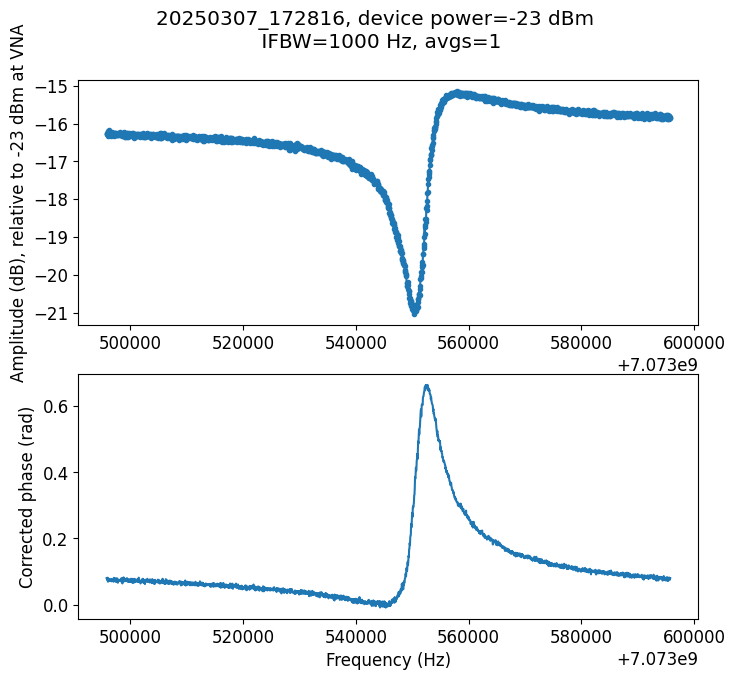

Calculated line delay: -1.7189871379204692e-07


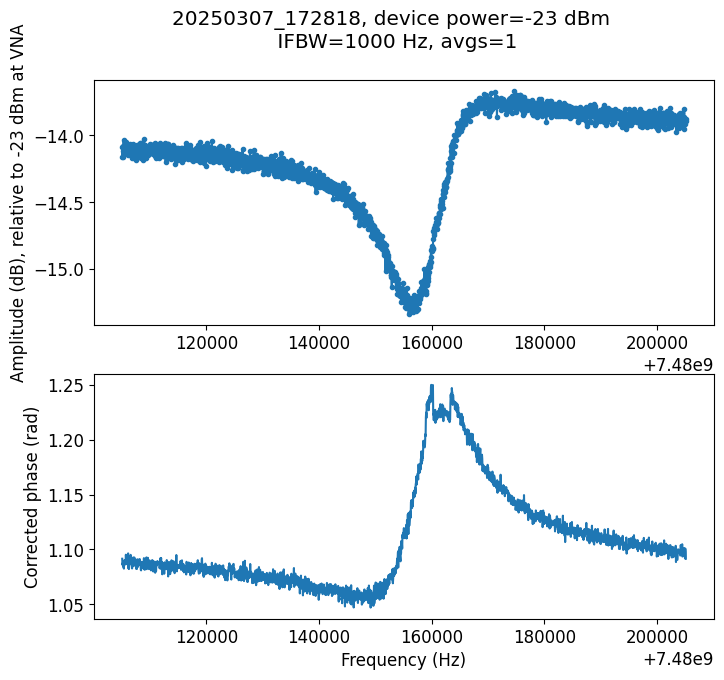

Calculated line delay: 6.116686158173202e-07


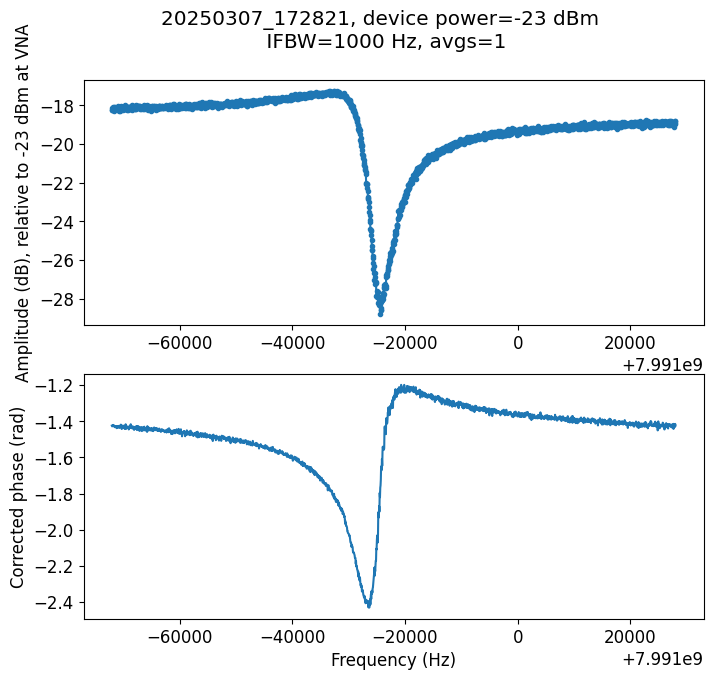

In [12]:
freq_list =[]
scan_def['span']=1e5
for res in res_freqs:
    scan_def['freq_center'] = res
    file_name = 'res_' + str(freq_center)[:7] + '_' + str(power)[1:] + 'dbm'
    data=vna_measurement.do_vna_scan(VNA, file_name, expt_path, scan_def, 's21')
    freq_list.append(data['freqs'][np.argmin(data['amps'])])

In [15]:
np.array(freq_list)

array([5.9850e+09, 6.3227e+09, 6.6824e+09, 6.7134e+09, 6.9961e+09,
       7.0736e+09, 7.4802e+09, 7.9910e+09])

# Power sweep

Expected time: 0.09 min
Time elapsed: 0.43 min, expected time: 0.09 min


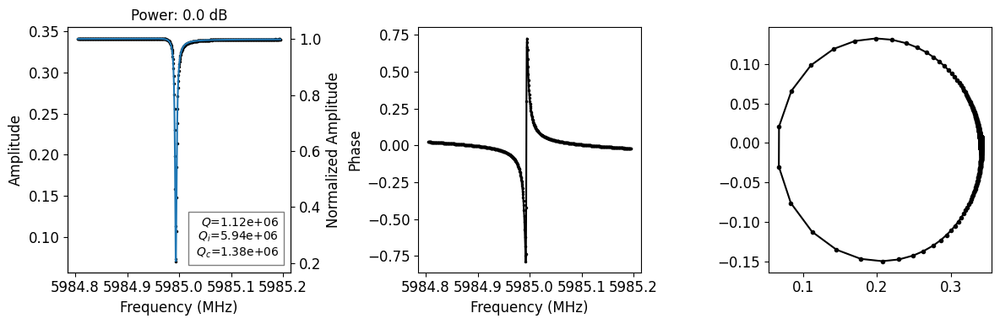

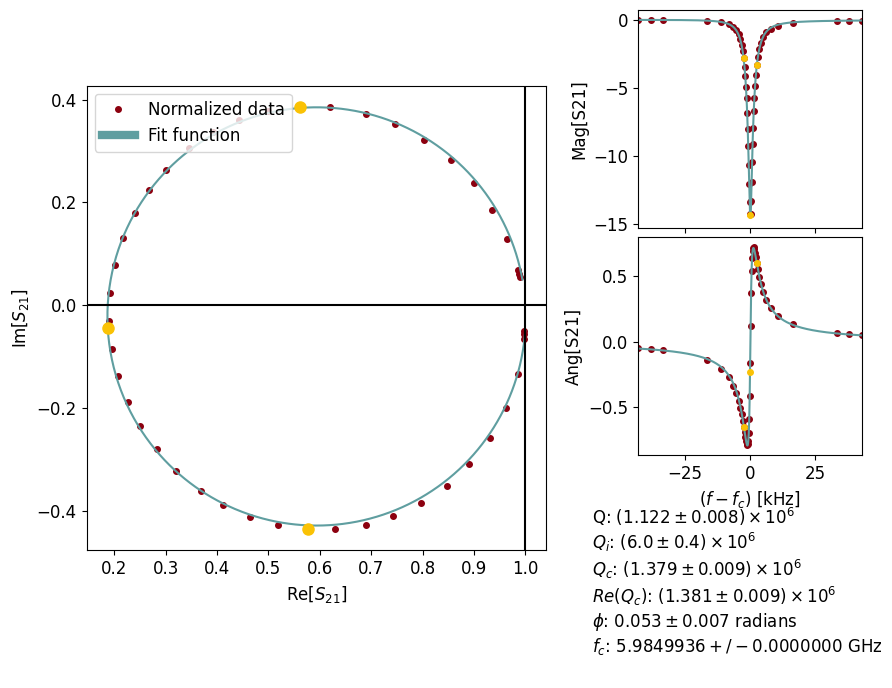

Tau proportionality: 1.5000261077111364e-06
Pin -50.0, N photons: 1.24e+11, navg: 0
Next time: 0.00 min, q_adj: 0.900
Expected time: 0.09 min
Time elapsed: 0.43 min, expected time: 0.09 min


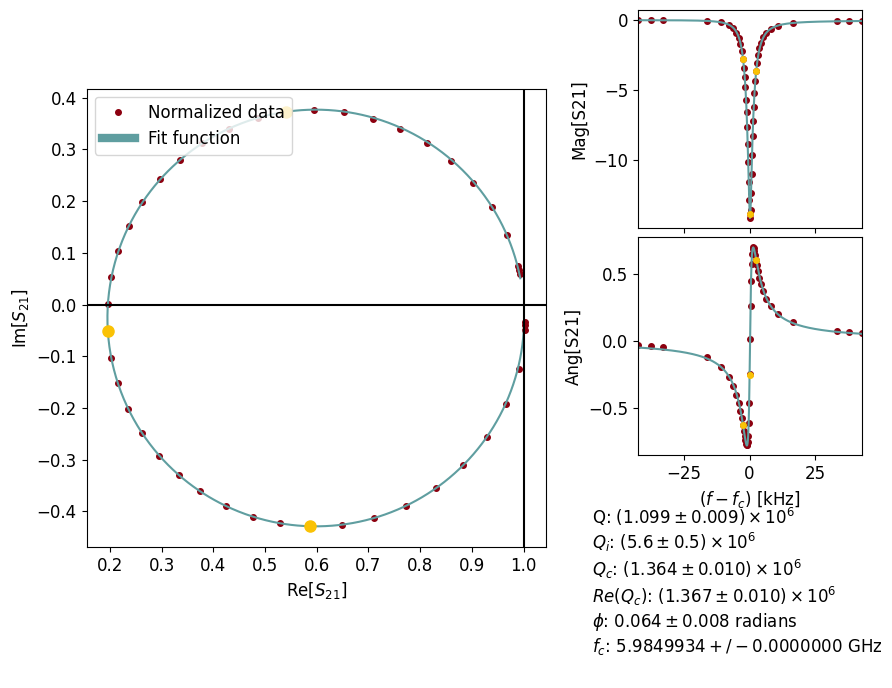

Tau proportionality: 4.8257181858842935e-06
Pin -55.0, N photons: 3.8e+10, navg: 0
Next time: 0.00 min, q_adj: 0.975
Expected time: 0.09 min
Time elapsed: 0.43 min, expected time: 0.09 min


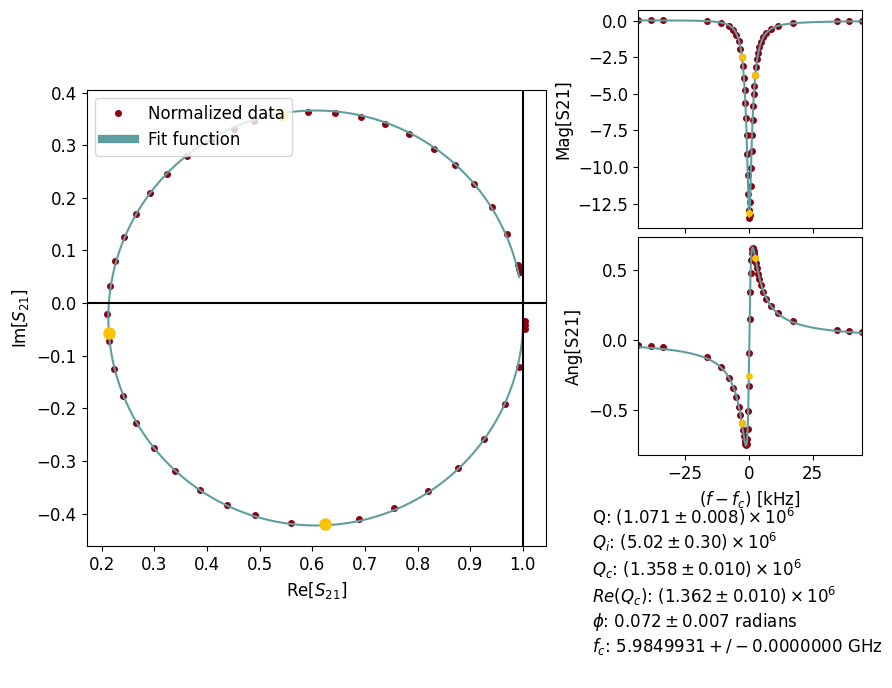

Tau proportionality: 1.584649200386584e-05
Pin -60.0, N photons: 1.15e+10, navg: 0
Next time: 0.00 min, q_adj: 0.974
Expected time: 0.09 min
Time elapsed: 0.43 min, expected time: 0.09 min


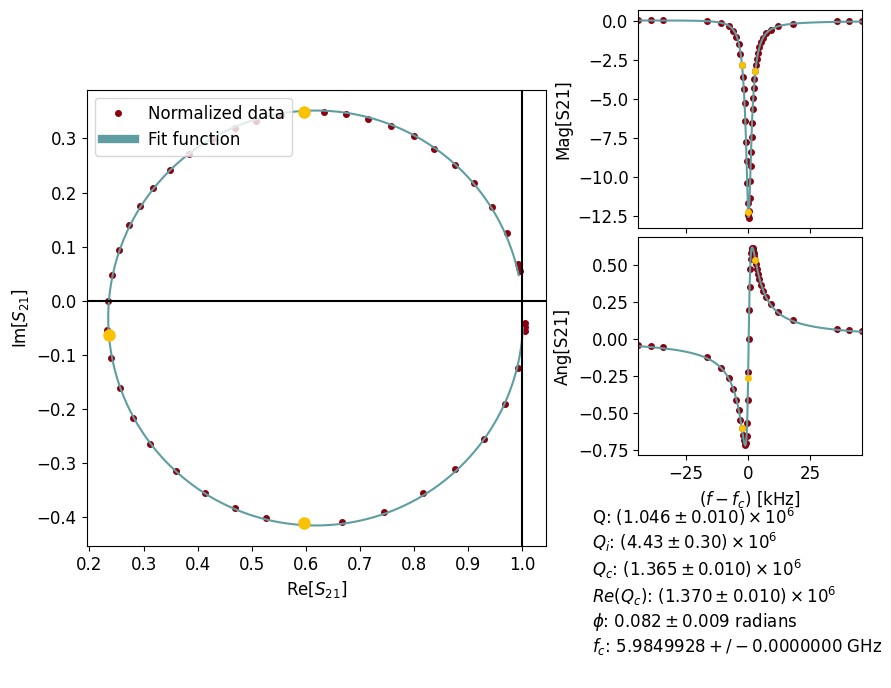

Tau proportionality: 5.2913478364182e-05
Pin -65.0, N photons: 3.44e+09, navg: 0
Next time: 0.00 min, q_adj: 0.972
Expected time: 0.09 min
Time elapsed: 0.43 min, expected time: 0.09 min


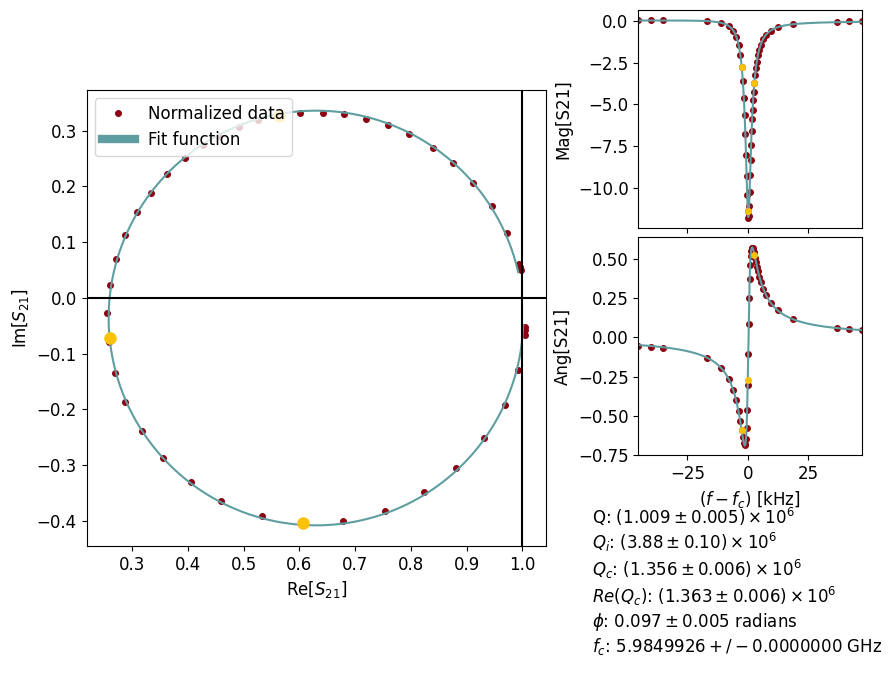

Tau proportionality: 0.00017799982498725774
Pin -70.0, N photons: 1.01e+09, navg: 0
Next time: 0.00 min, q_adj: 0.960
Expected time: 0.09 min
Time elapsed: 0.43 min, expected time: 0.09 min


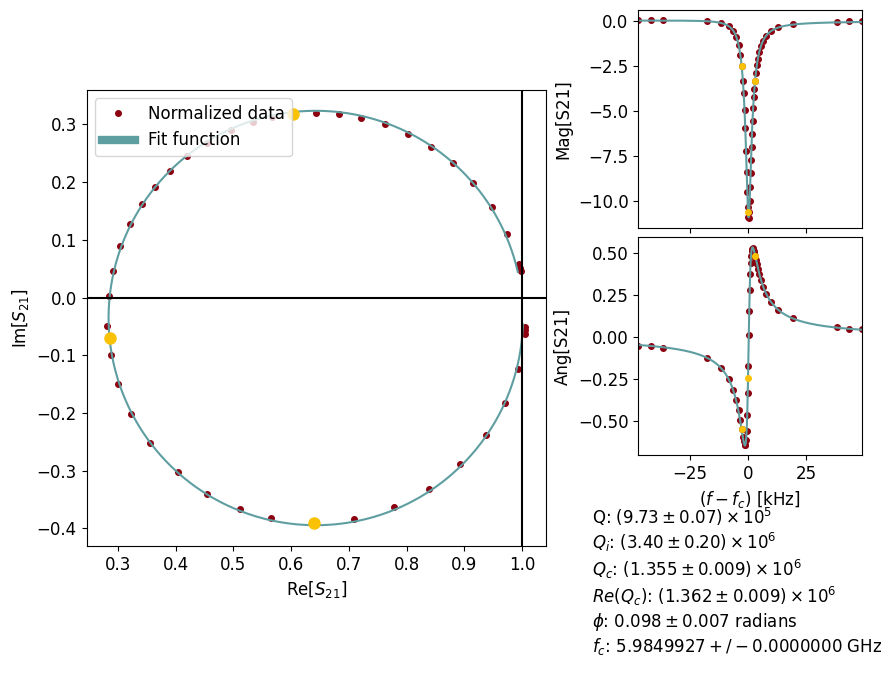

Tau proportionality: 0.0006008928976818307
Pin -75.0, N photons: 3e+08, navg: 0
Next time: 0.00 min, q_adj: 0.967
Expected time: 0.05 min
Time elapsed: 0.22 min, expected time: 0.05 min


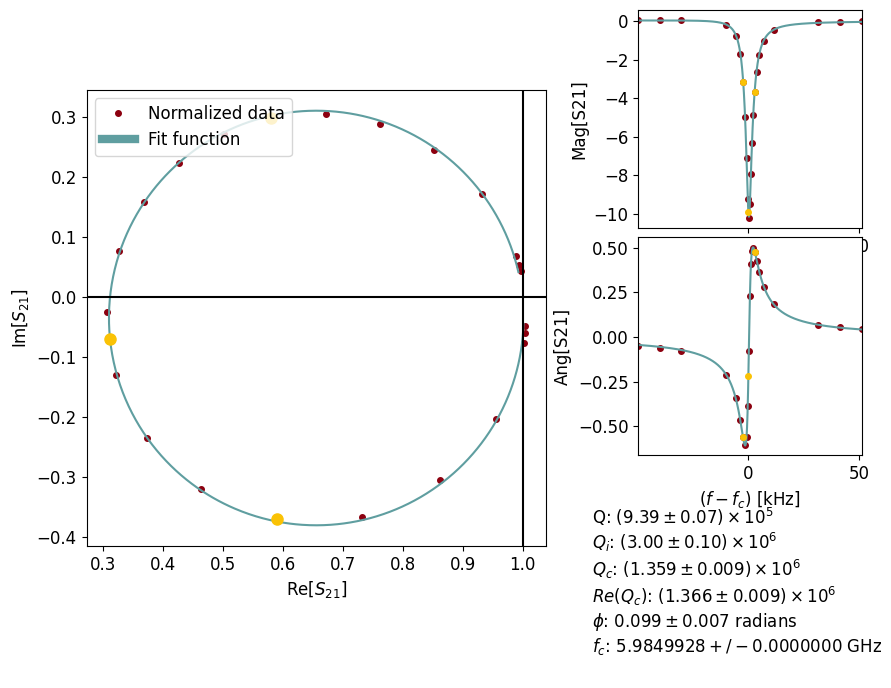

G:\My Drive/Projects/Materials/materials-software\scresonators\fit_resonator\ana_tls.py:29: RuntimeWarning: invalid value encountered in power
  return Qtls0 / tp(f, T) * np.sqrt(1 + (n / nc) ** beta * tp(f, T))


Fit parameters: [3.9683e+06 7.1261e+06 1.2787e+08 6.5071e-01]
Tau proportionality: 0.0020589279323874475
Pin -80.0, N photons: 8.76e+07, navg: 0
Next time: 0.00 min, q_adj: 0.963
Expected time: 0.05 min
Time elapsed: 0.22 min, expected time: 0.05 min


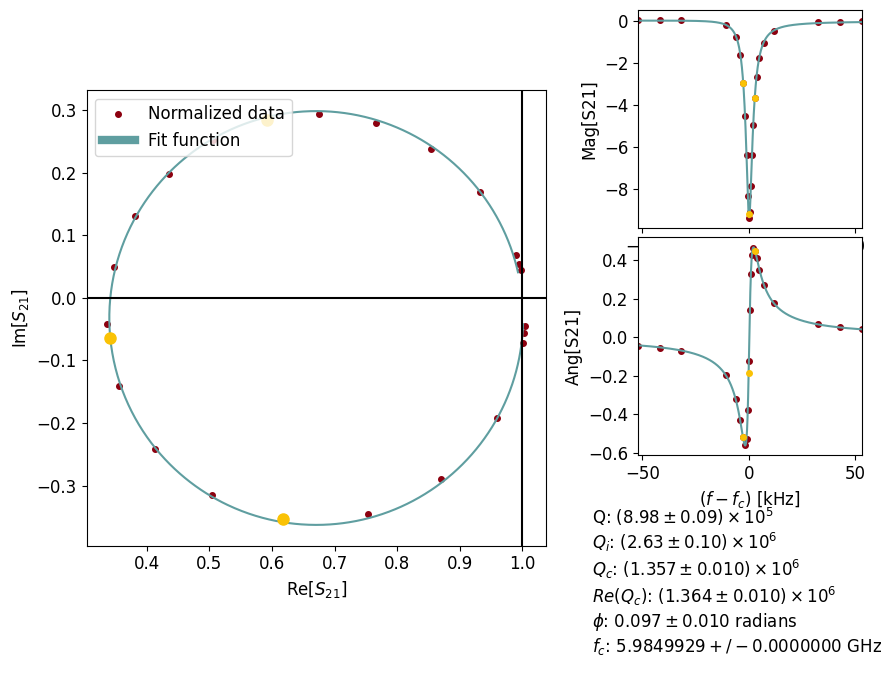

Fit parameters: [ 3171207.8224  7489398.3401 43385814.3688        0.5637]
Tau proportionality: 0.007057968991010941
Pin -85.0, N photons: 2.56e+07, navg: 0
Next time: 0.00 min, q_adj: 0.961
Expected time: 0.05 min
Time elapsed: 0.22 min, expected time: 0.05 min
Qi err: 0.006987101875542674


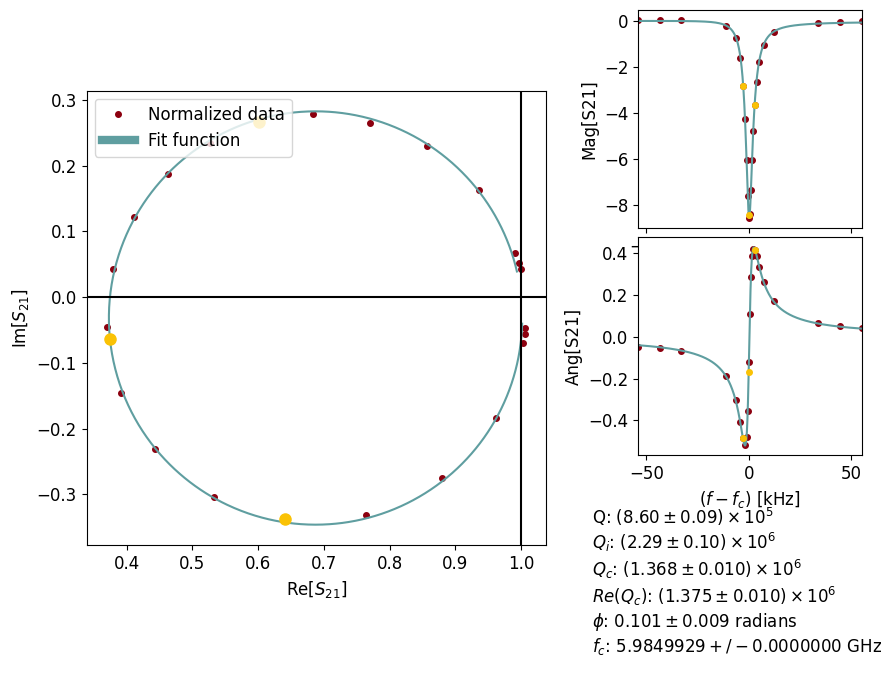

Fit parameters: [2264801.2672 8177476.2002 6447232.4588       0.4659]
Tau proportionality: 0.02485921339780557
Pin -90.0, N photons: 7.26e+06, navg: 0
Next time: 0.00 min, q_adj: 0.948
Expected time: 0.05 min
Time elapsed: 0.22 min, expected time: 0.05 min
Qi err: 0.0059418526166156345


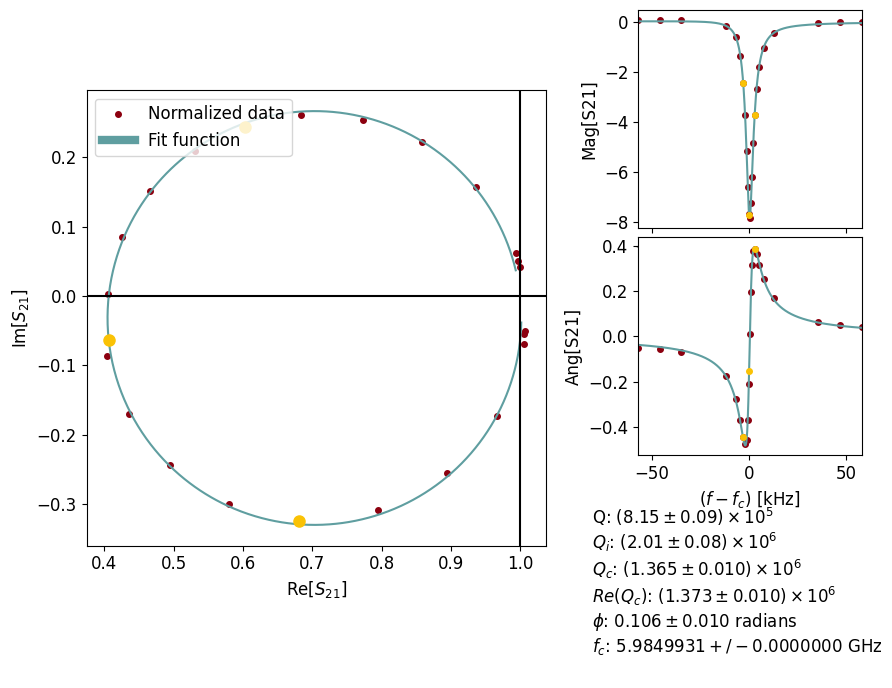

Fit parameters: [1866348.9716 8633030.9109 1867681.3848       0.4251]
Tau proportionality: 0.08670199396664138
Pin -95.0, N photons: 2.08e+06, navg: 0
Next time: 0.00 min, q_adj: 0.952
Expected time: 0.05 min
Time elapsed: 0.22 min, expected time: 0.05 min
Qi err: 0.009985699385347945


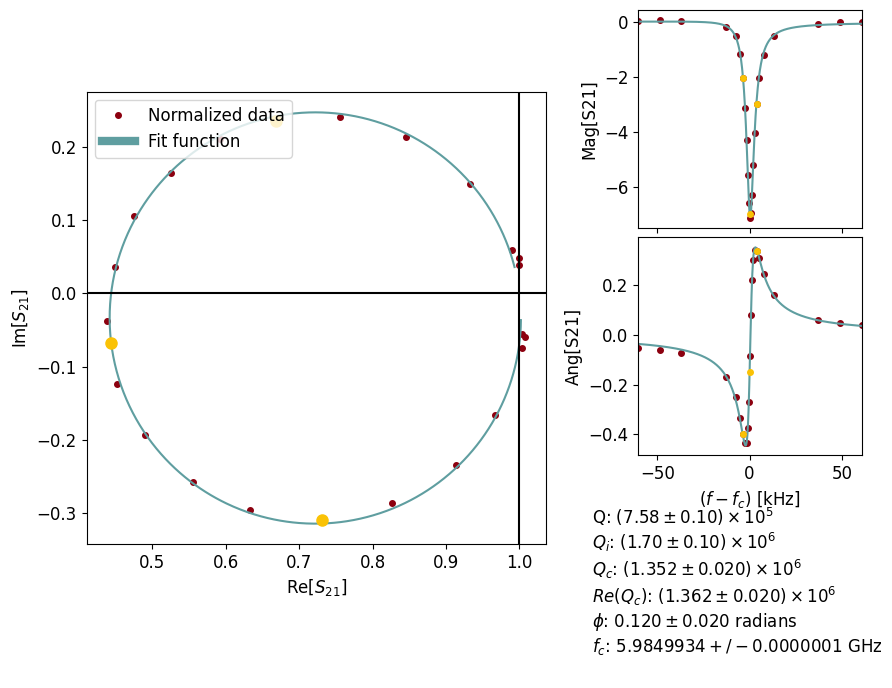

Fit parameters: [1508236.7104 9211786.3463  423378.6693       0.3881]
Tau proportionality: 0.30916946146308194
Pin -100.0, N photons: 5.84e+05, navg: 0
Next time: 0.00 min, q_adj: 0.942
Expected time: 0.05 min
Time elapsed: 0.22 min, expected time: 0.05 min
Qi err: 0.010715149574319778


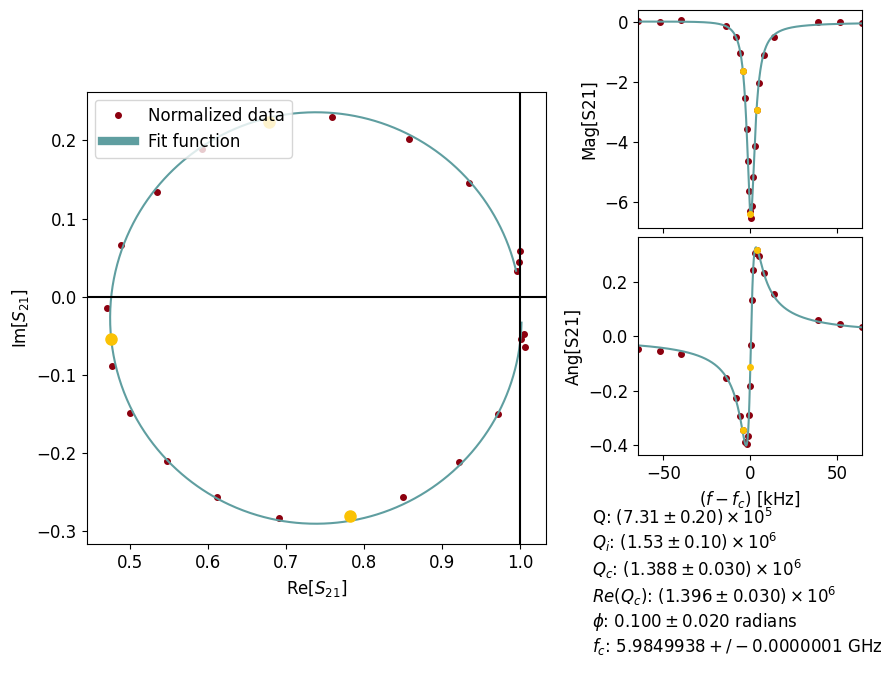

Fit parameters: [1298242.4519 9670329.4266  138819.4081       0.3664]
Tau proportionality: 1.0968202465594696
Pin -105.0, N photons: 1.65e+05, navg: 0
Next time: 0.00 min, q_adj: 0.944
Expected time: 0.05 min
Time elapsed: 0.22 min, expected time: 0.05 min
Qi err: 0.01406732090237798


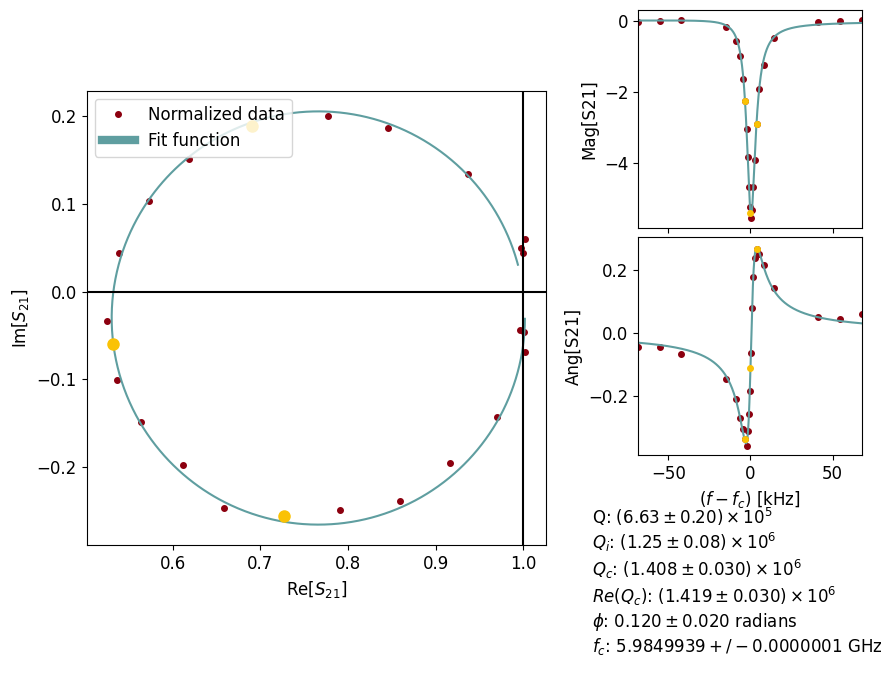

Fit parameters: [  734523.0932 11348702.0412     1543.3692        0.3152]
Tau proportionality: 4.438205938573168
Pin -110.0, N photons: 4.07e+04, navg: 2
Next time: 0.01 min, q_adj: 0.884
Expected time: 0.05 min
Time elapsed: 0.22 min, expected time: 0.05 min
Qi err: 0.008374549763634581


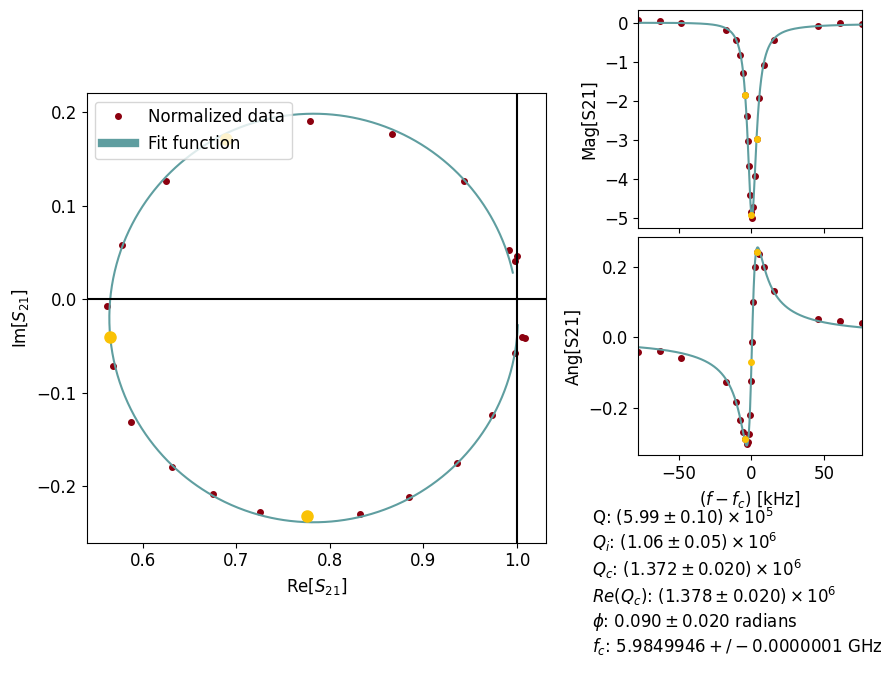

Fit parameters: [  539611.2647 12001377.3564      133.9037        0.3021]
Tau proportionality: 16.19456932276957
Pin -115.0, N photons: 1.12e+04, navg: 6
Next time: 0.02 min, q_adj: 0.931
Expected time: 0.05 min
Time elapsed: 0.22 min, expected time: 0.05 min
Qi err: 0.007801248406763556


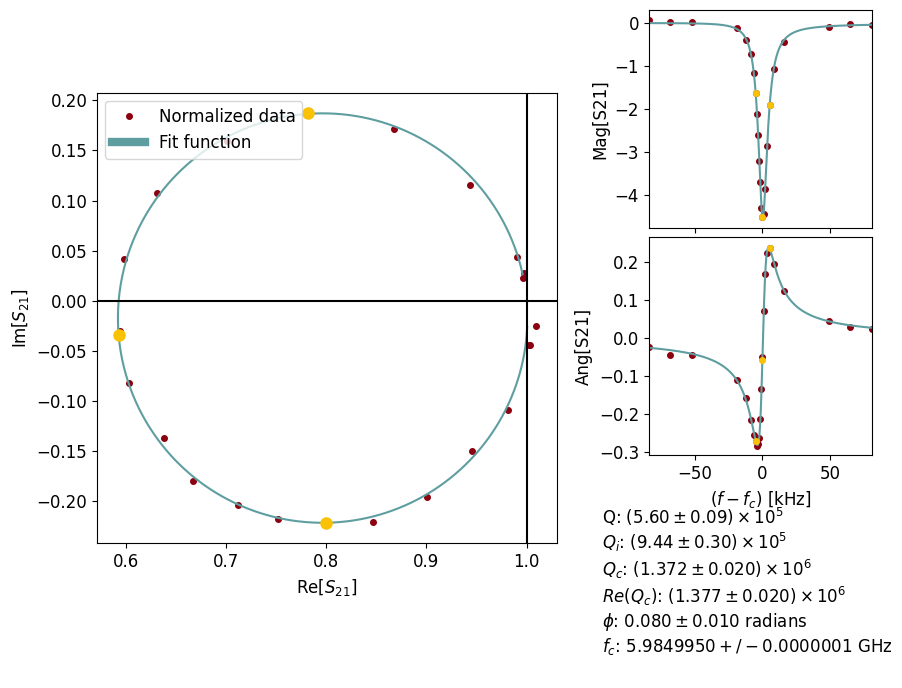

Fit parameters: [  508979.0279 12116045.3772       84.1437        0.3001]
Tau proportionality: 59.26469805776757
Pin -120.0, N photons: 3.05e+03, navg: 21
Next time: 0.08 min, q_adj: 0.930
Expected time: 0.08 min
Time elapsed: 0.26 min, expected time: 0.08 min
Qi err: 0.012490943596563138


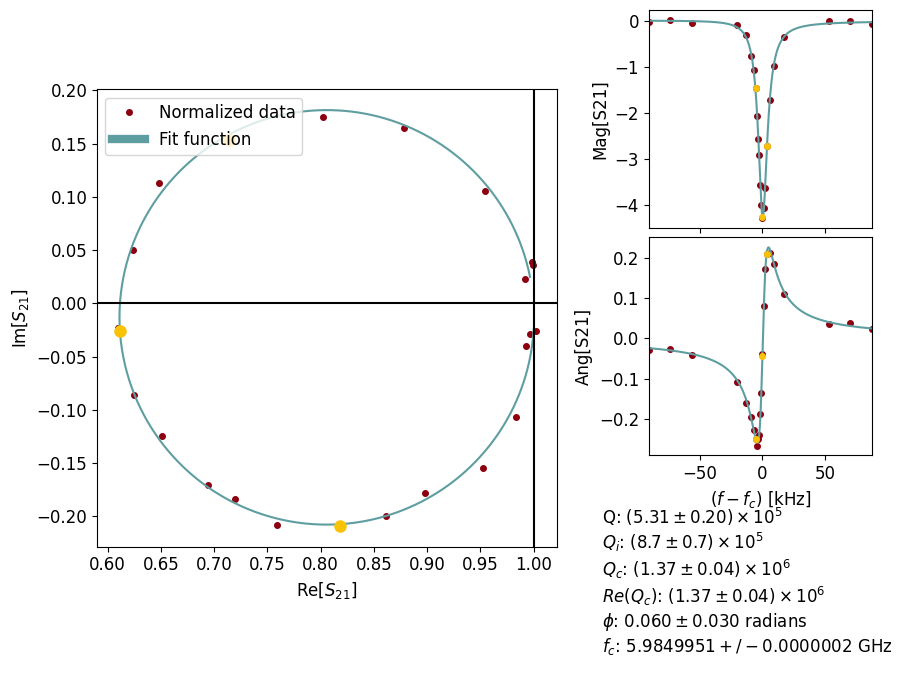

Fit parameters: [  555734.446  11904680.0352      171.9777        0.3037]
Tau proportionality: 207.41787268591688
Pin -125.0, N photons: 871, navg: 69
Next time: 0.26 min, q_adj: 0.951
Expected time: 0.26 min
Time elapsed: 0.44 min, expected time: 0.26 min
Qi err: 0.013534130987227293


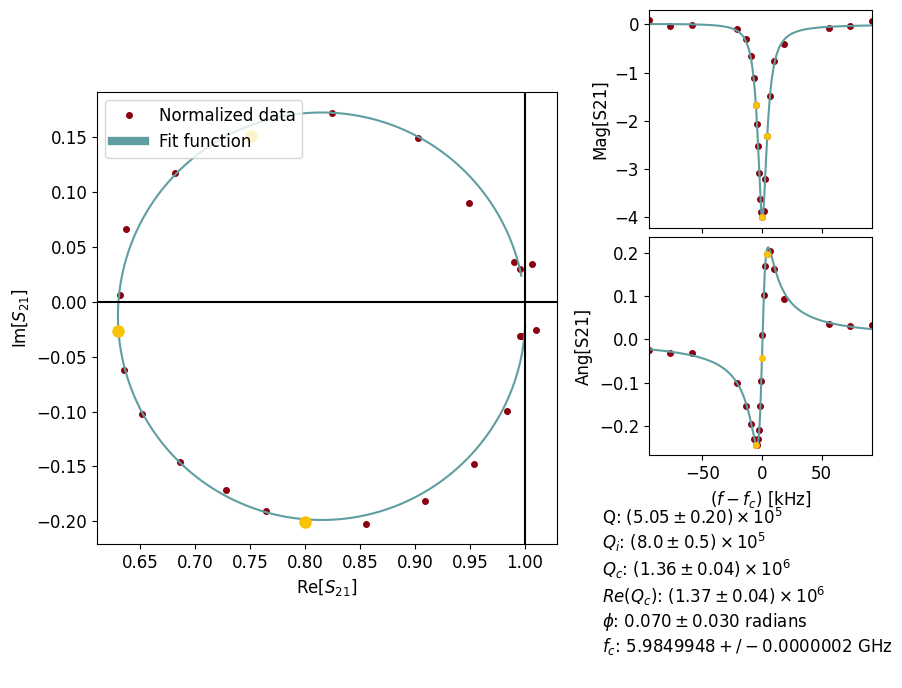

Fit parameters: [  602025.3569 11651567.6196      336.774         0.3081]
Tau proportionality: 708.6848103468768
Pin -130.0, N photons: 255, navg: 230
Next time: 0.88 min, q_adj: 0.962
Expected time: 0.88 min
Time elapsed: 1.06 min, expected time: 0.88 min
Qi err: 0.013737130292811012


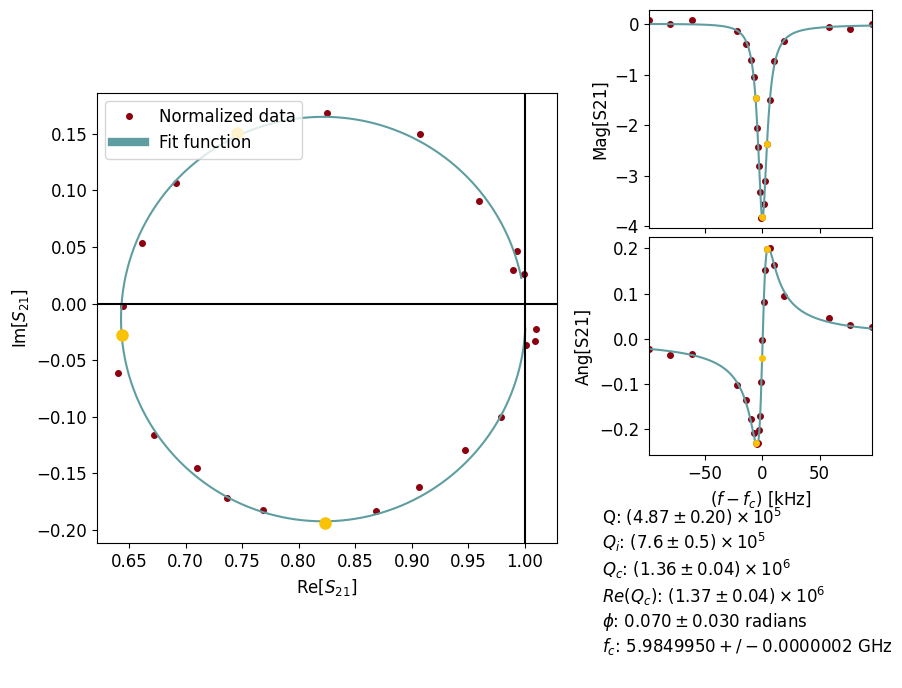

Fit parameters: [  623328.9719 11515331.5564      455.0722        0.3106]
Tau proportionality: 2445.8484073647464
Pin -135.0, N photons: 73.8, navg: 801
Next time: 3.07 min, q_adj: 0.957
Expected time: 3.07 min
Time elapsed: 3.27 min, expected time: 3.07 min
Qi err: 0.010198684740250154


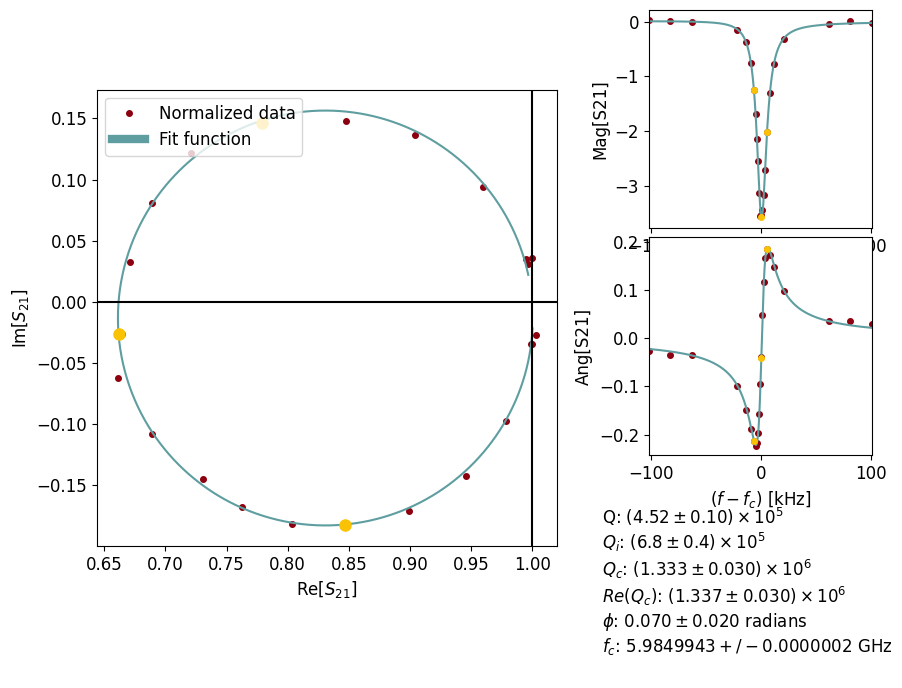

Fit parameters: [  622397.3279 11522181.3816      449.0584        0.3105]
Tau proportionality: 8610.444887082414
Pin -140.0, N photons: 21, navg: 2876
Next time: 11.02 min, q_adj: 0.948
Expected time: 11.02 min
Time elapsed: 11.29 min, expected time: 11.02 min
Qi err: 0.012961459149628913


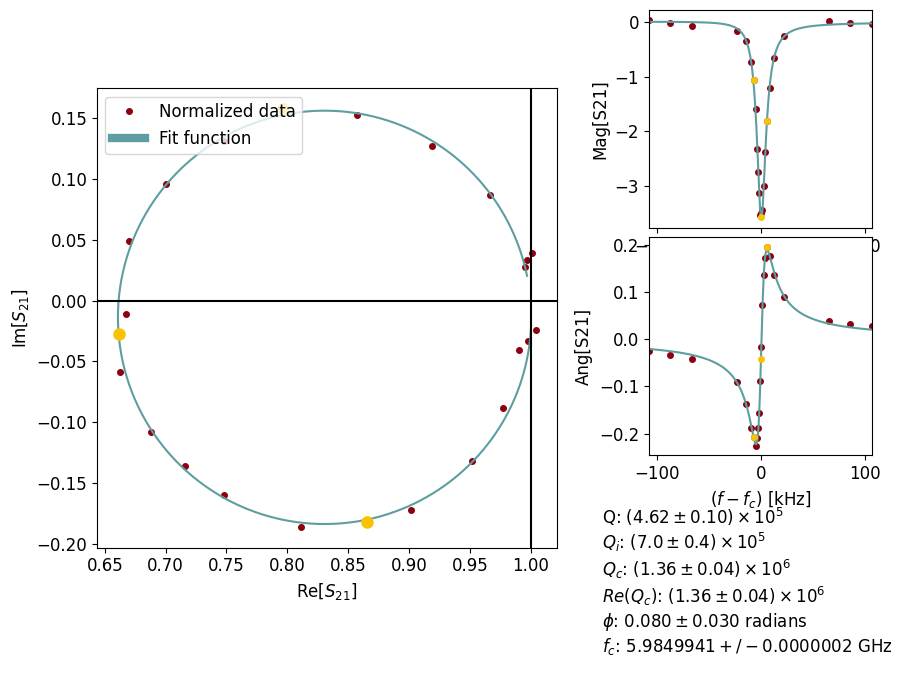

Fit parameters: [  636351.1528 11408078.4145      549.3699        0.3125]
Tau proportionality: 27107.89901037701
Pin -145.0, N photons: 6.66, navg: 8096
Next time: 31.03 min, q_adj: 1.002
Expected time: 31.03 min
Time elapsed: 31.48 min, expected time: 31.03 min
Qi err: 0.014850497272798092


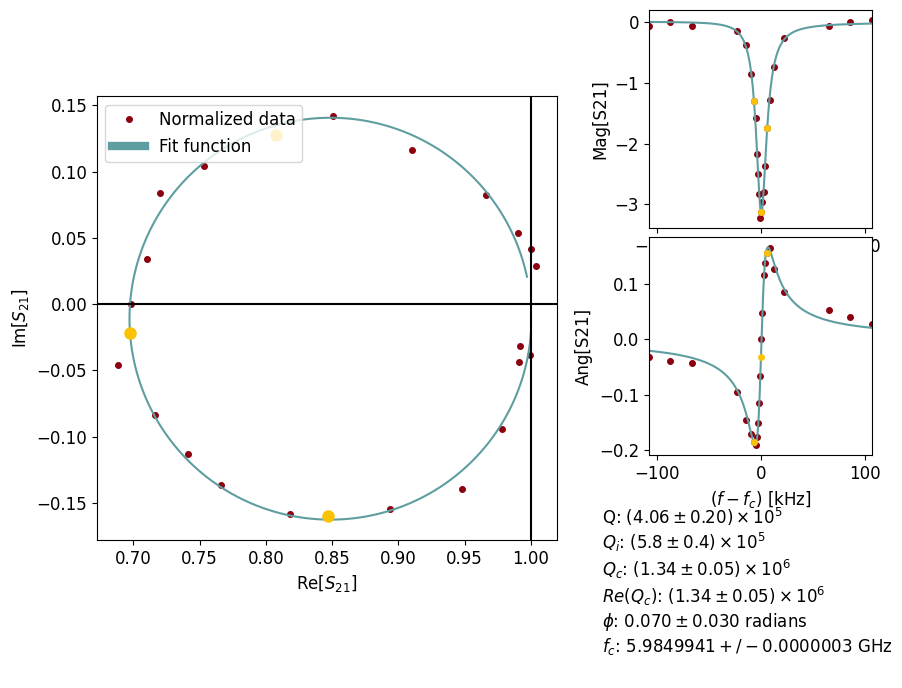

Fit parameters: [  612150.8031 11633697.7372      382.54          0.3086]
Tau proportionality: 106740.49162047262
Pin -150.0, N photons: 1.69, navg: 39873
Next time: 152.85 min, q_adj: 0.896
Expected time: 0.09 min
Time elapsed: 0.43 min, expected time: 0.09 min


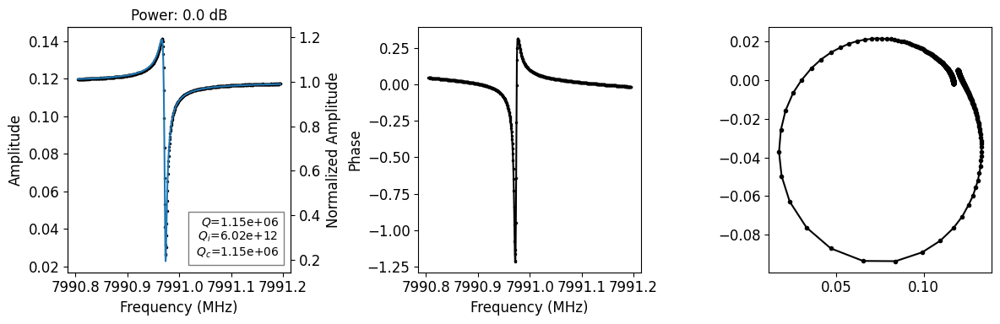

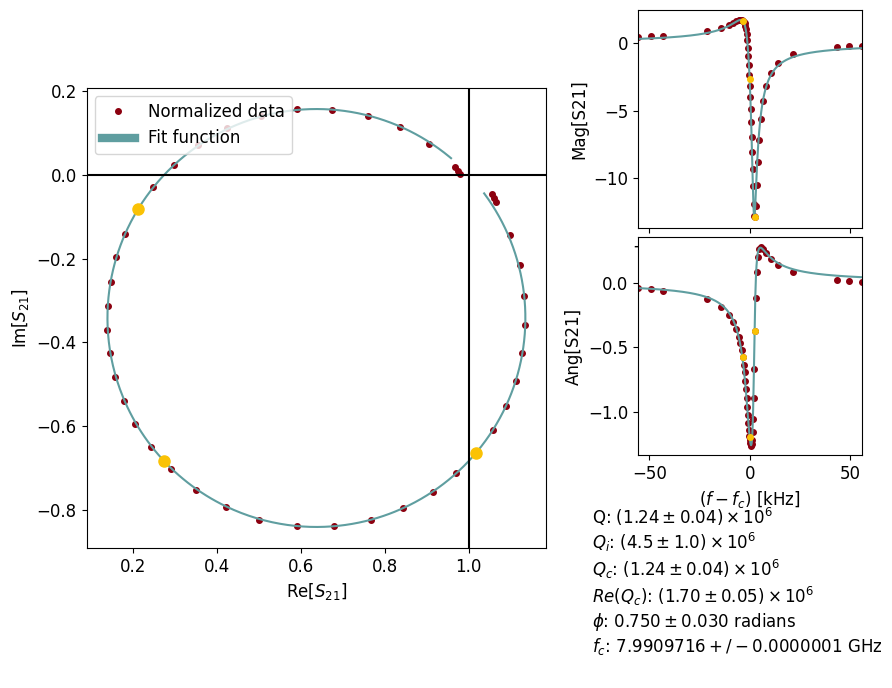

Tau proportionality: 6.257323909471917e-06
Pin -50.0, N photons: 1.38e+10, navg: 0
Next time: 0.00 min, q_adj: 0.900
Expected time: 0.09 min
Time elapsed: 0.43 min, expected time: 0.09 min


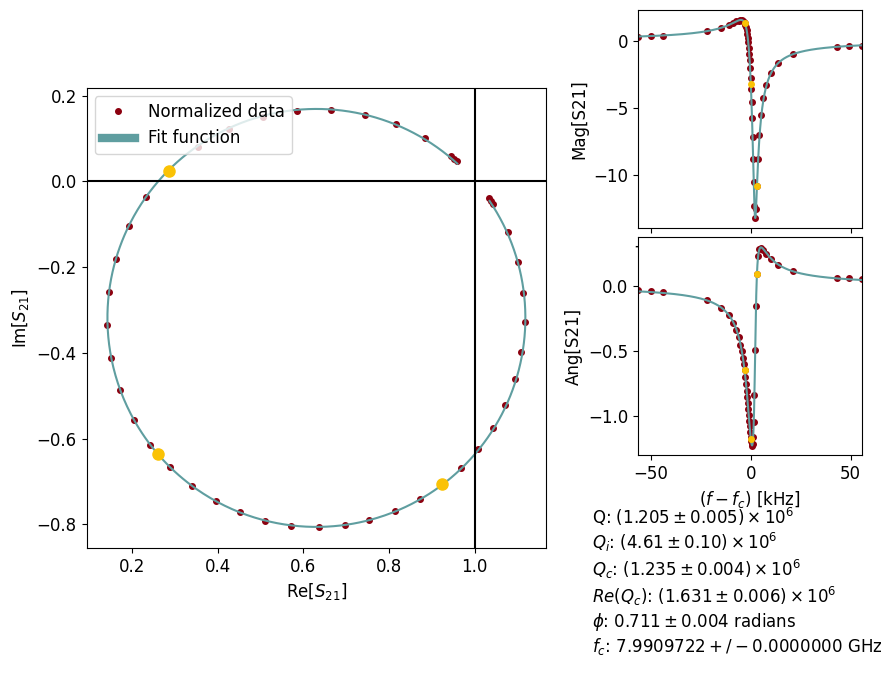

Tau proportionality: 2.09890408832089e-05
Pin -55.0, N photons: 4.5e+09, navg: 0
Next time: 0.00 min, q_adj: 1.062
Expected time: 0.09 min
Time elapsed: 0.43 min, expected time: 0.09 min


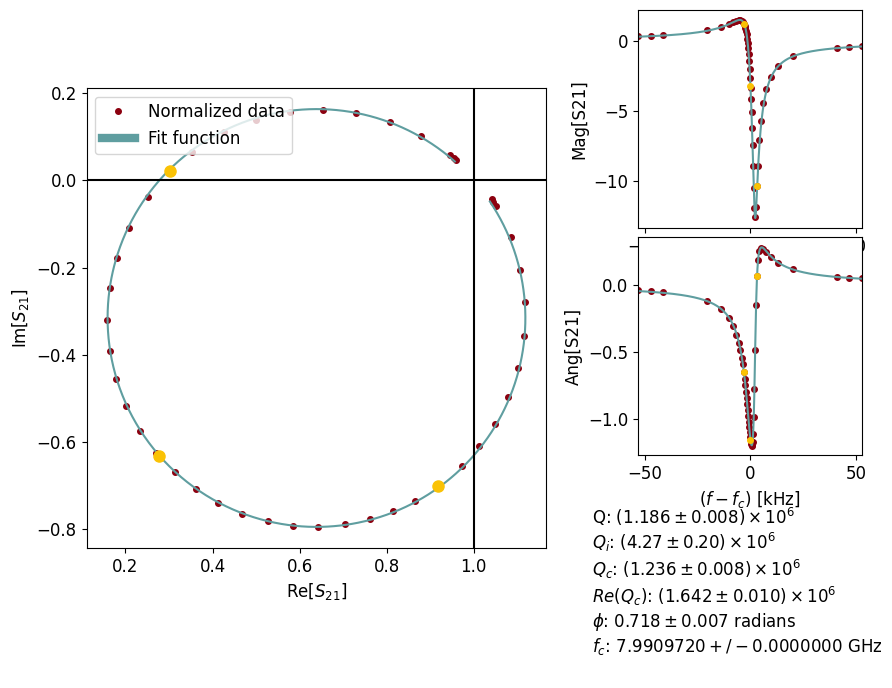

Tau proportionality: 6.984427923798529e-05
Pin -60.0, N photons: 1.36e+09, navg: 0
Next time: 0.00 min, q_adj: 0.984
Expected time: 0.09 min
Time elapsed: 0.43 min, expected time: 0.09 min


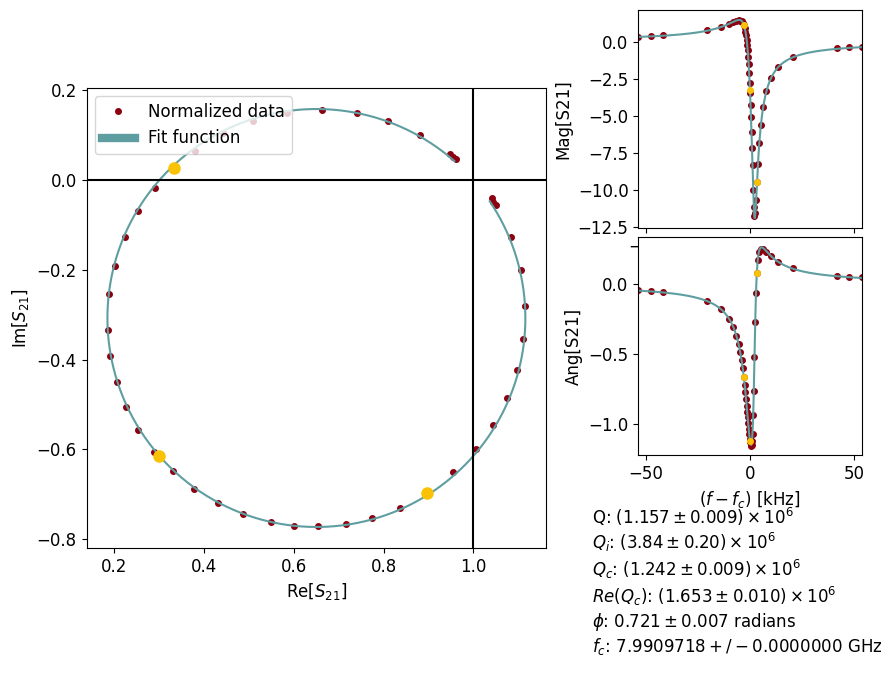

Tau proportionality: 0.0002309555651978112
Pin -65.0, N photons: 4.04e+08, navg: 0
Next time: 0.00 min, q_adj: 0.958
Expected time: 0.09 min
Time elapsed: 0.43 min, expected time: 0.09 min


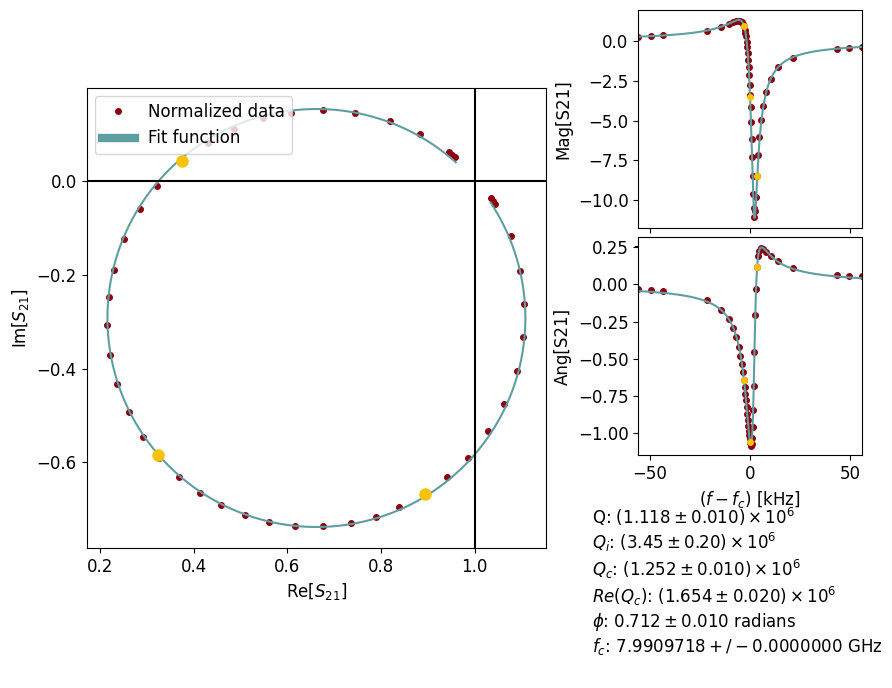

Tau proportionality: 0.0008086777413938421
Pin -70.0, N photons: 1.2e+08, navg: 0
Next time: 0.00 min, q_adj: 0.986
Expected time: 0.09 min
Time elapsed: 0.43 min, expected time: 0.09 min


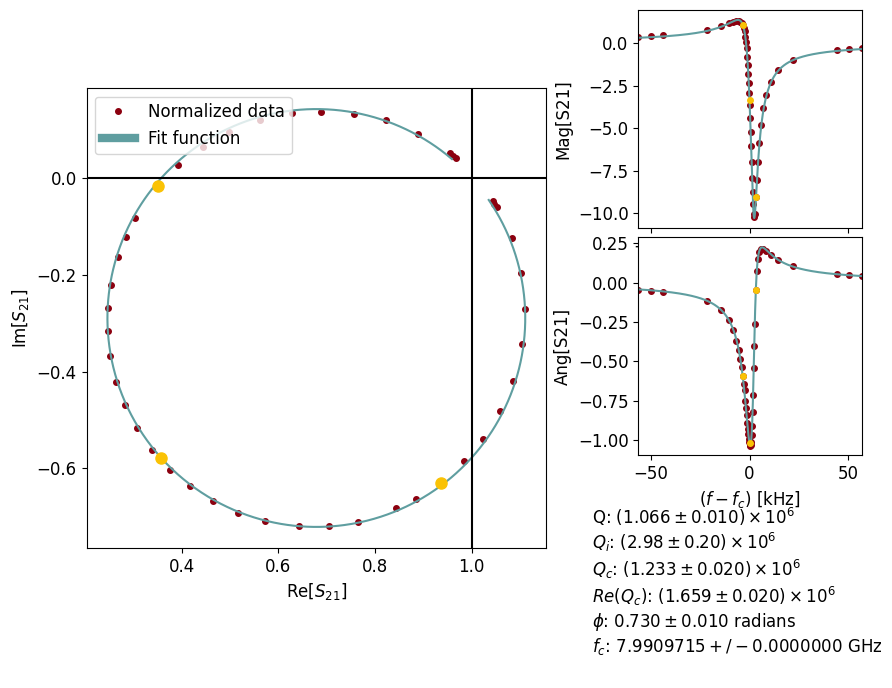

Tau proportionality: 0.0026697885837202013
Pin -75.0, N photons: 3.48e+07, navg: 0
Next time: 0.00 min, q_adj: 0.939
Expected time: 0.05 min
Time elapsed: 0.22 min, expected time: 0.05 min


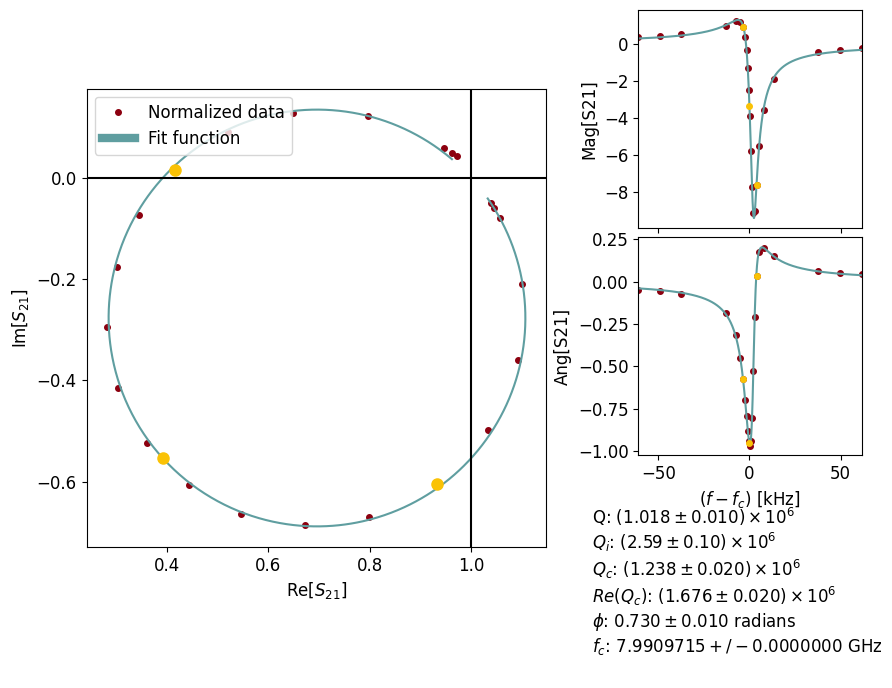

Fit failed: Optimal parameters not found: Number of calls to function has reached maxfev = 1000.
Tau proportionality: 0.009360018887726959
Pin -80.0, N photons: 9.83e+06, navg: 0
Next time: 0.00 min, q_adj: 0.939
Expected time: 0.05 min
Time elapsed: 0.22 min, expected time: 0.05 min


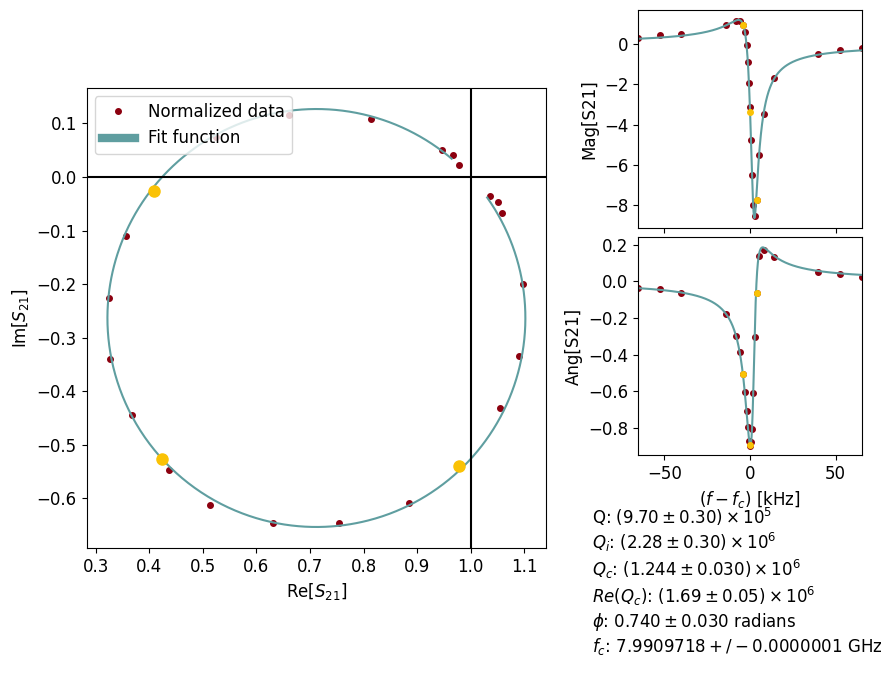

Fit failed: Optimal parameters not found: Number of calls to function has reached maxfev = 1000.
Tau proportionality: 0.03221766259824575
Pin -85.0, N photons: 2.82e+06, navg: 0
Next time: 0.00 min, q_adj: 0.948
Expected time: 0.05 min
Time elapsed: 0.22 min, expected time: 0.05 min
Qi err: 0.02962814247984226


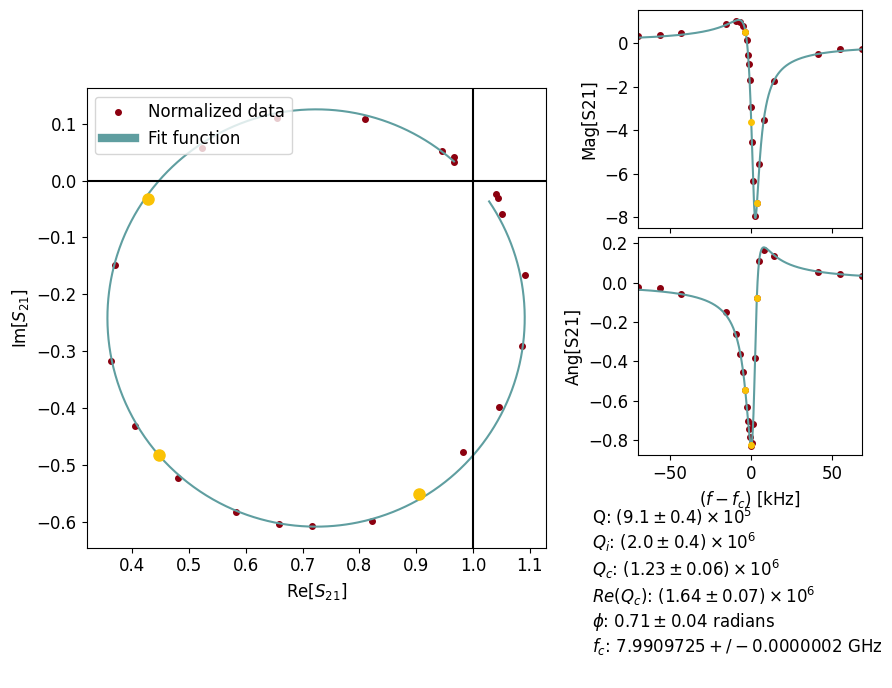

Fit failed: Optimal parameters not found: Number of calls to function has reached maxfev = 1000.
Tau proportionality: 0.12151125329159464
Pin -90.0, N photons: 7.72e+05, navg: 0
Next time: 0.00 min, q_adj: 0.945
Expected time: 0.05 min
Time elapsed: 0.22 min, expected time: 0.05 min
Qi err: 0.022042795272059712


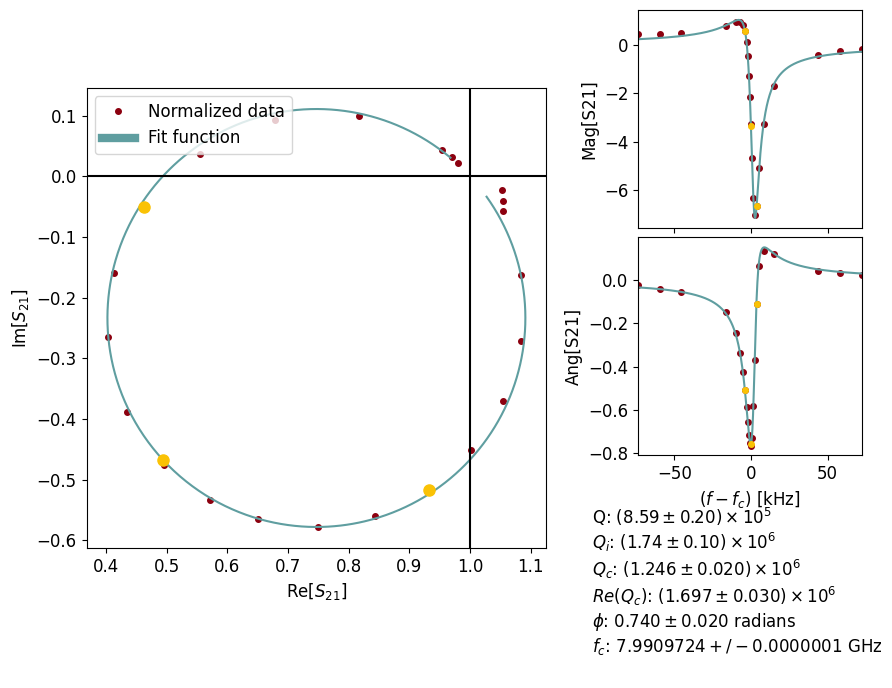

Fit failed: Optimal parameters not found: Number of calls to function has reached maxfev = 1000.
Tau proportionality: 0.42468649519909796
Pin -95.0, N photons: 2.21e+05, navg: 0
Next time: 0.00 min, q_adj: 0.951
Expected time: 0.05 min
Time elapsed: 0.22 min, expected time: 0.05 min
Qi err: 0.02476215357264386


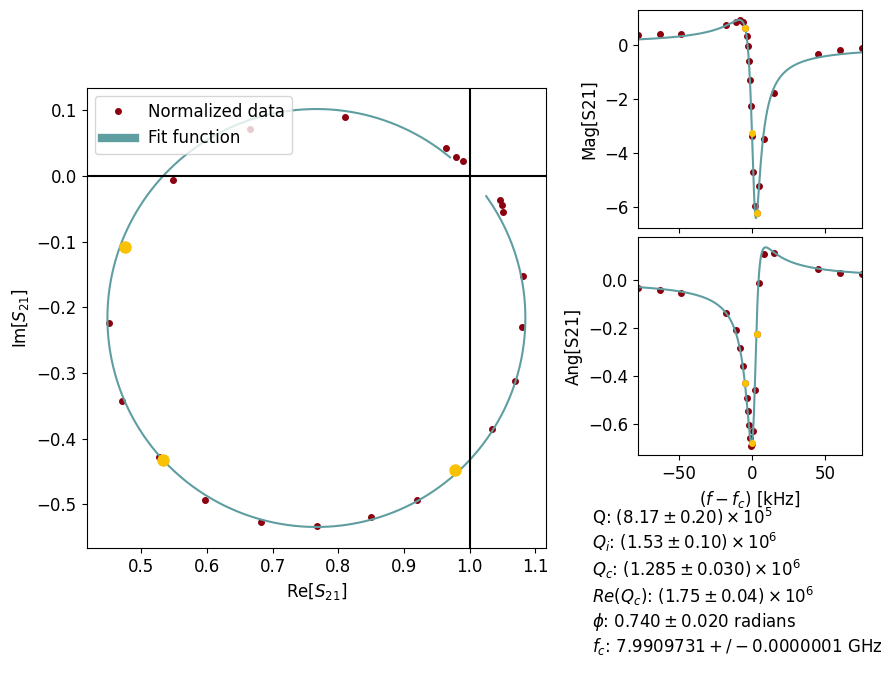

Fit failed: Optimal parameters not found: Number of calls to function has reached maxfev = 1000.
Tau proportionality: 1.5436903466785423
Pin -100.0, N photons: 6.08e+04, navg: 1
Next time: 0.00 min, q_adj: 0.933
Expected time: 0.05 min
Time elapsed: 0.22 min, expected time: 0.05 min
Qi err: 0.028545836396148057


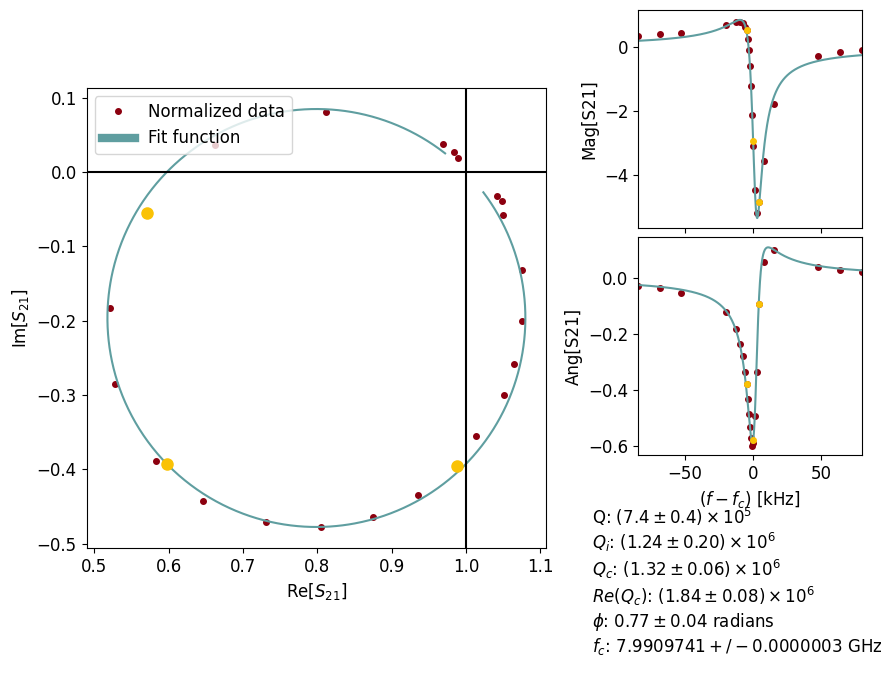

Fit failed: Optimal parameters not found: Number of calls to function has reached maxfev = 1000.
Tau proportionality: 6.136349288854076
Pin -105.0, N photons: 1.53e+04, navg: 2
Next time: 0.01 min, q_adj: 0.892
Expected time: 0.05 min
Time elapsed: 0.22 min, expected time: 0.05 min
Qi err: 0.020754643202471456


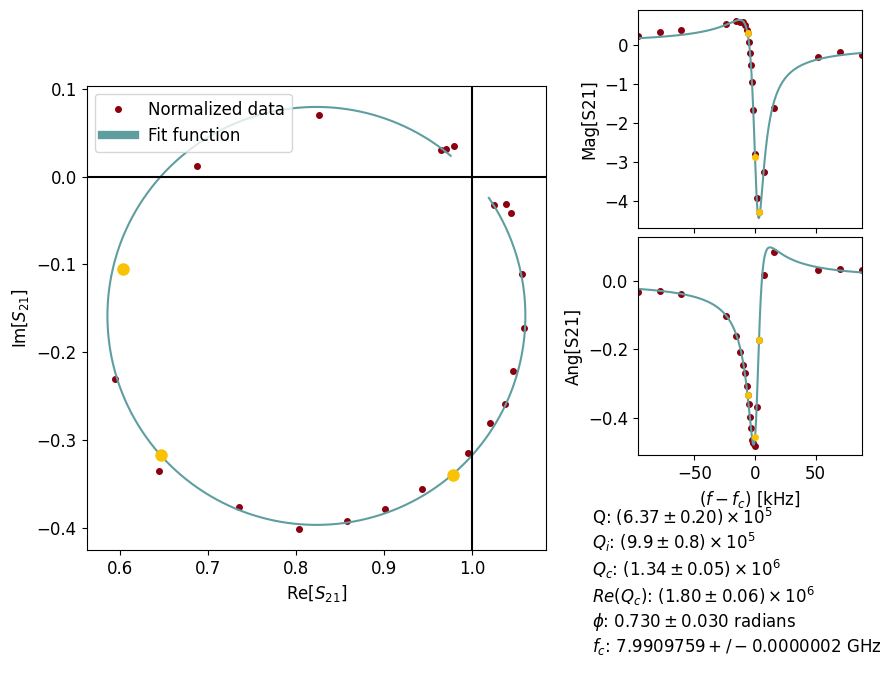

Fit failed: Optimal parameters not found: Number of calls to function has reached maxfev = 1000.
Tau proportionality: 27.13100741125831
Pin -110.0, N photons: 3.46e+03, navg: 11
Next time: 0.04 min, q_adj: 0.846
Expected time: 0.05 min
Time elapsed: 0.22 min, expected time: 0.05 min
Qi err: 0.03194503658886246


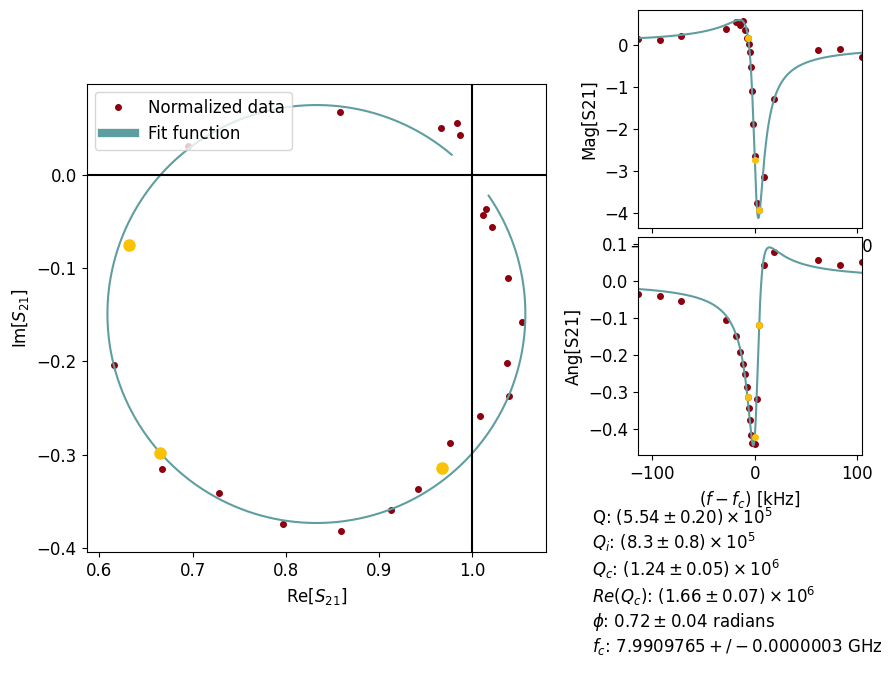

Fit failed: Optimal parameters not found: Number of calls to function has reached maxfev = 1000.
Tau proportionality: 100.65803455199007
Pin -115.0, N photons: 932, navg: 35
Next time: 0.13 min, q_adj: 0.923
Expected time: 0.13 min
Time elapsed: 0.31 min, expected time: 0.13 min
Qi err: 0.03196111313418097


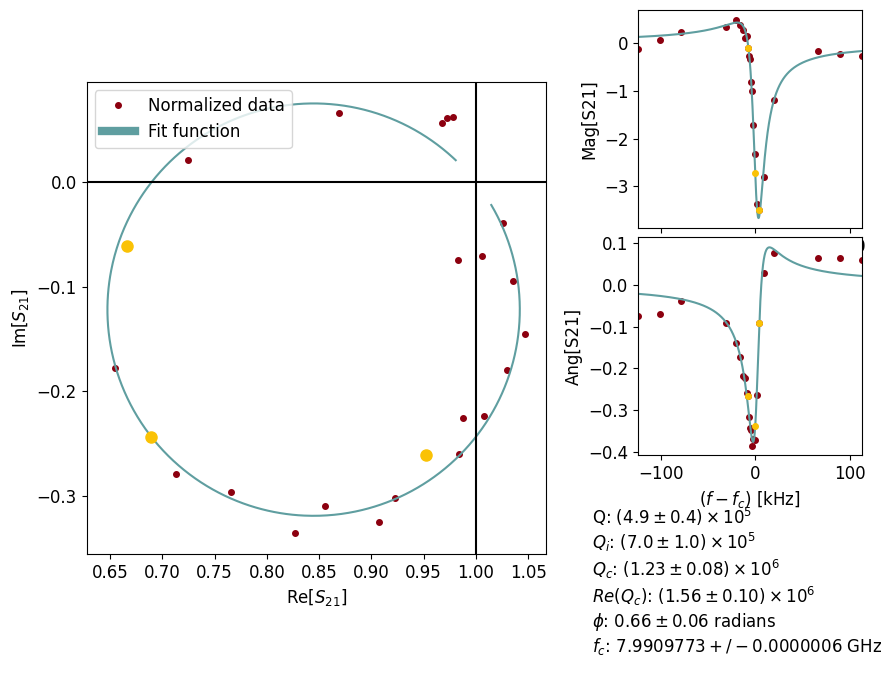

Fit failed: Optimal parameters not found: Number of calls to function has reached maxfev = 1000.
Tau proportionality: 415.1662259439721
Pin -120.0, N photons: 226, navg: 162
Next time: 0.62 min, q_adj: 0.876
Expected time: 0.62 min
Time elapsed: 0.80 min, expected time: 0.62 min
Qi err: 0.016020558389018575


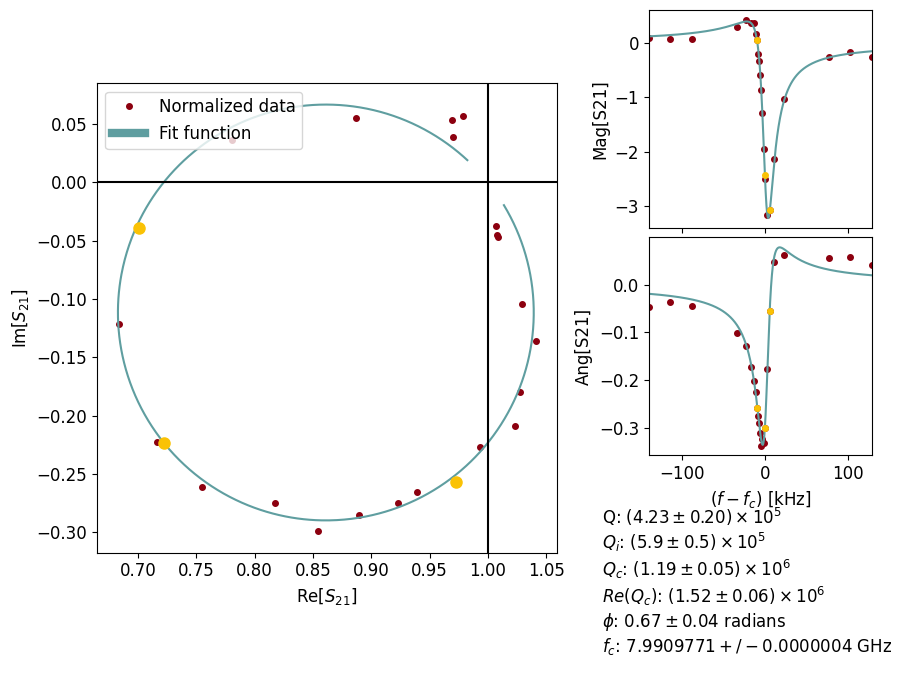

Fit failed: Optimal parameters not found: Number of calls to function has reached maxfev = 1000.
Tau proportionality: 1583.309343763481
Pin -125.0, N photons: 59.3, navg: 573
Next time: 2.20 min, q_adj: 0.911
Expected time: 2.20 min
Time elapsed: 2.40 min, expected time: 2.20 min
Qi err: 0.023606820055893166


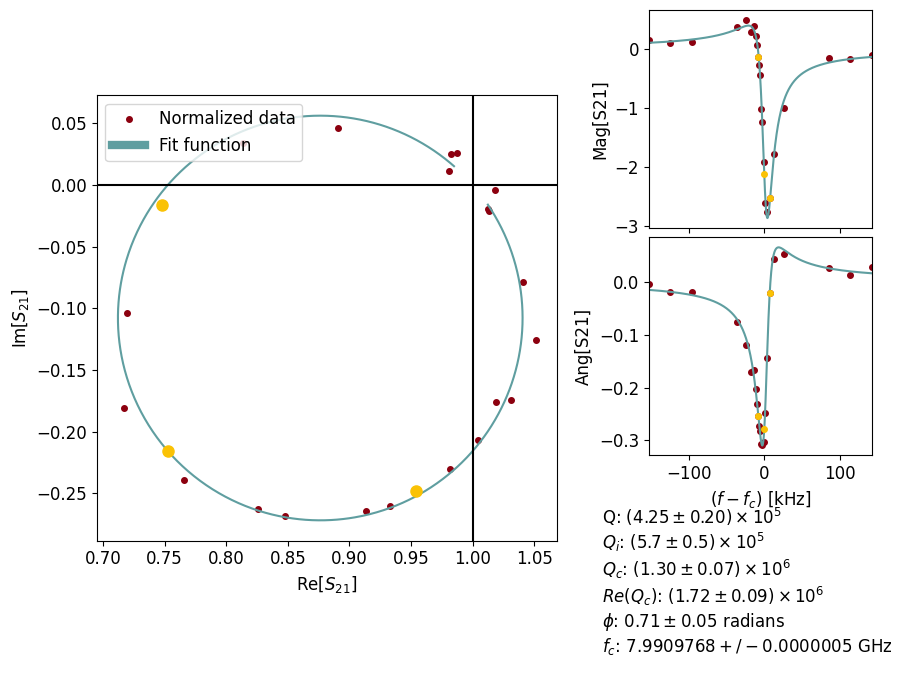

Fit failed: Optimal parameters not found: Number of calls to function has reached maxfev = 1000.
Tau proportionality: 5807.639159716922
Pin -130.0, N photons: 16.2, navg: 2021
Next time: 7.75 min, q_adj: 0.929
Expected time: 7.75 min
Time elapsed: 8.03 min, expected time: 7.75 min
Qi err: 0.033831273586806154


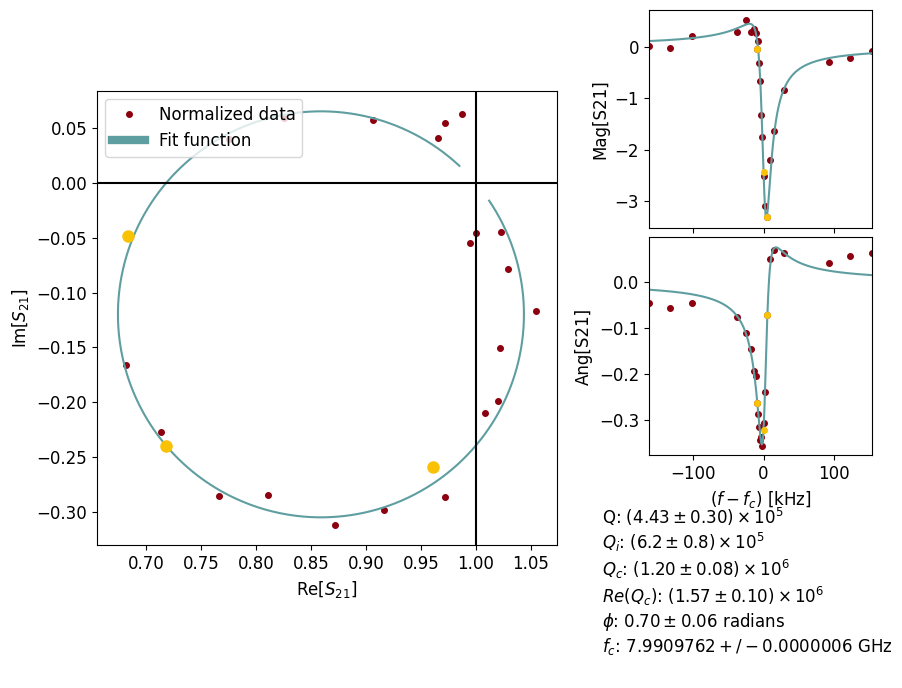

Fit failed: Optimal parameters not found: Number of calls to function has reached maxfev = 1000.
Tau proportionality: 15334.336094395265
Pin -135.0, N photons: 6.12, navg: 3841
Next time: 14.72 min, q_adj: 1.094
Expected time: 14.72 min
Time elapsed: 15.10 min, expected time: 14.72 min
Qi err: 0.02931819922375182


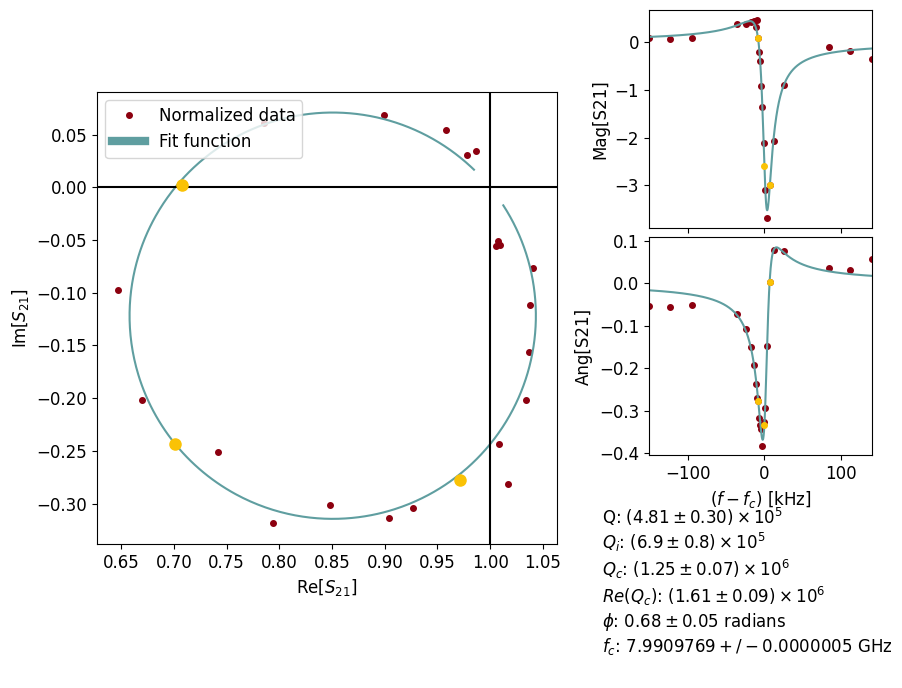

Fit failed: Optimal parameters not found: Number of calls to function has reached maxfev = 1000.
Tau proportionality: 39843.82449550442
Pin -140.0, N photons: 2.35, navg: 9822
Next time: 37.65 min, q_adj: 1.103
Stopping frequency 7.99097 GHz
Expected time: 0.09 min
Time elapsed: 0.43 min, expected time: 0.09 min


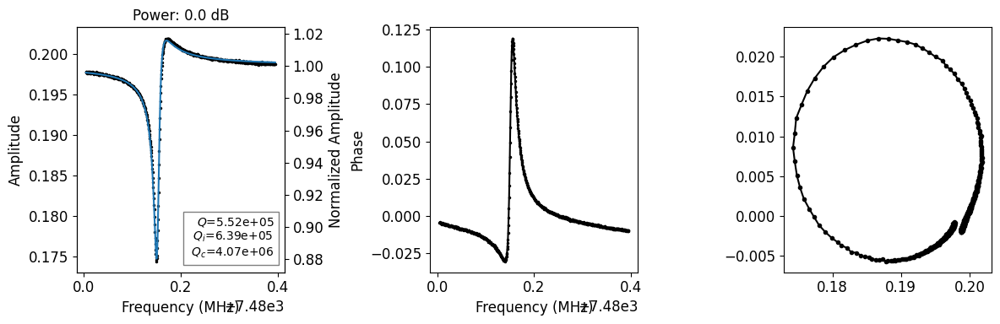

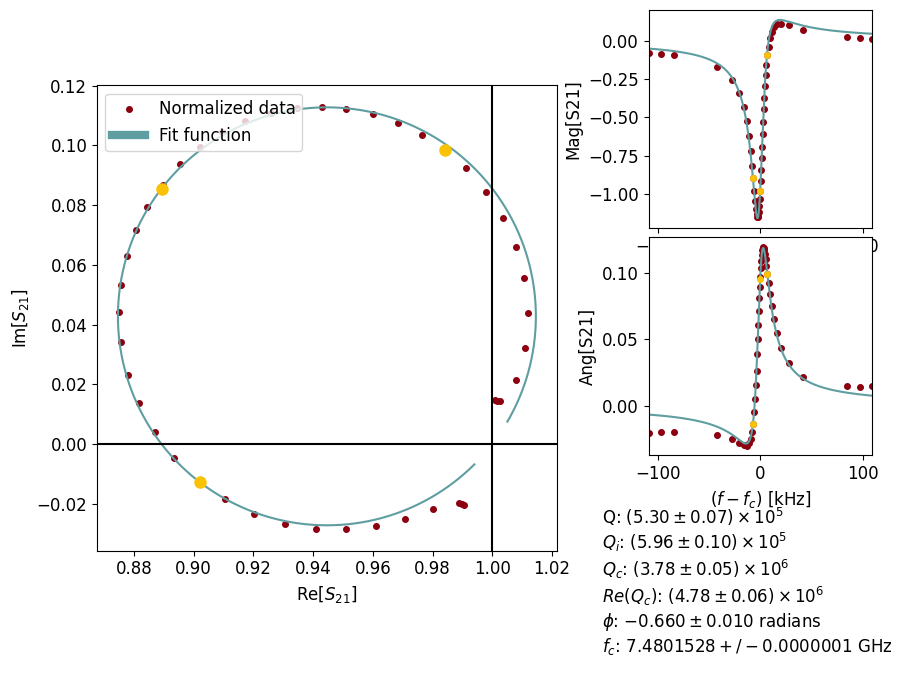

Tau proportionality: 0.00021467110989212341
Pin -50.0, N photons: 1.63e+09, navg: 0
Next time: 0.00 min, q_adj: 0.900
Expected time: 0.09 min
Time elapsed: 0.43 min, expected time: 0.09 min


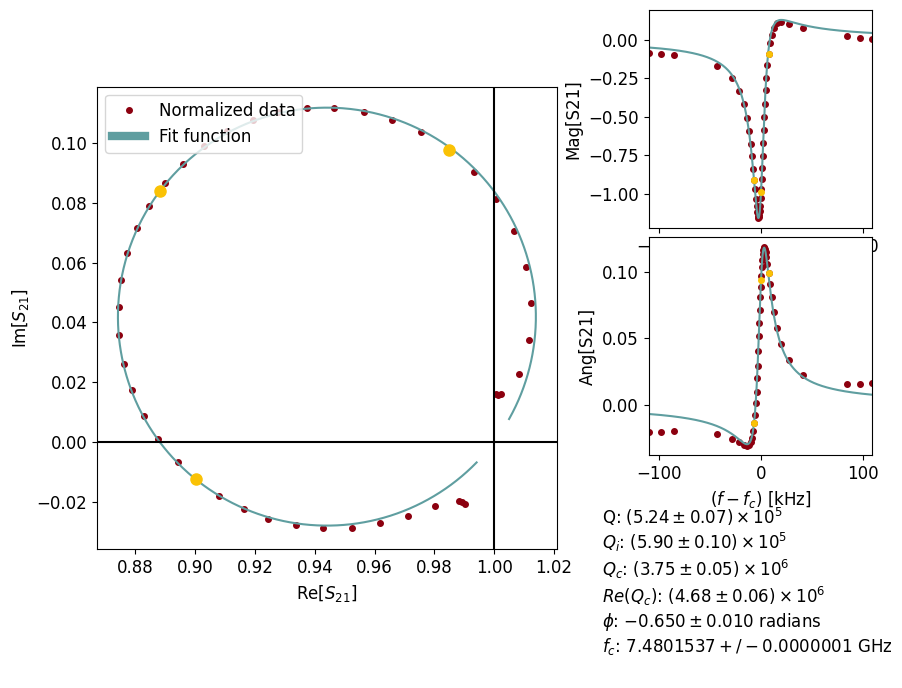

Tau proportionality: 0.0006747405648922947
Pin -55.0, N photons: 5.04e+08, navg: 0
Next time: 0.00 min, q_adj: 0.977
Expected time: 0.09 min
Time elapsed: 0.43 min, expected time: 0.09 min


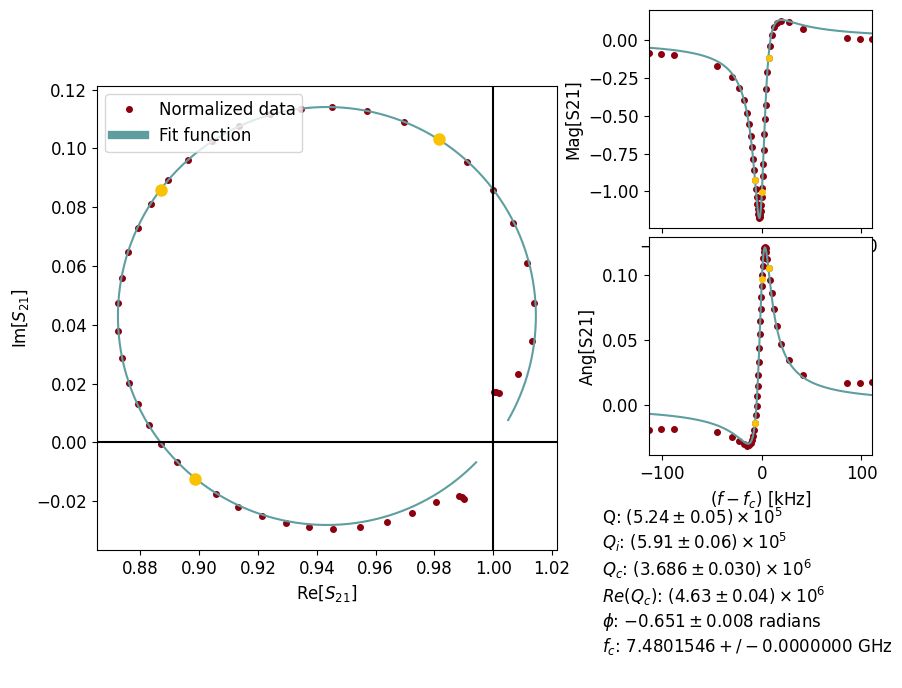

Tau proportionality: 0.0020240694441871947
Pin -60.0, N photons: 1.64e+08, navg: 0
Next time: 0.00 min, q_adj: 0.999
Expected time: 0.09 min
Time elapsed: 0.43 min, expected time: 0.09 min


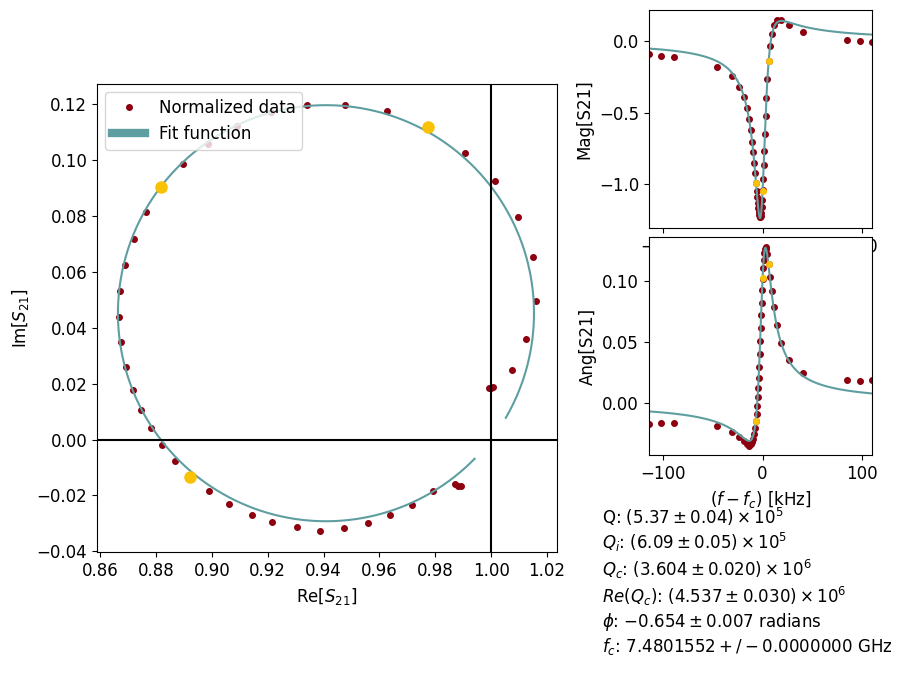

Tau proportionality: 0.0057059427294324965
Pin -65.0, N photons: 5.63e+07, navg: 0
Next time: 0.00 min, q_adj: 1.028
Expected time: 0.09 min
Time elapsed: 0.44 min, expected time: 0.09 min


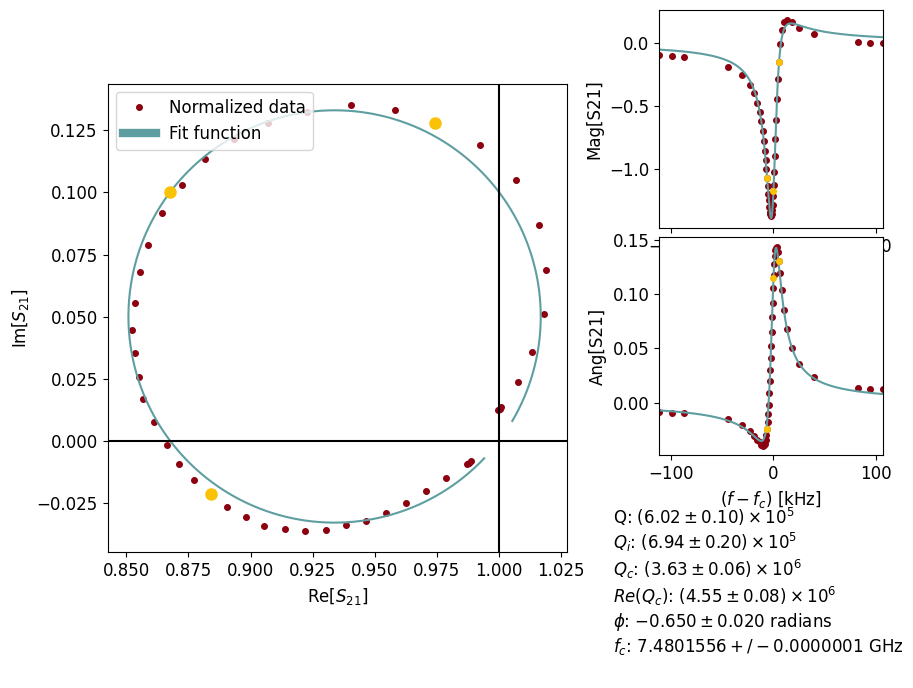

Tau proportionality: 0.014388066720936376
Pin -70.0, N photons: 2.21e+07, navg: 0
Next time: 0.00 min, q_adj: 1.109
Expected time: 0.09 min
Time elapsed: 0.44 min, expected time: 0.09 min


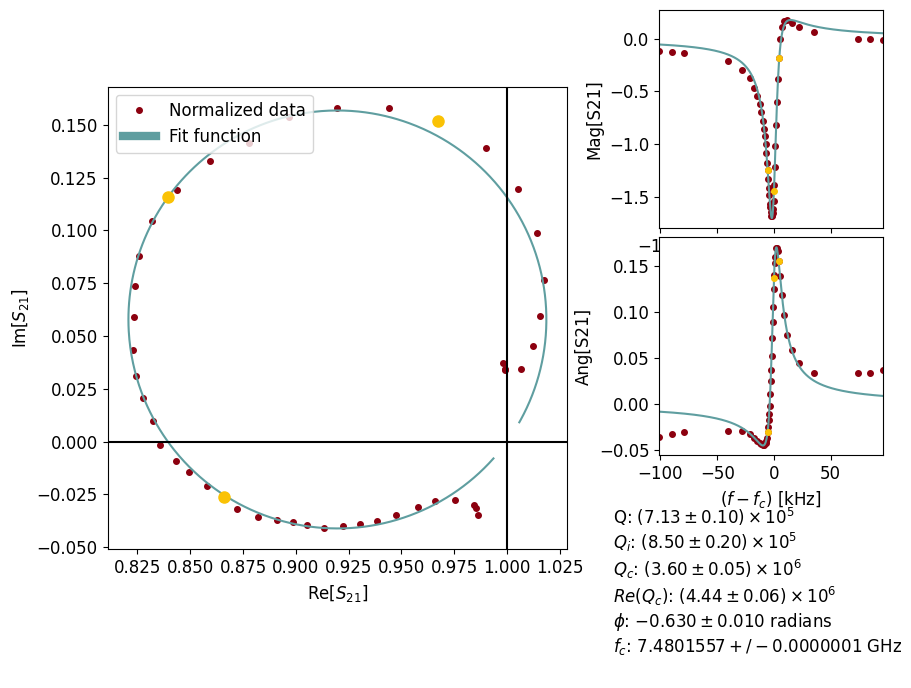

Tau proportionality: 0.03162395967257411
Pin -75.0, N photons: 1.02e+07, navg: 0
Next time: 0.00 min, q_adj: 1.211
Expected time: 0.05 min
Time elapsed: 0.22 min, expected time: 0.05 min


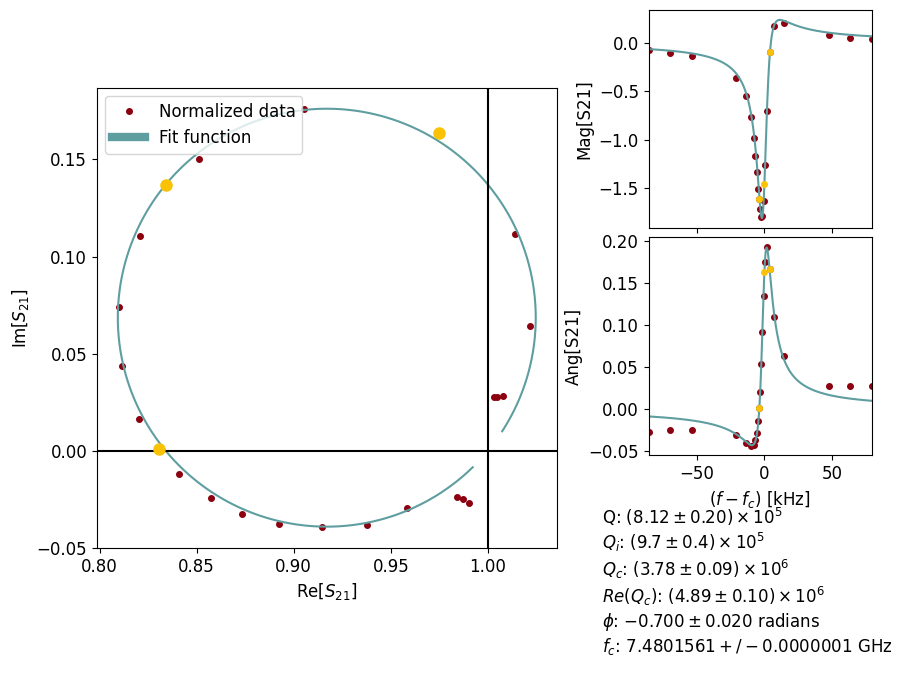

Fit parameters: [704902.4733 765166.7812      0.          0.3   ]
Tau proportionality: 0.0833944409886247
Pin -80.0, N photons: 3.79e+06, navg: 0
Next time: 0.00 min, q_adj: 1.078
Expected time: 0.05 min
Time elapsed: 0.22 min, expected time: 0.05 min


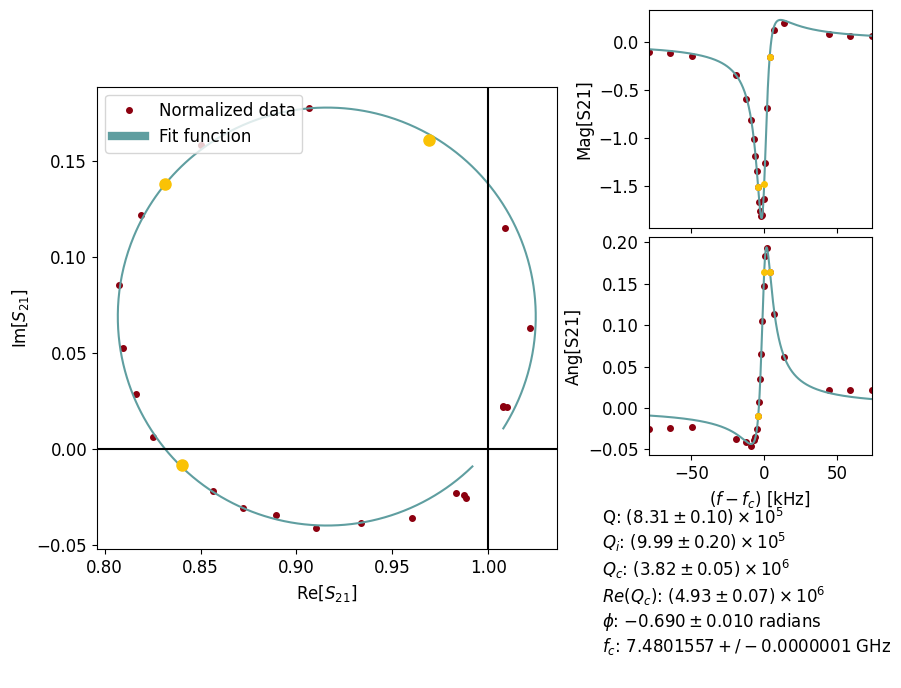

Fit parameters: [817811.9383 815476.3486      0.          0.3207]
Tau proportionality: 0.2650083492505311
Pin -85.0, N photons: 1.25e+06, navg: 0
Next time: 0.00 min, q_adj: 1.045
Expected time: 0.05 min
Time elapsed: 0.22 min, expected time: 0.05 min
Qi err: 0.011784871741970912


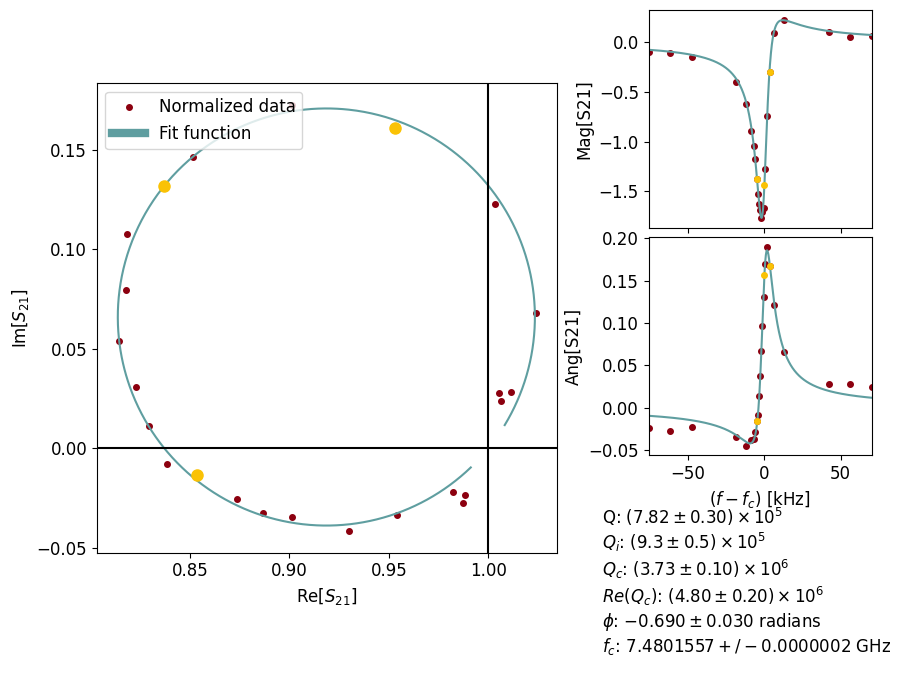

Fit parameters: [812750.0159 846419.2084      0.          0.3488]
Tau proportionality: 0.8952012137038403
Pin -90.0, N photons: 3.57e+05, navg: 0
Next time: 0.00 min, q_adj: 0.933
Expected time: 0.05 min
Time elapsed: 0.22 min, expected time: 0.05 min
Qi err: 0.02020109326890796


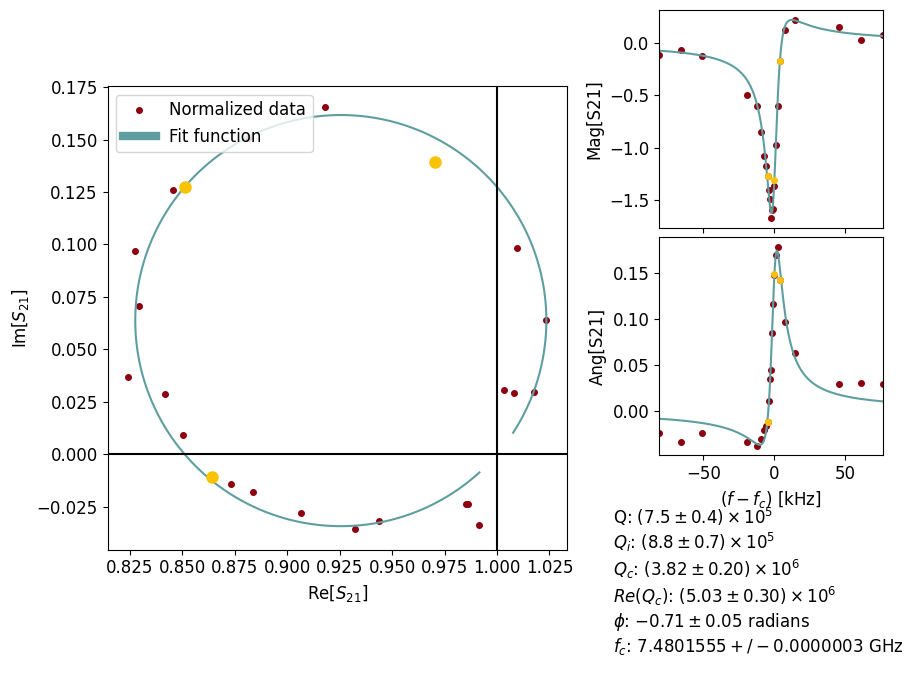

Fit parameters: [754757.4959 852623.5983      0.          0.3602]
Tau proportionality: 3.2709051359722485
Pin -95.0, N photons: 9.76e+04, navg: 1
Next time: 0.00 min, q_adj: 0.930
Expected time: 0.05 min
Time elapsed: 0.22 min, expected time: 0.05 min
Qi err: 0.01774199414950362


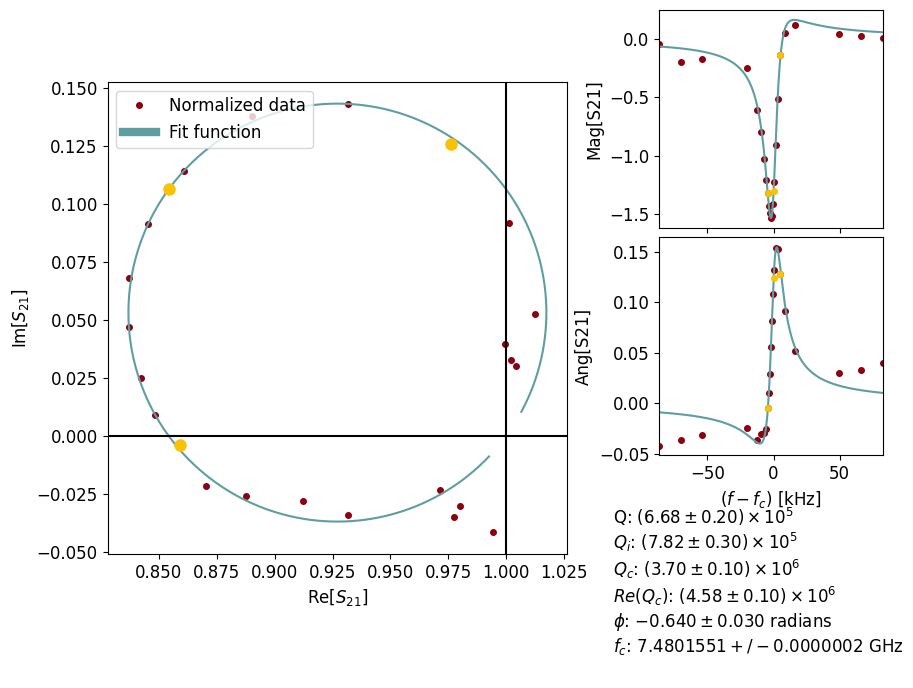

Fit parameters: [786212.3301 851317.5523      0.          0.3737]
Tau proportionality: 12.115392711107699
Pin -100.0, N photons: 2.63e+04, navg: 4
Next time: 0.02 min, q_adj: 0.924
Expected time: 0.05 min
Time elapsed: 0.22 min, expected time: 0.05 min
Qi err: 0.012288793309964269


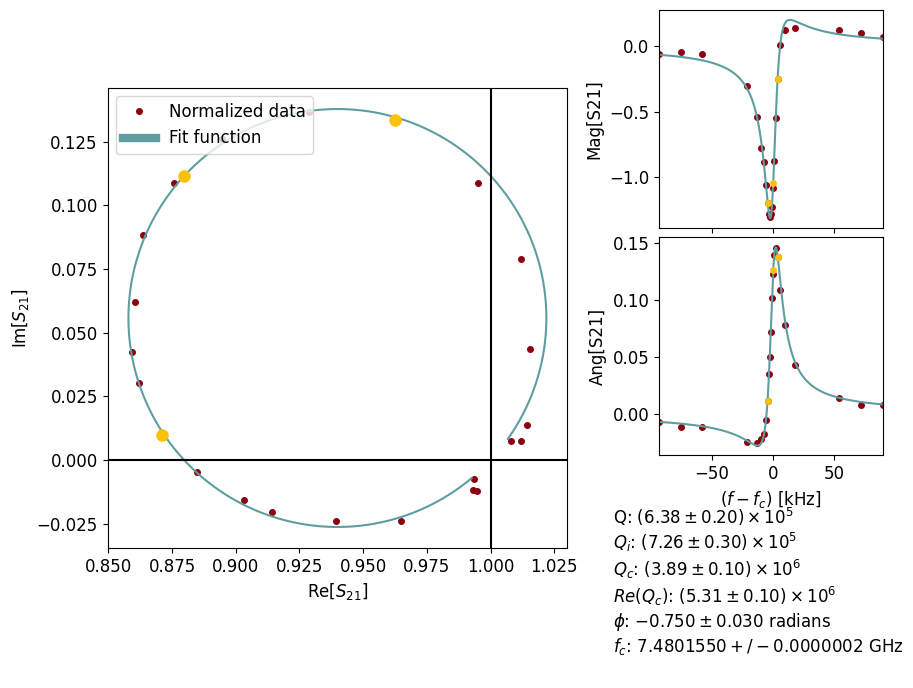

Fit parameters: [786349.6642 825123.5522      0.          0.3956]
Tau proportionality: 46.18206332258768
Pin -105.0, N photons: 6.91e+03, navg: 17
Next time: 0.07 min, q_adj: 0.911
Expected time: 0.07 min
Time elapsed: 0.24 min, expected time: 0.07 min
Qi err: 0.01584552293250952


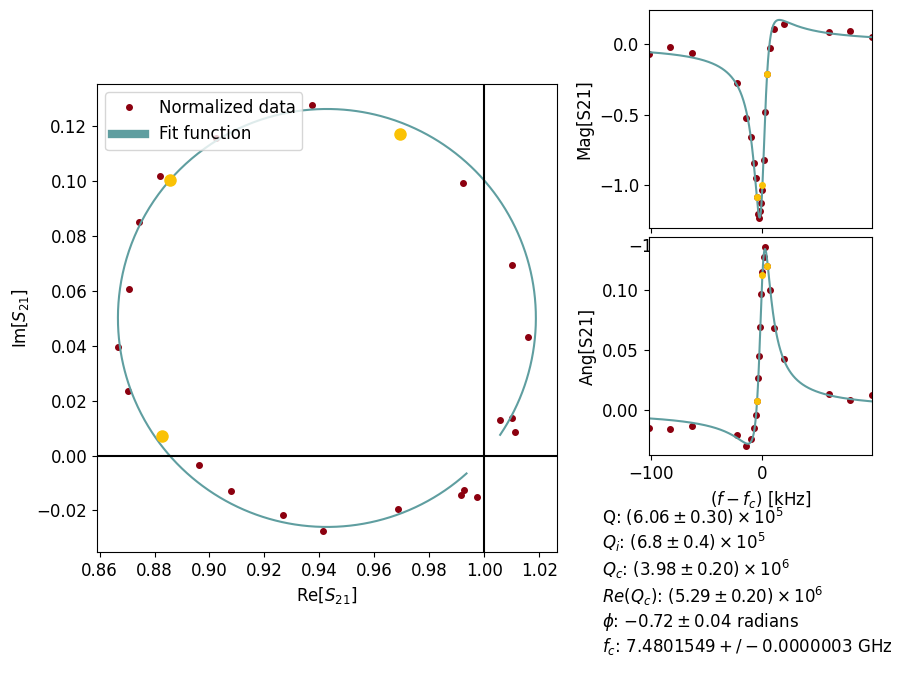

Fit parameters: [775789.2263 796484.0726      0.          0.4167]
Tau proportionality: 169.57721143772858
Pin -110.0, N photons: 1.88e+03, navg: 59
Next time: 0.23 min, q_adj: 0.928
Expected time: 0.23 min
Time elapsed: 0.40 min, expected time: 0.23 min
Qi err: 0.010684587383373105


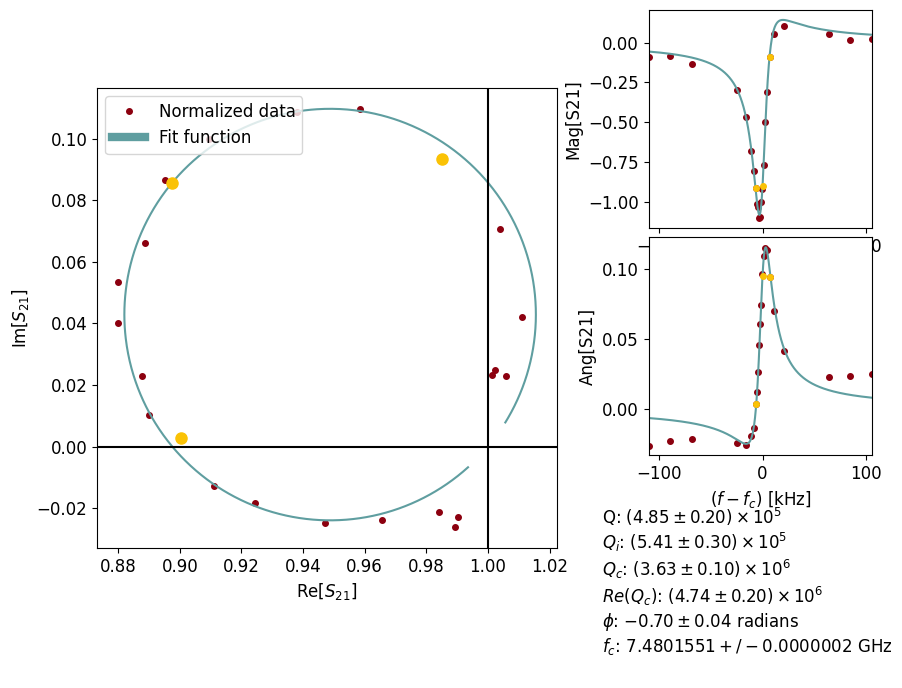

Fit parameters: [1775555.0515  812515.0277    1267.5095       2.2946]
Tau proportionality: 716.9732472868495
Pin -115.0, N photons: 445, navg: 288
Next time: 1.10 min, q_adj: 0.865
Expected time: 1.10 min
Time elapsed: 1.30 min, expected time: 1.10 min
Qi err: 0.010823885084873013


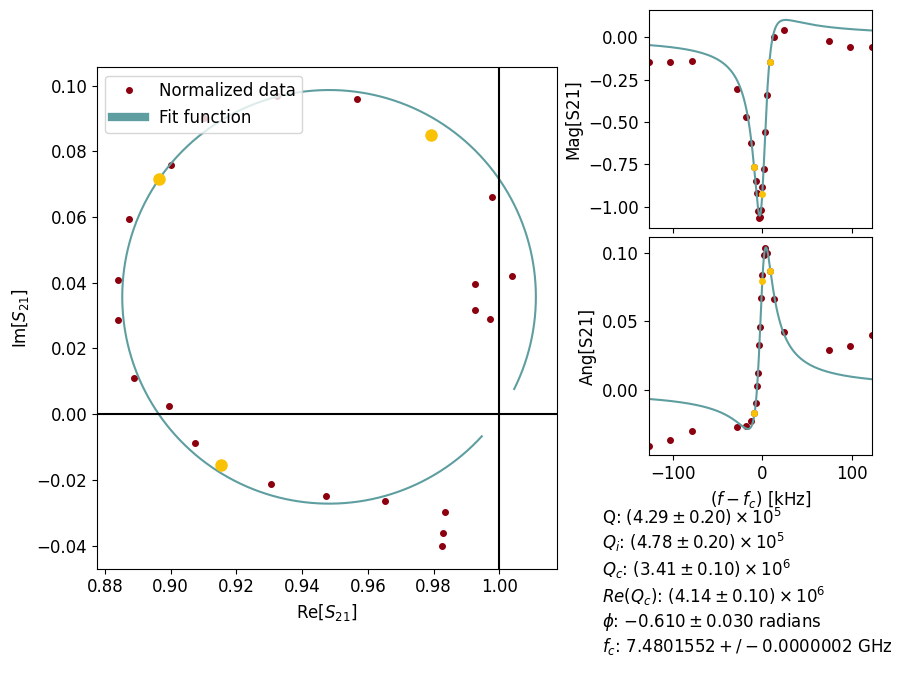

Fit parameters: [1442147.0544  812447.0036     828.0004       2.0401]
Tau proportionality: 2718.197360887354
Pin -120.0, N photons: 117, navg: 978
Next time: 3.75 min, q_adj: 0.913
Expected time: 3.75 min
Time elapsed: 3.98 min, expected time: 3.75 min
Qi err: 0.009704019167322839


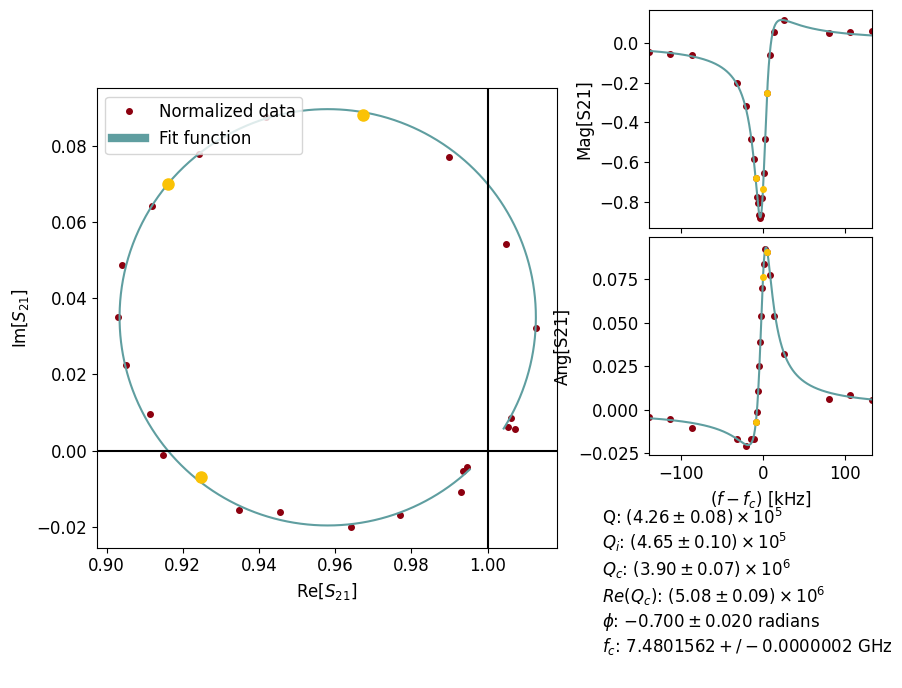

Fit parameters: [1176889.2983  812180.6742     465.4738       1.7566]
Tau proportionality: 10335.685384343244
Pin -125.0, N photons: 30.9, navg: 3728
Next time: 14.29 min, q_adj: 0.912
Expected time: 14.29 min
Time elapsed: 14.66 min, expected time: 14.29 min
Qi err: 0.011305125166249031


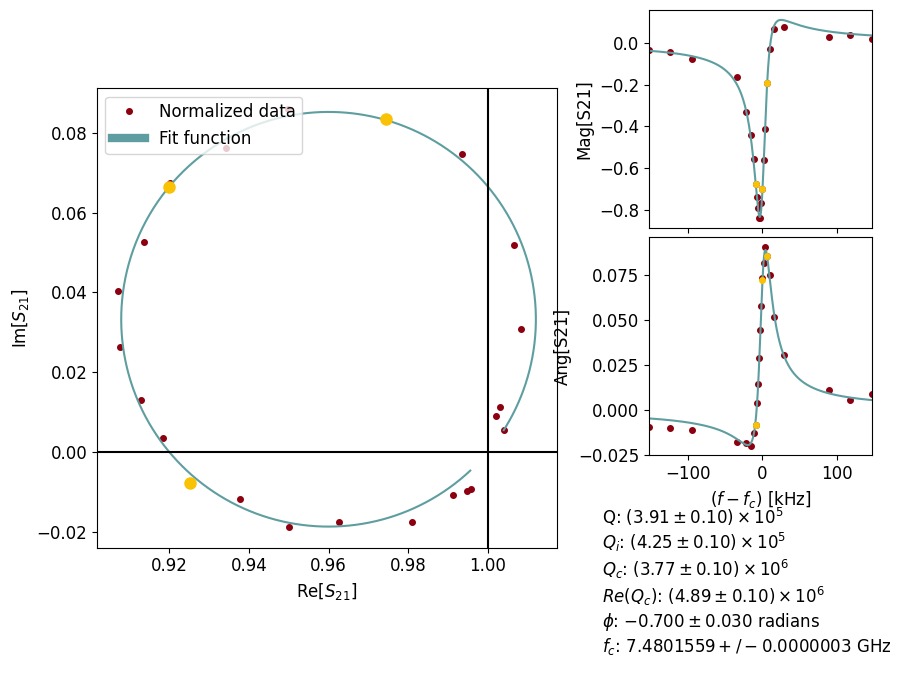

Fit parameters: [1034886.4139  812013.1272     315.1888       1.6134]
Tau proportionality: 36977.55491578219
Pin -130.0, N photons: 8.63, navg: 12550
Next time: 48.11 min, q_adj: 0.940
Expected time: 48.11 min
Time elapsed: 48.95 min, expected time: 48.11 min
Qi err: 0.010761677252008285


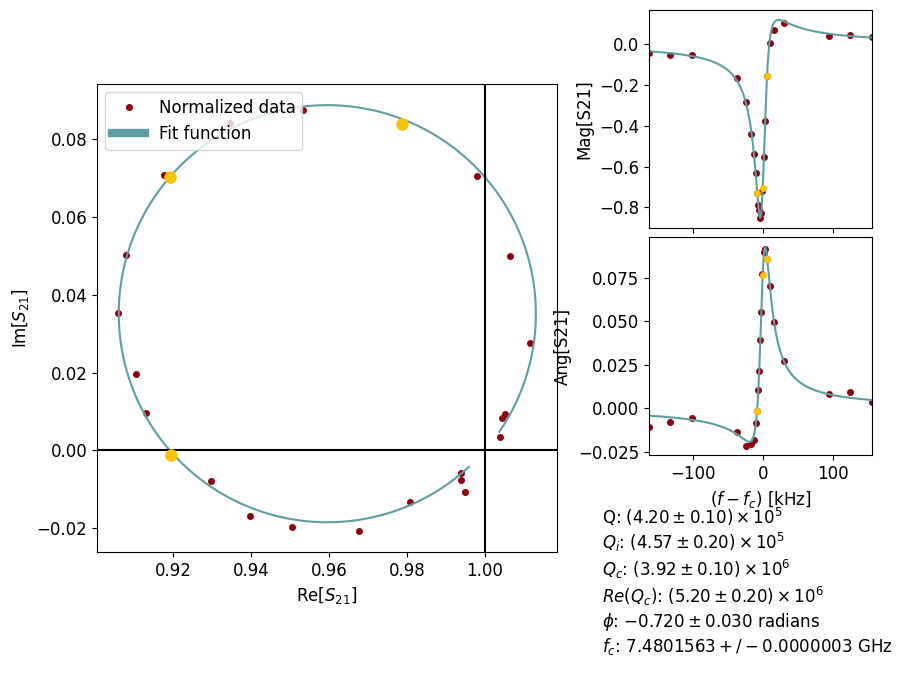

Fit parameters: [1007648.026   811991.7154     289.2482       1.5839]
Tau proportionality: 110479.03916858262
Pin -135.0, N photons: 2.89, navg: 31314
Next time: 120.04 min, q_adj: 1.029
Stopping frequency 7.48015 GHz
Expected time: 0.09 min
Time elapsed: 0.43 min, expected time: 0.09 min


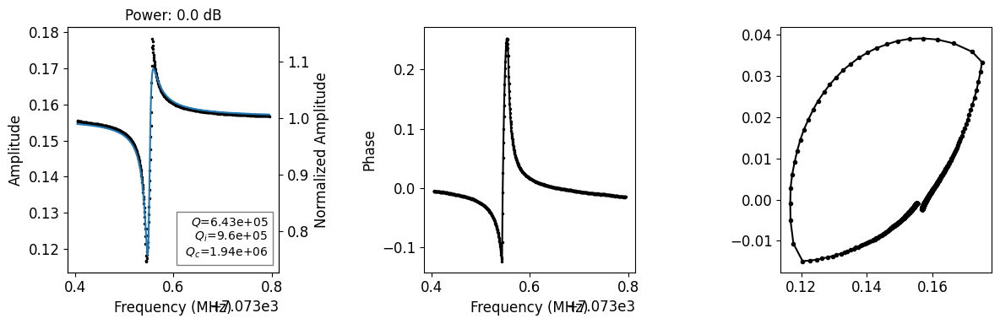

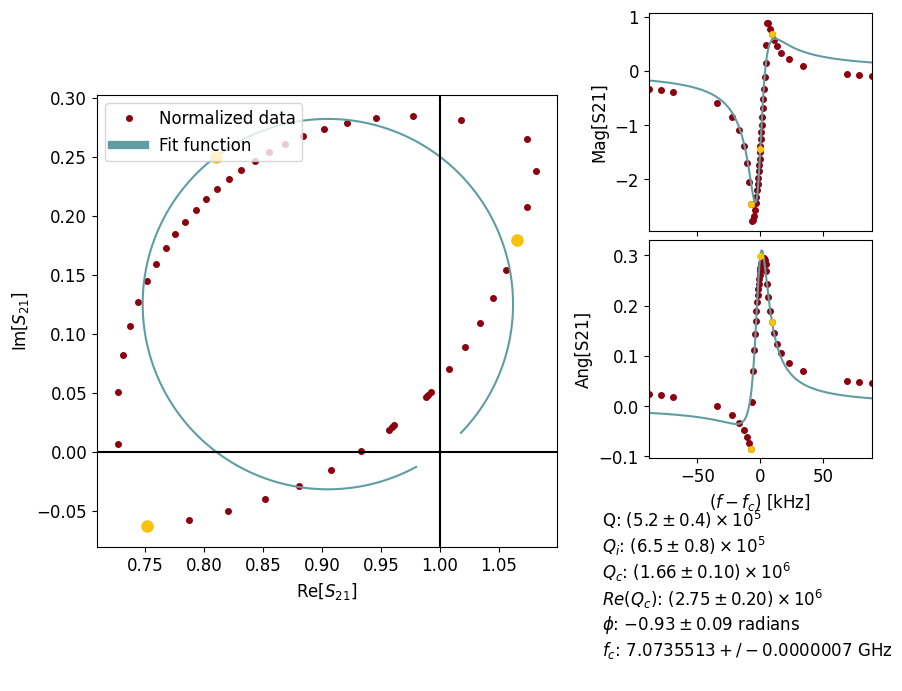

Tau proportionality: 2.3788012962951215e-05
Pin -50.0, N photons: 6.44e+09, navg: 0
Next time: 0.00 min, q_adj: 0.900
Expected time: 0.09 min
Time elapsed: 0.44 min, expected time: 0.09 min


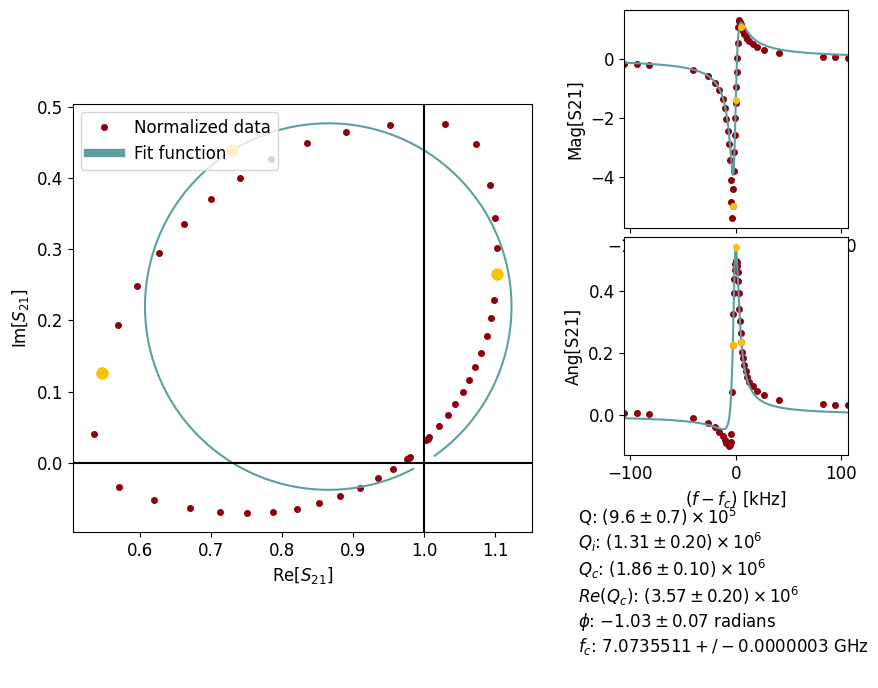

Tau proportionality: 2.6272396386777905e-05
Pin -55.0, N photons: 6.39e+09, navg: 0
Next time: 0.00 min, q_adj: 1.856
Expected time: 0.09 min
Time elapsed: 0.43 min, expected time: 0.09 min


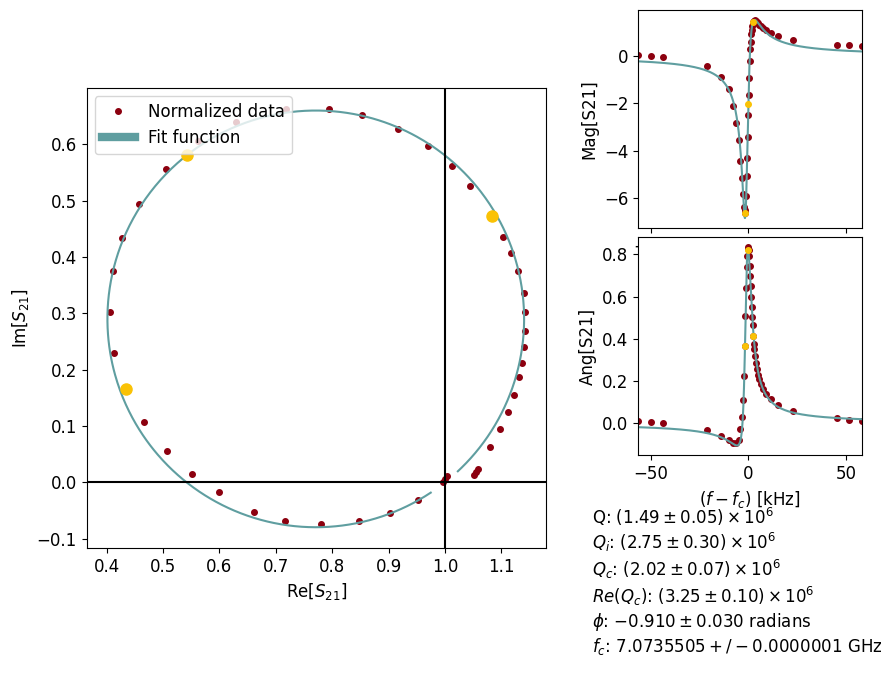

Tau proportionality: 4.926399149426109e-05
Pin -60.0, N photons: 3.63e+09, navg: 0
Next time: 0.00 min, q_adj: 1.381
Expected time: 0.09 min
Time elapsed: 0.43 min, expected time: 0.09 min


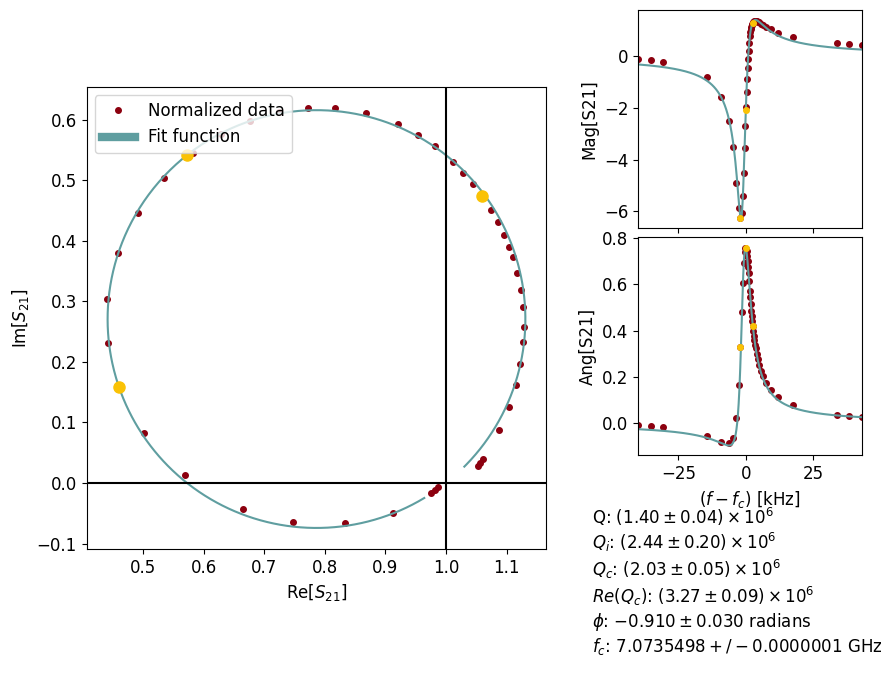

Tau proportionality: 0.00017604398231207486
Pin -65.0, N photons: 1.06e+09, navg: 0
Next time: 0.00 min, q_adj: 0.978
Expected time: 0.09 min
Time elapsed: 0.44 min, expected time: 0.09 min


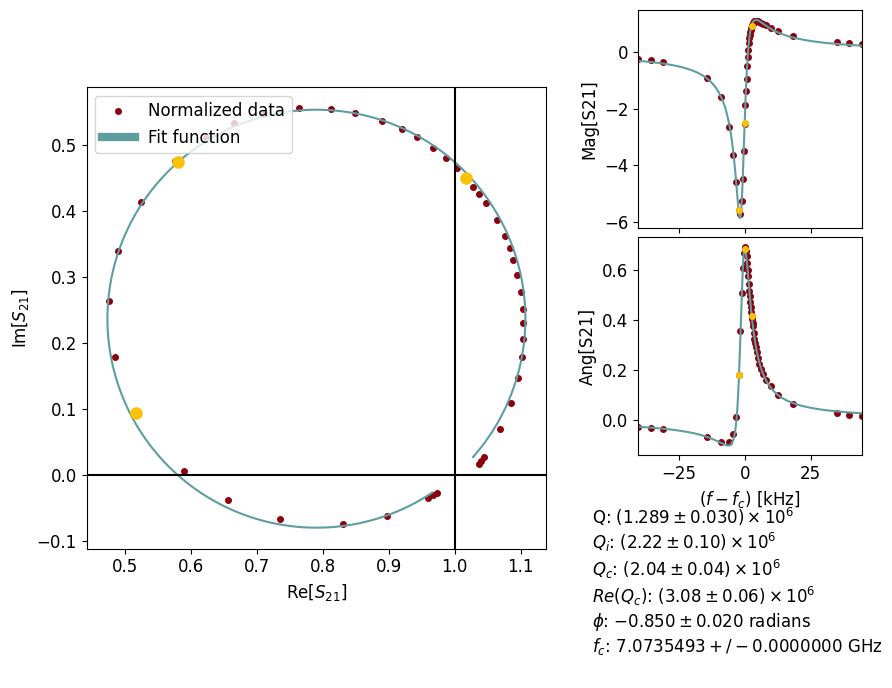

Tau proportionality: 0.0006774077705078415
Pin -70.0, N photons: 2.86e+08, navg: 0
Next time: 0.00 min, q_adj: 0.946
Expected time: 0.09 min
Time elapsed: 0.44 min, expected time: 0.09 min


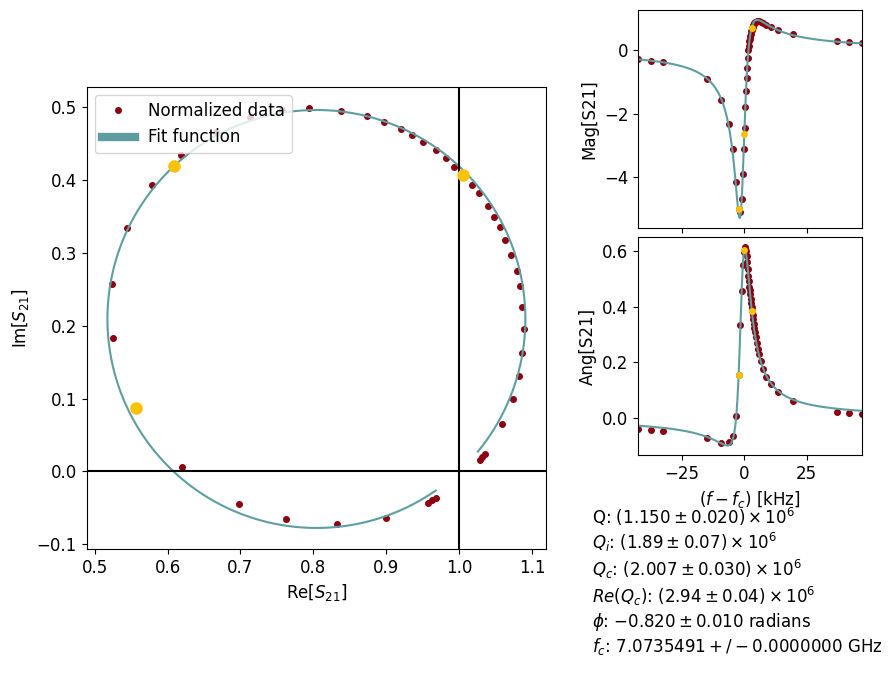

Tau proportionality: 0.002708229309091108
Pin -75.0, N photons: 7.49e+07, navg: 0
Next time: 0.00 min, q_adj: 0.930
Expected time: 0.05 min
Time elapsed: 0.22 min, expected time: 0.05 min


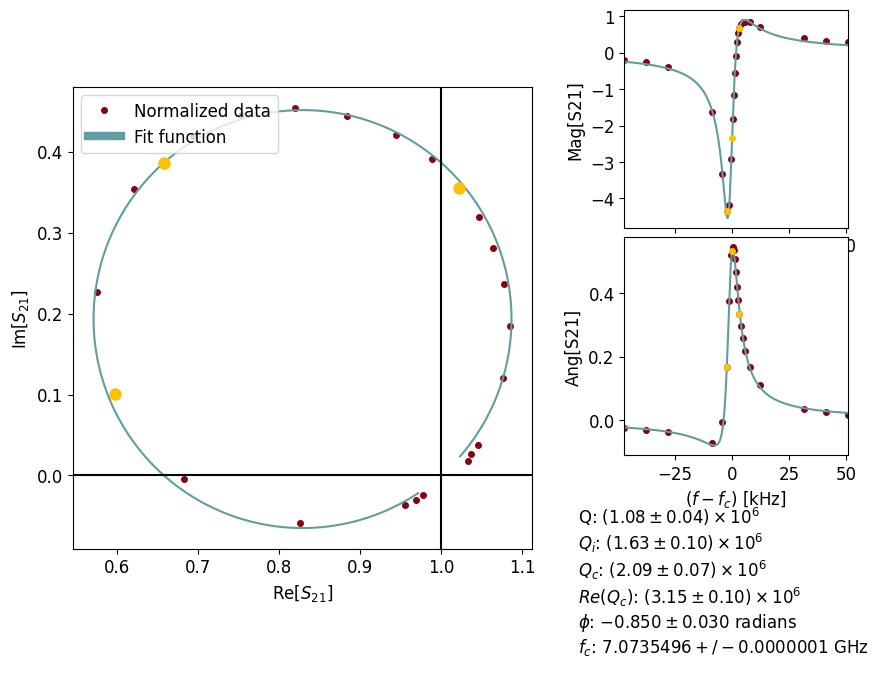

Fit parameters: [-5511872.0754  3004599.4051        0.0176        1.714 ]
Tau proportionality: 0.010223771681631836
Pin -80.0, N photons: 1.9e+07, navg: 0
Next time: 0.00 min, q_adj: 0.875
Expected time: 0.05 min
Time elapsed: 0.22 min, expected time: 0.05 min


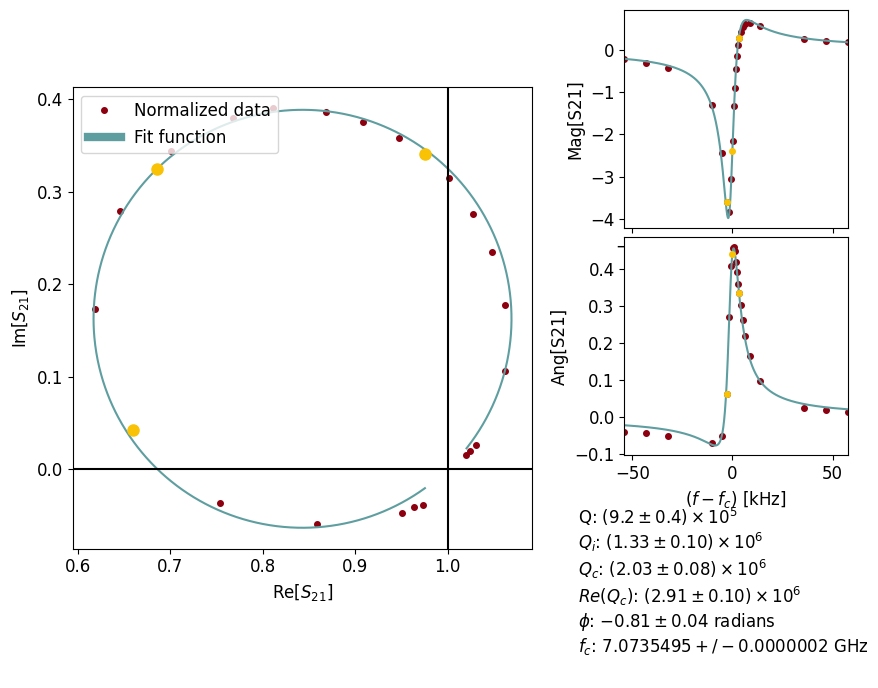

Fit parameters: [-3391000.2387  2835819.2271        0.0002        1.5326]
Tau proportionality: 0.04571474354423564
Pin -85.0, N photons: 4.58e+06, navg: 0
Next time: 0.00 min, q_adj: 0.909
Expected time: 0.05 min
Time elapsed: 0.22 min, expected time: 0.05 min
Qi err: 0.01403887407217049


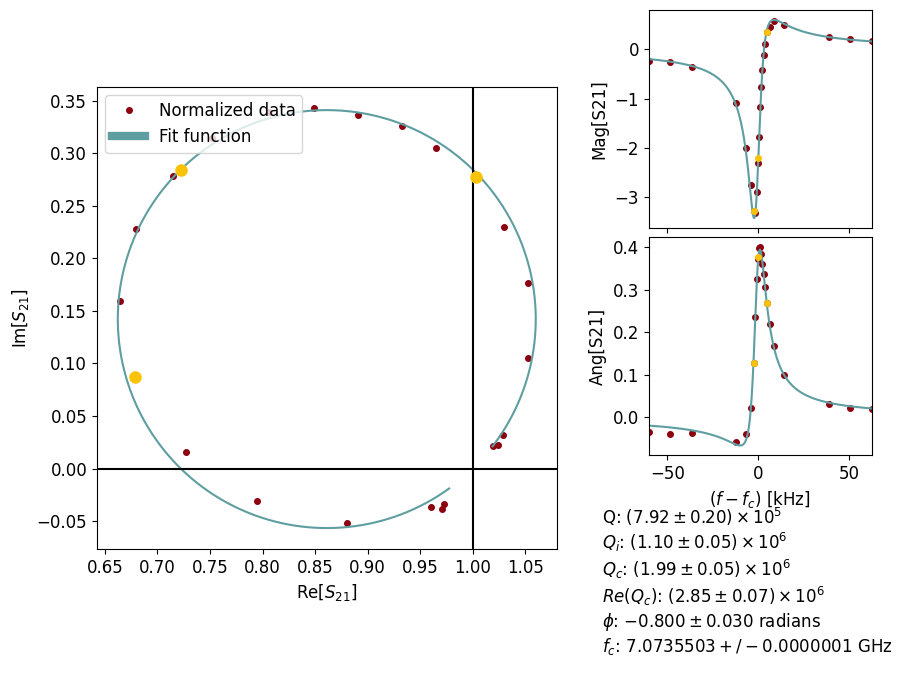

Fit parameters: [-4000863.353   2663416.1706        0.            1.2591]
Tau proportionality: 0.17802348172430477
Pin -90.0, N photons: 1.09e+06, navg: 0
Next time: 0.00 min, q_adj: 0.835
Expected time: 0.05 min
Time elapsed: 0.22 min, expected time: 0.05 min
Qi err: 0.016159288211539256


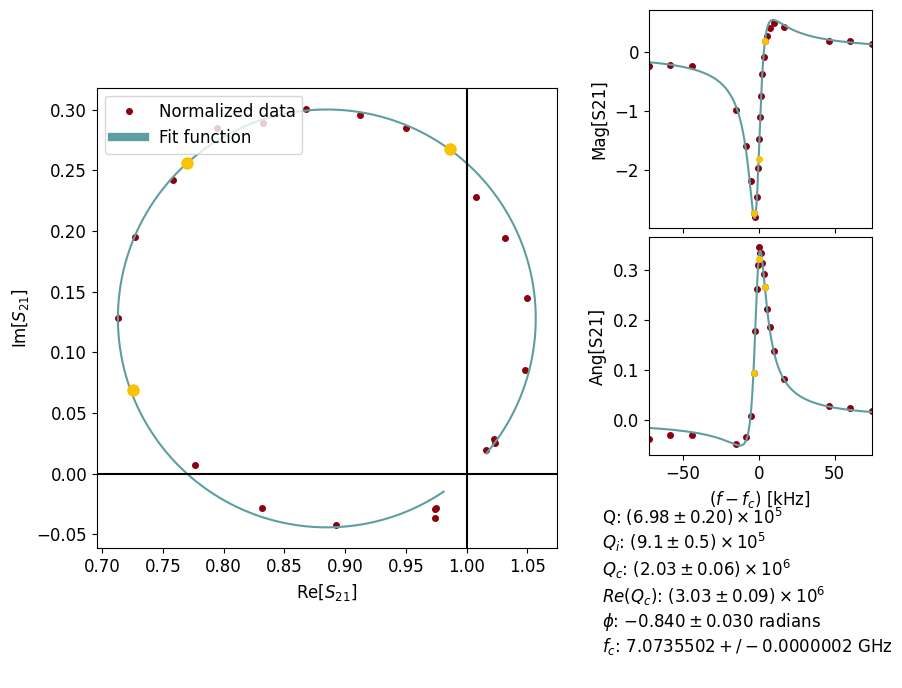

g:\My Drive\Projects\Materials\materials-software\scresonators\measurement\vna_measurement.py:800: OptimizeWarning: Covariance of the parameters could not be estimated
  p, err = curve_fit(q_fitn, photon_numbers, qi_values, p0=p)


Fit parameters: [49379486.4561  2631861.5023      767.9647      -10.302 ]
Tau proportionality: 0.7588844661539794
Pin -95.0, N photons: 2.56e+05, navg: 0
Next time: 0.00 min, q_adj: 0.861
Expected time: 0.05 min
Time elapsed: 0.22 min, expected time: 0.05 min
Qi err: 0.020165948639831885


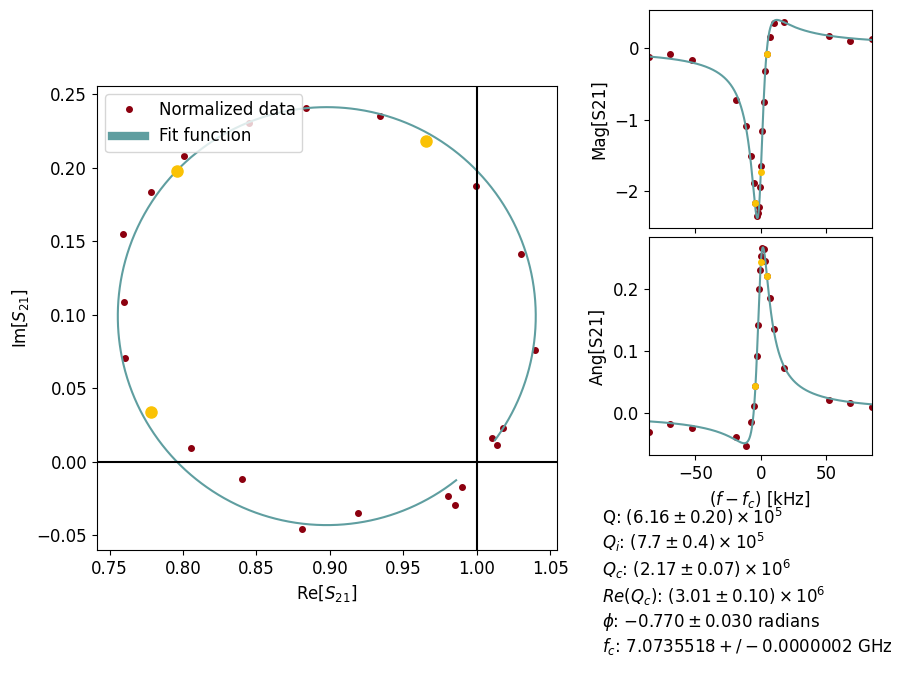

Fit parameters: [42847839.1826  2479362.1047      687.6445       -7.0499]
Tau proportionality: 3.3737635956286742
Pin -100.0, N photons: 5.75e+04, navg: 1
Next time: 0.00 min, q_adj: 0.843
Expected time: 0.05 min
Time elapsed: 0.22 min, expected time: 0.05 min
Qi err: 0.01573078959461625


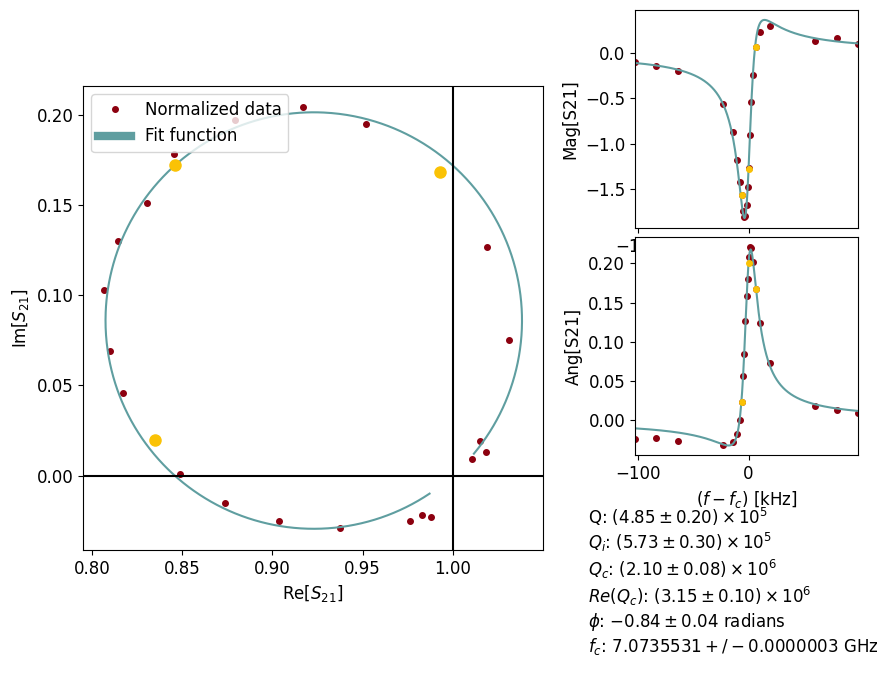

Fit parameters: [1117056.4176 3228289.3717 1160166.8937       1.4977]
Tau proportionality: 16.985325147804456
Pin -105.0, N photons: 1.14e+04, navg: 8
Next time: 0.03 min, q_adj: 0.793
Expected time: 0.05 min
Time elapsed: 0.22 min, expected time: 0.05 min
Qi err: 0.015038890089481451


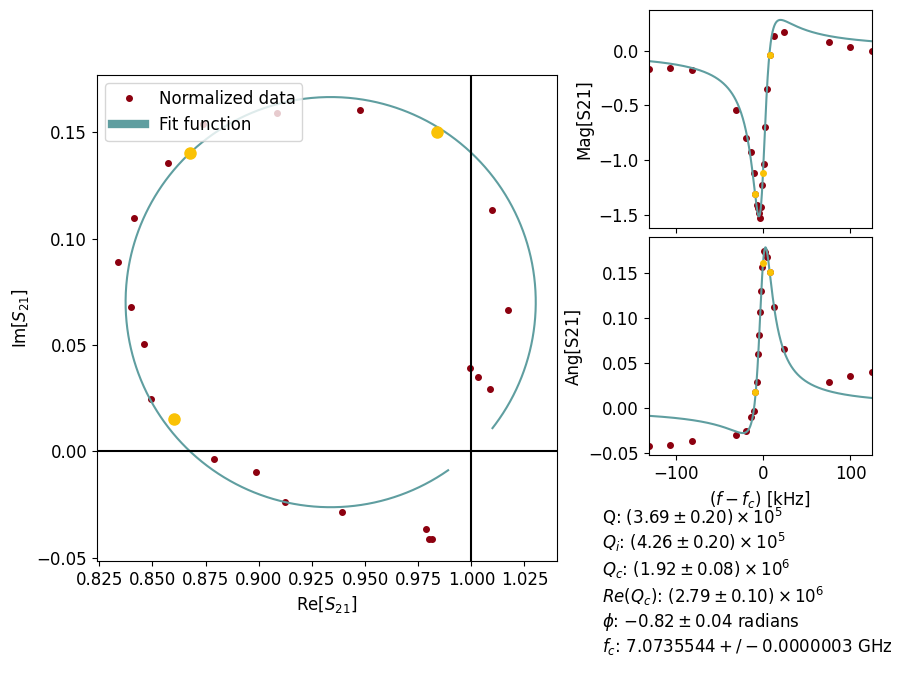

Fit parameters: [ 881977.6744 3235744.9404  560134.0608       1.3407]
Tau proportionality: 77.88591595835132
Pin -110.0, N photons: 2.49e+03, navg: 34
Next time: 0.13 min, q_adj: 0.830
Expected time: 0.13 min
Time elapsed: 0.31 min, expected time: 0.13 min
Qi err: 0.019667348487361506


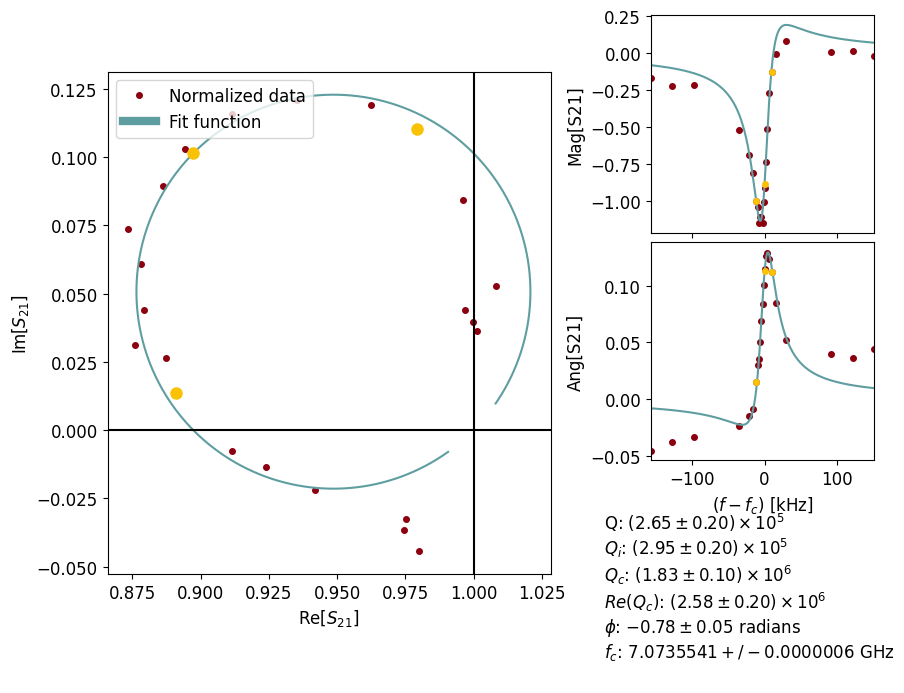

Fit parameters: [ 690725.0688 3245929.7475  254171.159        1.213 ]
Tau proportionality: 452.6836879459541
Pin -115.0, N photons: 429, navg: 250
Next time: 0.96 min, q_adj: 0.738
Expected time: 0.96 min


Time elapsed: 1.14 min, expected time: 0.96 min
Qi err: 0.007979477669195495


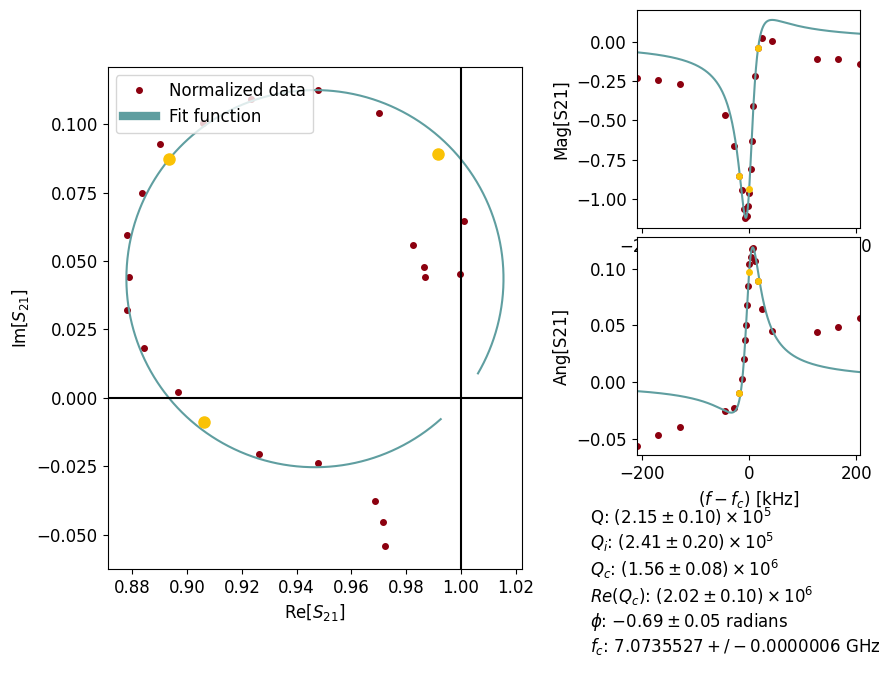

Fit parameters: [ 576498.6691 3254582.7591  139417.4638       1.1373]
Tau proportionality: 1621.6144834605175
Pin -120.0, N photons: 120, navg: 551
Next time: 2.11 min, q_adj: 0.940
Expected time: 2.11 min
Time elapsed: 2.31 min, expected time: 2.11 min
Qi err: 0.015159617244655763


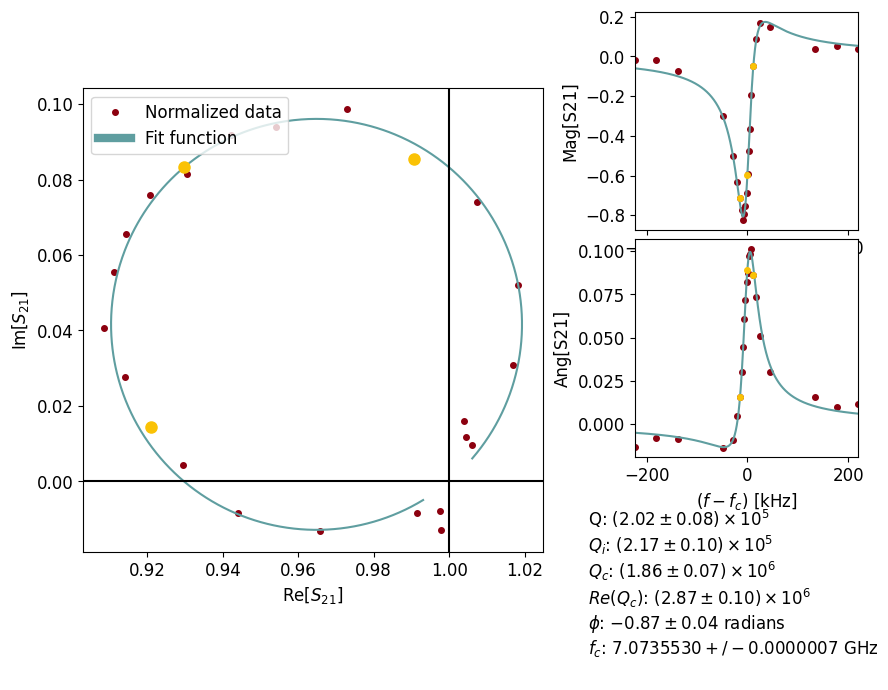

Fit parameters: [ 491736.1377 3262811.5922   81709.5059       1.0817]
Tau proportionality: 7271.532547114213
Pin -125.0, N photons: 26.7, navg: 3093
Next time: 11.86 min, q_adj: 0.840
Expected time: 11.86 min


Time elapsed: 12.13 min, expected time: 11.86 min
Qi err: 0.01089359667373266
attempt to get argmin of an empty sequence
>Failed to find initial guess for method DCM.  Please manually initialize a guess
Alternative fit failed: cannot access local variable 'init_guess' where it is not associated with a value
Fit parameters: [ 441299.319  3268672.8142   56701.7271       1.0487]
Tau proportionality: 21832.07968560544
Pin -130.0, N photons: 8.89, navg: 6219
Next time: 23.84 min, q_adj: 1.026
Expected time: 23.84 min


Time elapsed: 24.22 min, expected time: 23.84 min
Qi err: 0.012867497475325073


c:\Users\circu\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(Qc=235509.55397137918) = 0.0 < max(sigmas)
  warn(errmsg)
G:\My Drive/Projects/Materials/materials-software\scresonators\fit_resonator\fit.py:1046: RuntimeWarning: divide by zero encountered in scalar divide
  Qc_Re_pos = 1 / np.real(np.exp(1j * fit_params[3]) / ci["Qc"][2][1])


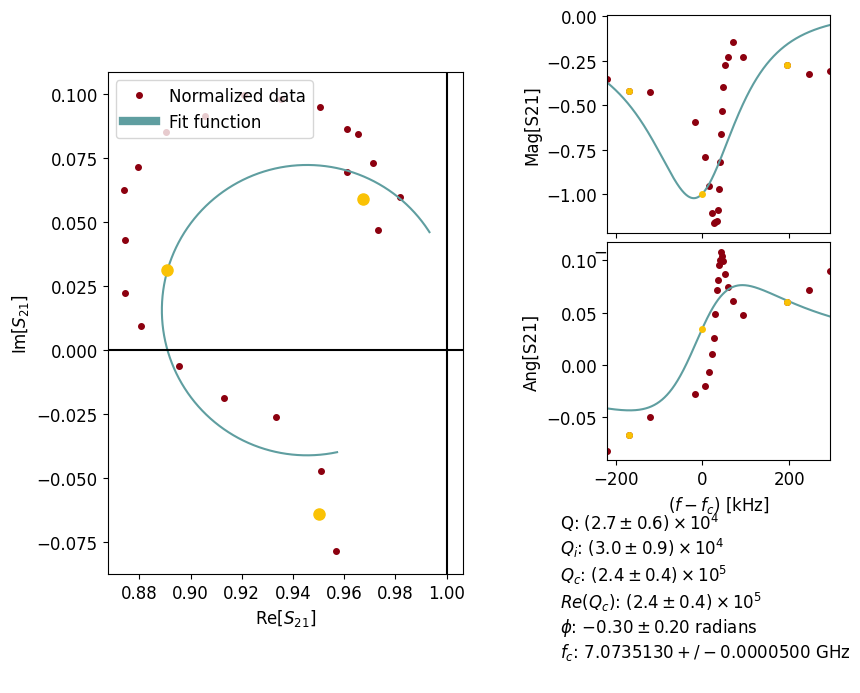

Fit parameters: [ 408344.0802 3272839.1504   43644.9636       1.0275]
Tau proportionality: 68867.46585209624
Pin -135.0, N photons: 2.82, navg: 20609
Next time: 79.00 min, q_adj: 1.001
Stopping frequency 7.07355 GHz


In [27]:
freq_list = [5.9850e+09,7.9910e+09, 7.4802e+09, 7.0736e+09]
        
custom_config = {"freqs":np.array(freq_list), "att":50,'type':'single','base_path':base_path, 'nvals':21,"pow_start":-0,"avg_corr":0.3,'npoints':23}
#custom_config = {"freqs":np.array(freq_list), "att":50,'type':'lin','base_path':base_path, 'nvals':21,"pow_start":0}
    # Update default config with custom values
config = vna_measurement.get_default_power_sweep_config(custom_config)

results = vna_measurement.power_sweep_v2(config, VNA)

## Power Sweeps

### Linear

In [ ]:
# Create the directory
%matplotlib inline
expt_path = os.path.join(base_path, 'powersweep9')
#os.makedirs(expt_path)
#5.82616211,6.078942394,6.4321482,6.6747425,6.7438394,6.90156518,7.459121,7.7149925
#
freqs = np.array([5.516760, 5.820845, 6.091775, 6.336550, 6.37702, 6.69244, 7.05642, 7.382927])*1e9


lws = np.array([50000, 45000.7040482992, 29440.44324796017, 33479.36291704487, 15733.669746968377, 14120.74423508918, 20936.47067639849, 19784.771902390334])
freqs =np.array([6336551667.277118, 6692449750.952356, 7056424624.127725, 7382937976.60123, 5516761912.680331, 5820847040.102408, 6091775283.094366, 6376983088.432415])

atten=-60
nscans = 18
powers = [-5 + (-5 * i) for i in range(nscans)]
avgs = [np.floor(1.65**i) for i in range(nscans)]
spans =  8*lws
for i, power in enumerate(powers): 
    for freq_center, span in zip(freqs, spans):
        if power+atten<-150: 
            bandwidth=20
            nb_points=70
        elif power+atten<-135:
            bandwidth=50
            nb_points=100
        elif power+atten<-100:
            bandwidth=100
            nb_points=200
        else:
            bandwidth=200
            nb_points=300
        
        if freq_center > 6.3e9 and freq_center < 6.36e9:
            curr_avg = 5*avgs[i]
        elif freq_center>=6.4e9:
            curr_avg = 3*avgs[i]
        else:
            curr_avg = 1*avgs[i]
        
        scan_def = {'freq_center':freq_center, 'span':span,  'bandwidth':bandwidth, 'power':powers[i], 'nb_points':int(nb_points), 'averages':curr_avg}
        file_name = 'res_' + str(freq_center)[:7] + '_' + str(power)[1:] + 'dbm'
        do_vna_scan(file_name, expt_path, scan_def)

### Multiple Linear

In [ ]:
expt_path = os.path.join(base_path, 'powersweep8')
os.makedirs(expt_path)
%matplotlib inline
powers = [-20 + (-5 * i) for i in range(18)]
avgs = [np.floor(1.6**i) for i in range(18)]
vary_param = 'power'

spans = lws * 6
wid = 0.37 # This is the width of non center section (whyyy)
atten=-60
for i, power in enumerate(powers): 
    if atten+power<-150: 
        bandwidth=40
        nb_points=40
    elif atten+power<-130:
        bandwidth=50
        nb_points=45
    elif atten+power<-100:
        bandwidth=100
        nb_points=60
    else:
        bandwidth=200
        nb_points=90
    
    tm = 4*1.5*nb_points/bandwidth*avgs[i]
    signal = avgs[i]/bandwidth*10**(power/20)
    print("time per scan in minutes is", tm/60)
    print('SNR amount is', signal)
    for freq_center, span in zip(freqs, spans):
        if freq_center > 6.3e9 and freq_center < 6.36e9:
            curr_avg = 32*avgs[i]
        elif freq_center>=6.4e9:
            curr_avg = 8*avgs[i]
        else:
            curr_avg = 3*avgs[i]
        print(curr_avg)
        pt_spc = span*wid/2/(nb_points+1)
        cent = freq_center-(1-wid)*span/2

        scan_def = {'freq_center':cent, 'span':wid*span,  'bandwidth':bandwidth, 'power':powers[i], 'nb_points':int(nb_points/4), 'averages':curr_avg}
        file_name = 'res_' + str(freq_center)[:7] + '_' + str(power)[1:] + 'dbm_wide1'
        do_vna_scan(file_name, expt_path, scan_def,plot=False)

        scan_def = {'freq_center':freq_center, 'span':span*(1-2*wid),  'bandwidth':bandwidth, 'power':powers[i], 'nb_points':nb_points, 'averages':curr_avg}
        file_name = 'res_' + str(freq_center)[:7] + '_' + str(power)[1:] + 'dbm_narrow'
        do_vna_scan(file_name, expt_path, scan_def,plot=True)
        
        cent = freq_center+(1-wid)*span/2
        scan_def = {'freq_center':cent, 'span':wid*span,  'bandwidth':bandwidth, 'power':powers[i], 'nb_points':int(nb_points/4), 'averages':curr_avg}
        file_name = 'res_' + str(freq_center)[:7] + '_' + str(power)[1:] + 'dbm_wide2'
        do_vna_scan(file_name, expt_path, scan_def,plot=False)

In [ ]:
expt_path = os.path.join(base_path, 'powersweep8')
os.makedirs(expt_path)
%matplotlib inline
powers = [-20 + (-5 * i) for i in range(18)]
avgs = [np.floor(1.6**i) for i in range(18)]
vary_param = 'power'

spans = lws * 6
wid = 0.37 # This is the width of non center section (whyyy)
atten=-60
for i, power in enumerate(powers): 
    if atten+power<-150: 
        bandwidth=40
        nb_points=40
    elif atten+power<-130:
        bandwidth=50
        nb_points=45
    elif atten+power<-100:
        bandwidth=100
        nb_points=60
    else:
        bandwidth=200
        nb_points=90
    
    tm = 4*1.5*nb_points/bandwidth*avgs[i]
    signal = avgs[i]/bandwidth*10**(power/20)
    print("time per scan in minutes is", tm/60)
    print('SNR amount is', signal)
    for freq_center, span in zip(freqs, spans):
        if freq_center > 6.3e9 and freq_center < 6.36e9:
            curr_avg = 32*avgs[i]
        elif freq_center>=6.4e9:
            curr_avg = 8*avgs[i]
        else:
            curr_avg = 3*avgs[i]
        print(curr_avg)
        pt_spc = span*wid/2/(nb_points+1)
        cent = freq_center-(1-wid)*span/2

        scan_def = {'freq_center':cent, 'span':wid*span,  'bandwidth':bandwidth, 'power':powers[i], 'nb_points':int(nb_points/4), 'averages':curr_avg}
        file_name = 'res_' + str(freq_center)[:7] + '_' + str(power)[1:] + 'dbm_wide1'
        do_vna_scan(file_name, expt_path, scan_def,plot=False)

        scan_def = {'freq_center':freq_center, 'span':span*(1-2*wid),  'bandwidth':bandwidth, 'power':powers[i], 'nb_points':nb_points, 'averages':curr_avg}
        file_name = 'res_' + str(freq_center)[:7] + '_' + str(power)[1:] + 'dbm_narrow'
        do_vna_scan(file_name, expt_path, scan_def,plot=True)
        
        cent = freq_center+(1-wid)*span/2
        scan_def = {'freq_center':cent, 'span':wid*span,  'bandwidth':bandwidth, 'power':powers[i], 'nb_points':int(nb_points/4), 'averages':curr_avg}
        file_name = 'res_' + str(freq_center)[:7] + '_' + str(power)[1:] + 'dbm_wide2'
        do_vna_scan(file_name, expt_path, scan_def,plot=False)